In [ ]:
pip install mediapipe

     |████████████████████████████████| 32.3 MB 9.6 kB/s 


In [ ]:
import cv2
import mediapipe as mp
import time

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [19]:
class PoseDetector:

    def __init__(self, mode = False, upBody = False, smooth=True, detectionCon = 0.5, trackCon = 0.5):

        self.mode = mode
        self.upBody = upBody
        self.smooth = smooth
        self.detectionCon = detectionCon
        self.trackCon = trackCon

        self.mpDraw = mp.solutions.drawing_utils
        self.mpPose = mp.solutions.pose
        self.pose = self.mpPose.Pose(self, self.mode, self.upBody, self.smooth, self.detectionCon, self.trackCon)

    def findPose(self, img, draw=True):
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        self.results = self.pose.process(imgRGB)
        #print(results.pose_landmarks)
        if self.results.pose_landmarks:
            if draw:
                self.mpDraw.draw_landmarks(img, self.results.pose_landmarks, self.mpPose.POSE_CONNECTIONS)

        return img

    def getPosition(self, img, draw=True):
        lmList= []
        if self.results.pose_landmarks:
            for id, lm in enumerate(self.results.pose_landmarks.landmark):
                h, w, c = img.shape
                #print(id, lm)
                cx, cy = int(lm.x * w), int(lm.y * h)
                lmList.append([id, cx, cy])
                if draw:
                    cv2.circle(img, (cx, cy), 5, (255, 0, 0), cv2.FILLED)
        return lmList

def main():
        cap = cv2.VideoCapture('/content/gdrive/MyDrive/Colab Notebooks/a.mp4')
        pTime = 0
        detector = PoseDetector()
        while True:
            success, img = cap.read()
            img = detector.findPose(img)
            lmList = detector.getPosition(img)
            print(lmList)

            cTime = time.time()
            fps = 1 / (cTime - pTime)
            pTime = cTime

            cv2.putText(img, str(int(fps)), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
            cv2_imshow(img)
            cv2.waitKey(1)

[[0, 337, 107], [1, 339, 102], [2, 341, 102], [3, 343, 102], [4, 335, 103], [5, 333, 103], [6, 332, 103], [7, 346, 104], [8, 330, 105], [9, 340, 111], [10, 335, 111], [11, 363, 132], [12, 317, 133], [13, 375, 164], [14, 315, 167], [15, 365, 193], [16, 322, 195], [17, 363, 202], [18, 323, 204], [19, 360, 201], [20, 326, 203], [21, 360, 198], [22, 327, 200], [23, 355, 196], [24, 331, 197], [25, 355, 249], [26, 327, 252], [27, 354, 292], [28, 333, 290], [29, 353, 296], [30, 338, 293], [31, 354, 309], [32, 334, 311]]


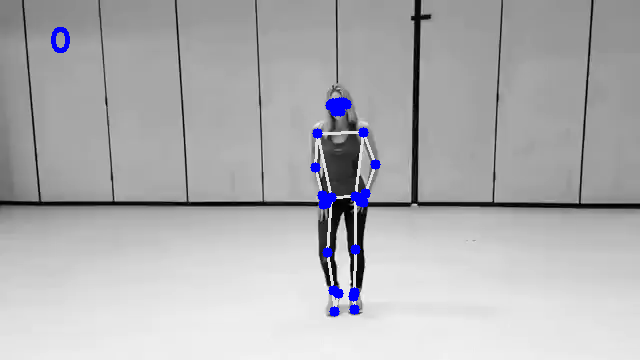

[]


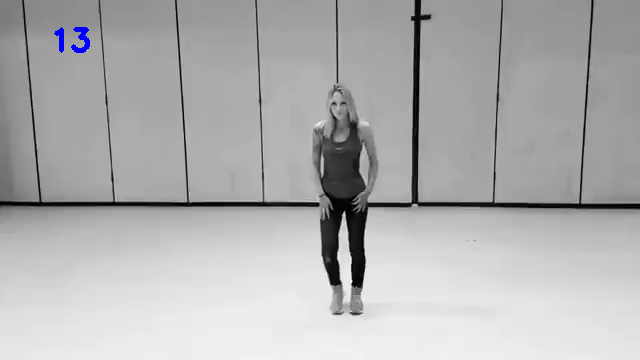

[[0, 337, 108], [1, 340, 104], [2, 342, 104], [3, 344, 104], [4, 335, 104], [5, 334, 104], [6, 333, 104], [7, 348, 105], [8, 332, 105], [9, 341, 113], [10, 335, 112], [11, 365, 132], [12, 319, 131], [13, 373, 165], [14, 315, 166], [15, 367, 193], [16, 322, 195], [17, 365, 202], [18, 322, 204], [19, 361, 201], [20, 326, 204], [21, 361, 199], [22, 327, 200], [23, 355, 195], [24, 331, 196], [25, 356, 248], [26, 331, 252], [27, 355, 293], [28, 339, 292], [29, 356, 297], [30, 342, 297], [31, 355, 310], [32, 338, 310]]


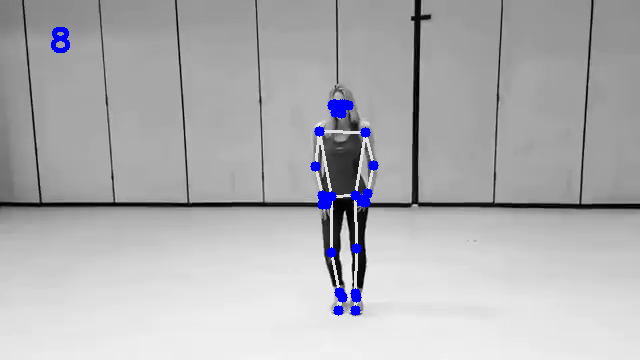

[[0, 339, 109], [1, 342, 104], [2, 343, 104], [3, 345, 104], [4, 337, 104], [5, 335, 104], [6, 334, 105], [7, 348, 106], [8, 332, 106], [9, 343, 113], [10, 336, 112], [11, 364, 133], [12, 319, 133], [13, 371, 166], [14, 316, 168], [15, 367, 194], [16, 323, 197], [17, 366, 202], [18, 323, 206], [19, 362, 201], [20, 327, 205], [21, 362, 199], [22, 327, 202], [23, 355, 195], [24, 331, 196], [25, 356, 248], [26, 332, 250], [27, 356, 294], [28, 340, 294], [29, 356, 299], [30, 341, 299], [31, 357, 310], [32, 338, 311]]


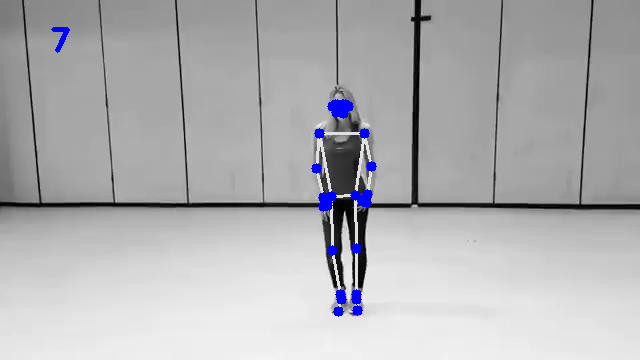

[[0, 339, 106], [1, 342, 103], [2, 344, 103], [3, 346, 103], [4, 337, 102], [5, 336, 102], [6, 334, 103], [7, 349, 106], [8, 332, 105], [9, 343, 111], [10, 336, 111], [11, 363, 132], [12, 318, 135], [13, 369, 166], [14, 318, 171], [15, 367, 194], [16, 324, 199], [17, 365, 204], [18, 325, 209], [19, 361, 202], [20, 328, 209], [21, 361, 200], [22, 328, 204], [23, 358, 194], [24, 335, 199], [25, 358, 247], [26, 335, 250], [27, 356, 292], [28, 341, 294], [29, 354, 296], [30, 345, 299], [31, 361, 309], [32, 335, 307]]


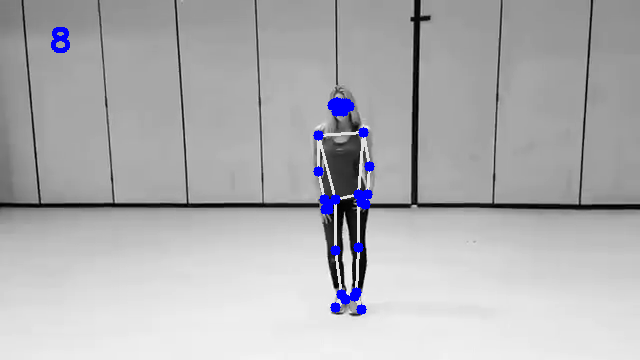

[]


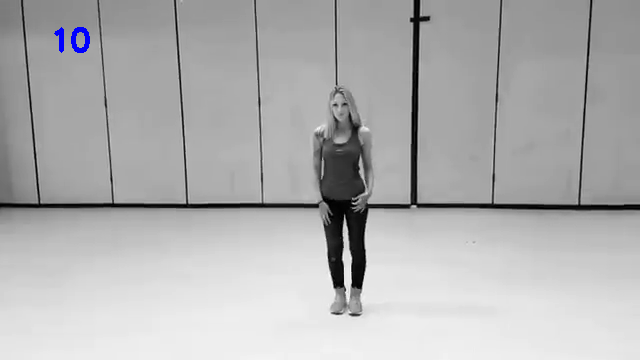

[[0, 339, 107], [1, 342, 102], [2, 343, 103], [3, 345, 103], [4, 337, 103], [5, 336, 103], [6, 334, 103], [7, 349, 106], [8, 332, 105], [9, 343, 112], [10, 336, 112], [11, 364, 133], [12, 319, 136], [13, 369, 168], [14, 316, 173], [15, 364, 197], [16, 322, 203], [17, 362, 205], [18, 323, 212], [19, 359, 203], [20, 326, 211], [21, 358, 200], [22, 327, 207], [23, 356, 196], [24, 332, 198], [25, 355, 248], [26, 333, 252], [27, 354, 294], [28, 338, 293], [29, 354, 299], [30, 342, 299], [31, 352, 311], [32, 336, 311]]


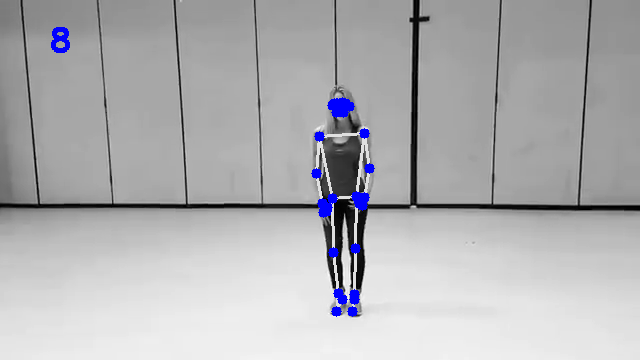

[[0, 339, 108], [1, 341, 103], [2, 343, 103], [3, 345, 104], [4, 337, 104], [5, 335, 104], [6, 334, 104], [7, 348, 106], [8, 332, 106], [9, 342, 112], [10, 337, 112], [11, 363, 135], [12, 317, 137], [13, 371, 168], [14, 317, 173], [15, 363, 192], [16, 323, 200], [17, 361, 201], [18, 324, 210], [19, 357, 199], [20, 327, 209], [21, 357, 197], [22, 328, 206], [23, 354, 195], [24, 331, 196], [25, 354, 247], [26, 332, 249], [27, 354, 293], [28, 338, 291], [29, 353, 298], [30, 341, 296], [31, 353, 309], [32, 338, 310]]


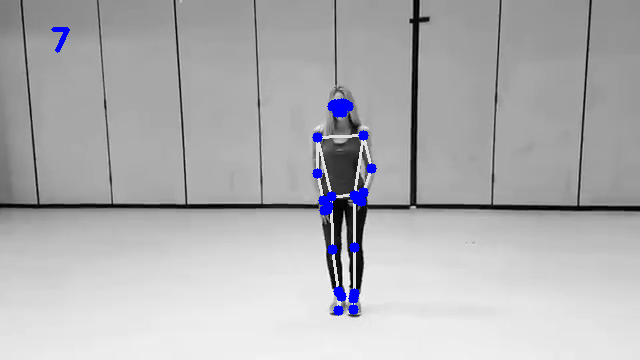

[[0, 339, 108], [1, 342, 103], [2, 344, 103], [3, 345, 103], [4, 337, 104], [5, 335, 104], [6, 334, 104], [7, 348, 105], [8, 331, 106], [9, 343, 112], [10, 337, 112], [11, 363, 132], [12, 319, 134], [13, 372, 166], [14, 314, 169], [15, 362, 190], [16, 323, 199], [17, 359, 198], [18, 324, 209], [19, 355, 197], [20, 328, 208], [21, 355, 194], [22, 328, 204], [23, 355, 195], [24, 331, 196], [25, 354, 248], [26, 331, 250], [27, 353, 294], [28, 338, 292], [29, 352, 299], [30, 341, 297], [31, 353, 311], [32, 336, 311]]


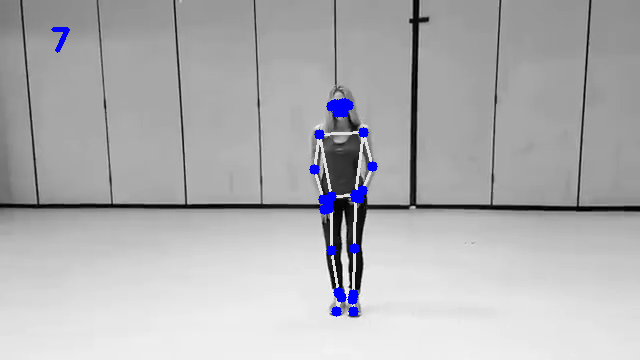

[[0, 340, 107], [1, 342, 102], [2, 344, 102], [3, 345, 102], [4, 338, 103], [5, 336, 103], [6, 334, 103], [7, 348, 104], [8, 331, 104], [9, 343, 112], [10, 338, 112], [11, 362, 131], [12, 318, 134], [13, 371, 164], [14, 314, 170], [15, 363, 188], [16, 326, 199], [17, 361, 196], [18, 326, 208], [19, 357, 195], [20, 330, 206], [21, 357, 192], [22, 330, 202], [23, 355, 196], [24, 332, 197], [25, 353, 249], [26, 332, 251], [27, 353, 294], [28, 339, 294], [29, 353, 299], [30, 341, 300], [31, 354, 311], [32, 336, 311]]


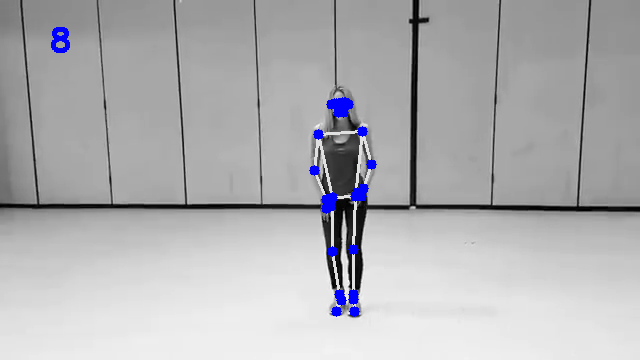

[[0, 340, 107], [1, 342, 103], [2, 344, 103], [3, 346, 103], [4, 338, 103], [5, 336, 103], [6, 334, 104], [7, 349, 105], [8, 332, 106], [9, 343, 112], [10, 337, 112], [11, 363, 131], [12, 318, 135], [13, 371, 164], [14, 315, 168], [15, 363, 189], [16, 326, 197], [17, 361, 197], [18, 327, 206], [19, 357, 195], [20, 330, 204], [21, 357, 193], [22, 331, 201], [23, 355, 196], [24, 332, 197], [25, 353, 249], [26, 332, 251], [27, 352, 295], [28, 339, 294], [29, 352, 299], [30, 342, 299], [31, 353, 308], [32, 336, 310]]


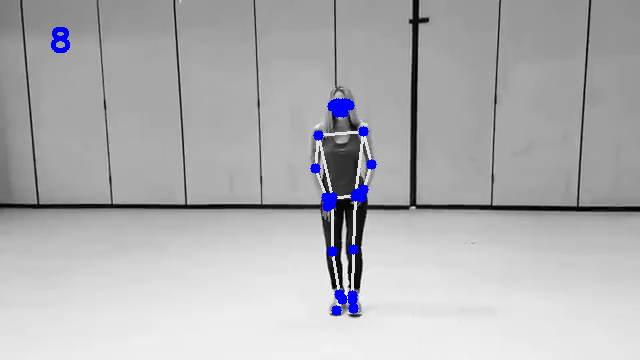

[[0, 339, 107], [1, 341, 103], [2, 343, 103], [3, 345, 103], [4, 337, 103], [5, 335, 103], [6, 334, 103], [7, 348, 105], [8, 331, 105], [9, 342, 112], [10, 337, 112], [11, 362, 131], [12, 318, 135], [13, 370, 164], [14, 315, 169], [15, 365, 188], [16, 326, 198], [17, 363, 197], [18, 327, 207], [19, 360, 196], [20, 330, 205], [21, 360, 193], [22, 331, 201], [23, 355, 196], [24, 333, 197], [25, 353, 250], [26, 332, 251], [27, 353, 296], [28, 337, 294], [29, 352, 302], [30, 340, 300], [31, 353, 312], [32, 335, 311]]


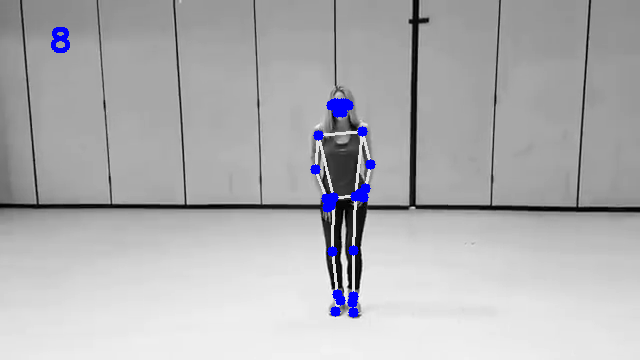

[[0, 340, 109], [1, 343, 104], [2, 344, 104], [3, 346, 104], [4, 338, 104], [5, 336, 105], [6, 335, 105], [7, 349, 106], [8, 332, 107], [9, 344, 112], [10, 338, 113], [11, 364, 131], [12, 319, 135], [13, 369, 163], [14, 317, 169], [15, 365, 190], [16, 327, 198], [17, 363, 198], [18, 328, 207], [19, 360, 198], [20, 332, 205], [21, 359, 195], [22, 333, 202], [23, 355, 196], [24, 333, 197], [25, 352, 248], [26, 332, 251], [27, 352, 296], [28, 337, 292], [29, 352, 302], [30, 339, 299], [31, 351, 312], [32, 336, 310]]


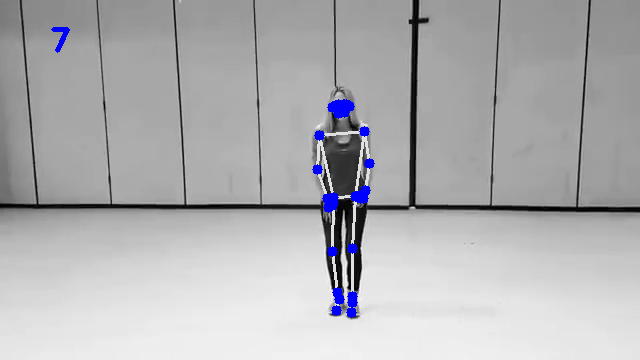

[[0, 340, 108], [1, 343, 104], [2, 345, 104], [3, 346, 103], [4, 337, 104], [5, 336, 104], [6, 334, 104], [7, 348, 105], [8, 333, 106], [9, 344, 112], [10, 338, 112], [11, 363, 133], [12, 320, 136], [13, 368, 165], [14, 317, 169], [15, 365, 193], [16, 326, 199], [17, 365, 200], [18, 327, 208], [19, 361, 200], [20, 330, 206], [21, 360, 197], [22, 331, 203], [23, 356, 197], [24, 333, 197], [25, 353, 250], [26, 332, 251], [27, 351, 298], [28, 338, 296], [29, 351, 305], [30, 339, 303], [31, 351, 313], [32, 336, 312]]


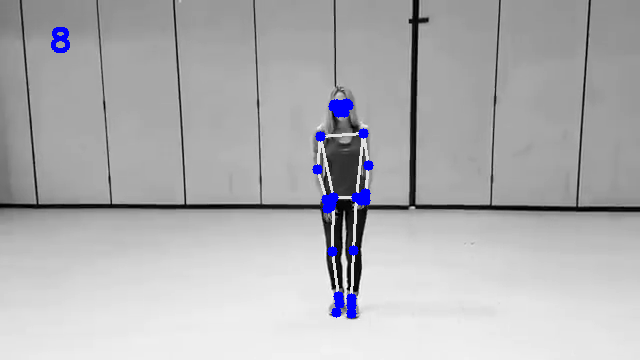

[[0, 341, 109], [1, 343, 105], [2, 345, 105], [3, 347, 105], [4, 338, 105], [5, 336, 106], [6, 335, 106], [7, 349, 106], [8, 334, 108], [9, 345, 113], [10, 339, 113], [11, 363, 135], [12, 321, 136], [13, 369, 167], [14, 317, 169], [15, 365, 196], [16, 325, 199], [17, 364, 204], [18, 327, 207], [19, 361, 203], [20, 330, 206], [21, 361, 200], [22, 331, 203], [23, 355, 197], [24, 331, 197], [25, 353, 249], [26, 333, 251], [27, 351, 297], [28, 339, 296], [29, 351, 303], [30, 340, 300], [31, 353, 310], [32, 338, 311]]


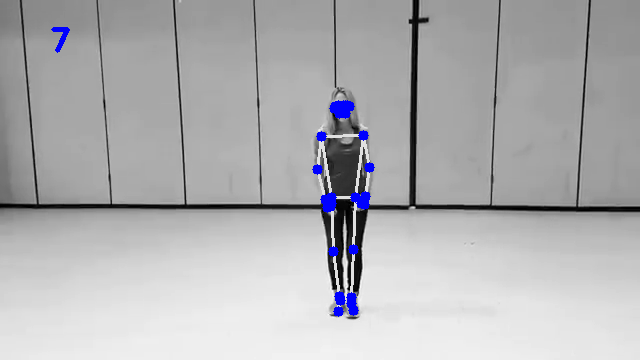

[[0, 343, 110], [1, 345, 106], [2, 346, 105], [3, 348, 105], [4, 340, 106], [5, 338, 106], [6, 336, 107], [7, 350, 107], [8, 334, 109], [9, 346, 114], [10, 340, 114], [11, 364, 134], [12, 322, 137], [13, 369, 168], [14, 317, 167], [15, 365, 197], [16, 324, 193], [17, 363, 204], [18, 325, 200], [19, 360, 203], [20, 328, 199], [21, 360, 200], [22, 329, 197], [23, 355, 198], [24, 332, 198], [25, 355, 250], [26, 336, 251], [27, 352, 296], [28, 339, 294], [29, 351, 302], [30, 340, 298], [31, 353, 310], [32, 338, 311]]


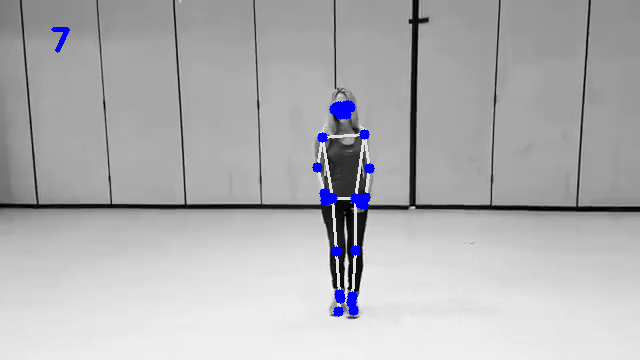

[[0, 342, 109], [1, 344, 105], [2, 346, 105], [3, 348, 105], [4, 339, 105], [5, 338, 105], [6, 336, 105], [7, 350, 107], [8, 335, 107], [9, 346, 115], [10, 339, 114], [11, 364, 135], [12, 323, 138], [13, 368, 168], [14, 322, 166], [15, 365, 196], [16, 324, 151], [17, 364, 204], [18, 323, 146], [19, 361, 203], [20, 324, 142], [21, 361, 200], [22, 326, 143], [23, 356, 199], [24, 332, 201], [25, 356, 252], [26, 341, 251], [27, 352, 299], [28, 336, 299], [29, 348, 304], [30, 336, 305], [31, 354, 313], [32, 339, 314]]


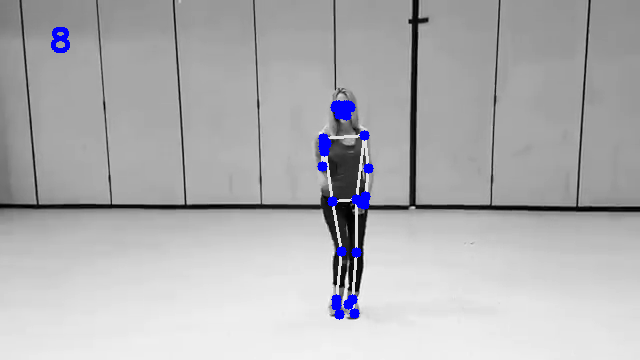

[[0, 342, 111], [1, 345, 106], [2, 347, 106], [3, 348, 106], [4, 340, 106], [5, 338, 107], [6, 337, 107], [7, 350, 108], [8, 335, 109], [9, 347, 115], [10, 340, 114], [11, 364, 135], [12, 324, 137], [13, 368, 170], [14, 321, 171], [15, 364, 196], [16, 327, 147], [17, 362, 204], [18, 327, 141], [19, 359, 204], [20, 326, 138], [21, 359, 201], [22, 328, 141], [23, 353, 199], [24, 331, 199], [25, 354, 250], [26, 348, 248], [27, 350, 297], [28, 335, 289], [29, 346, 303], [30, 333, 293], [31, 355, 313], [32, 341, 308]]


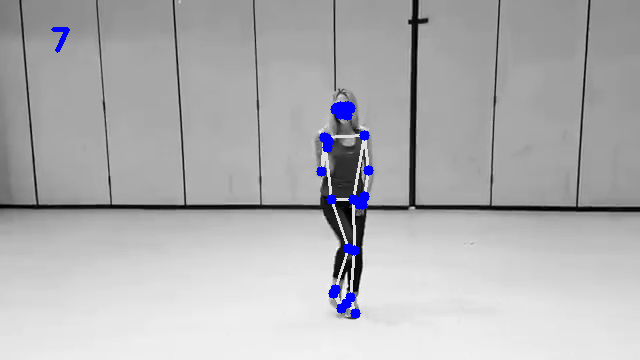

[[0, 342, 110], [1, 344, 106], [2, 346, 106], [3, 348, 106], [4, 340, 106], [5, 338, 106], [6, 336, 106], [7, 351, 108], [8, 334, 108], [9, 346, 115], [10, 340, 115], [11, 365, 137], [12, 323, 135], [13, 368, 173], [14, 320, 170], [15, 362, 200], [16, 331, 148], [17, 360, 207], [18, 334, 144], [19, 357, 207], [20, 333, 140], [21, 357, 205], [22, 333, 142], [23, 351, 198], [24, 331, 199], [25, 354, 244], [26, 355, 237], [27, 346, 291], [28, 338, 273], [29, 340, 294], [30, 333, 274], [31, 347, 309], [32, 339, 296]]


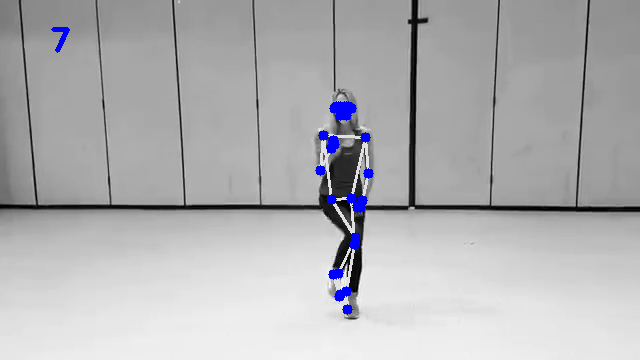

[[0, 342, 112], [1, 344, 107], [2, 345, 107], [3, 347, 107], [4, 339, 107], [5, 338, 107], [6, 336, 108], [7, 350, 109], [8, 334, 110], [9, 345, 116], [10, 340, 117], [11, 363, 135], [12, 322, 134], [13, 369, 170], [14, 322, 169], [15, 364, 194], [16, 337, 146], [17, 362, 202], [18, 341, 142], [19, 359, 201], [20, 340, 138], [21, 359, 200], [22, 339, 139], [23, 352, 195], [24, 331, 195], [25, 360, 245], [26, 357, 228], [27, 348, 291], [28, 339, 267], [29, 336, 293], [30, 334, 266], [31, 350, 309], [32, 343, 289]]


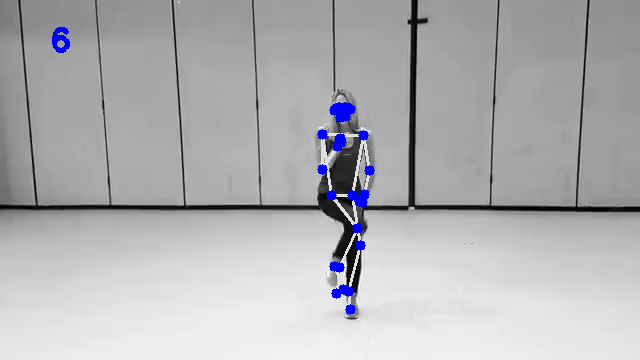

[[0, 340, 111], [1, 342, 107], [2, 345, 107], [3, 346, 106], [4, 337, 107], [5, 336, 107], [6, 335, 107], [7, 349, 109], [8, 334, 110], [9, 344, 117], [10, 338, 116], [11, 363, 136], [12, 323, 132], [13, 368, 171], [14, 325, 163], [15, 362, 196], [16, 347, 142], [17, 360, 203], [18, 353, 136], [19, 358, 201], [20, 353, 136], [21, 357, 199], [22, 351, 137], [23, 348, 196], [24, 328, 195], [25, 361, 237], [26, 356, 220], [27, 345, 286], [28, 343, 252], [29, 339, 292], [30, 339, 253], [31, 352, 313], [32, 338, 272]]


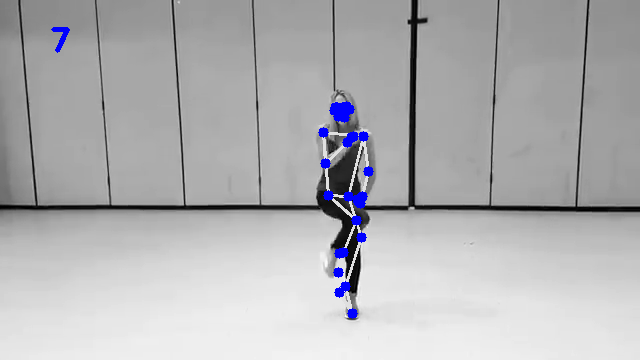

[[0, 339, 113], [1, 342, 108], [2, 344, 107], [3, 346, 107], [4, 337, 108], [5, 336, 108], [6, 334, 108], [7, 349, 109], [8, 333, 110], [9, 343, 118], [10, 337, 117], [11, 364, 137], [12, 325, 133], [13, 368, 167], [14, 331, 159], [15, 360, 196], [16, 350, 144], [17, 359, 200], [18, 355, 138], [19, 357, 198], [20, 350, 129], [21, 356, 197], [22, 350, 132], [23, 348, 195], [24, 328, 194], [25, 358, 241], [26, 353, 212], [27, 349, 296], [28, 341, 249], [29, 335, 290], [30, 337, 252], [31, 354, 313], [32, 350, 269]]


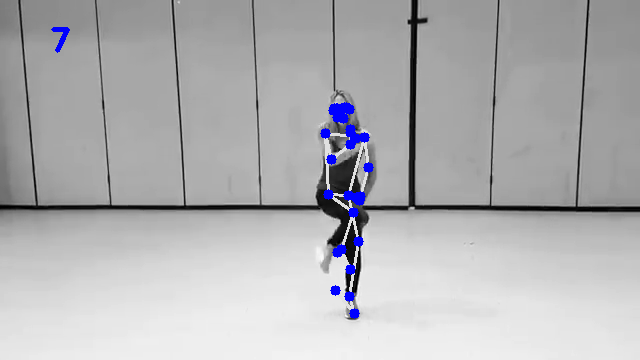

[[0, 346, 139], [1, 346, 135], [2, 347, 135], [3, 348, 143], [4, 343, 135], [5, 342, 135], [6, 341, 135], [7, 347, 137], [8, 338, 136], [9, 347, 142], [10, 343, 142], [11, 353, 158], [12, 330, 152], [13, 366, 179], [14, 342, 156], [15, 363, 188], [16, 357, 147], [17, 363, 190], [18, 360, 144], [19, 361, 189], [20, 357, 145], [21, 360, 189], [22, 356, 147], [23, 342, 203], [24, 328, 201], [25, 359, 227], [26, 349, 228], [27, 333, 253], [28, 323, 246], [29, 327, 254], [30, 318, 245], [31, 332, 266], [32, 321, 261]]


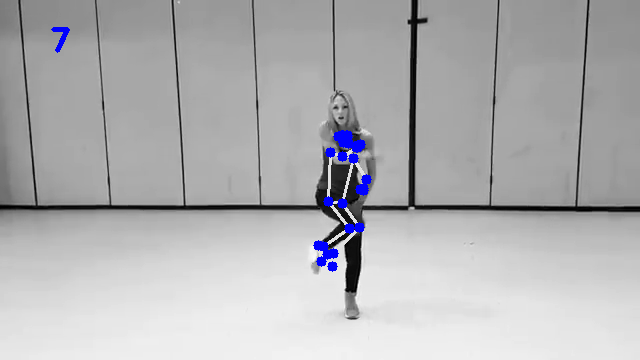

[[0, 339, 113], [1, 341, 109], [2, 343, 108], [3, 344, 108], [4, 337, 109], [5, 336, 109], [6, 334, 109], [7, 348, 109], [8, 333, 111], [9, 343, 118], [10, 337, 118], [11, 364, 132], [12, 327, 135], [13, 371, 166], [14, 345, 162], [15, 349, 174], [16, 369, 168], [17, 344, 180], [18, 375, 171], [19, 341, 177], [20, 375, 170], [21, 342, 175], [22, 373, 168], [23, 349, 199], [24, 328, 197], [25, 355, 247], [26, 348, 235], [27, 350, 298], [28, 315, 252], [29, 345, 305], [30, 309, 251], [31, 356, 315], [32, 308, 275]]


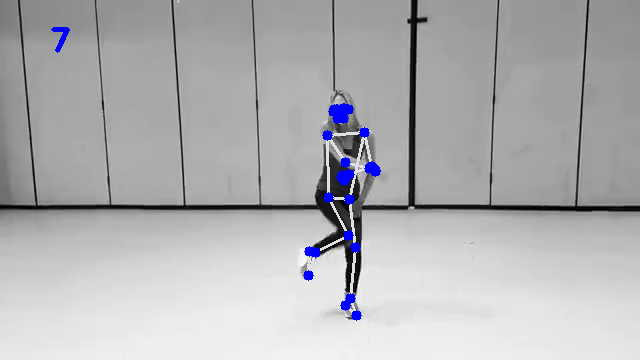

[[0, 340, 113], [1, 342, 108], [2, 344, 107], [3, 345, 107], [4, 337, 108], [5, 336, 109], [6, 335, 109], [7, 349, 108], [8, 334, 110], [9, 344, 117], [10, 338, 117], [11, 365, 133], [12, 327, 134], [13, 362, 164], [14, 341, 172], [15, 349, 166], [16, 363, 177], [17, 346, 168], [18, 369, 183], [19, 346, 166], [20, 368, 181], [21, 346, 165], [22, 366, 179], [23, 350, 200], [24, 329, 200], [25, 355, 250], [26, 343, 245], [27, 349, 297], [28, 302, 260], [29, 346, 303], [30, 296, 259], [31, 356, 316], [32, 294, 283]]


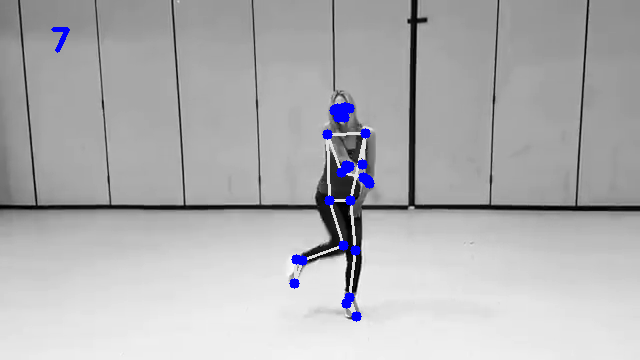

[[0, 341, 110], [1, 343, 105], [2, 345, 105], [3, 347, 105], [4, 339, 106], [5, 338, 107], [6, 337, 107], [7, 350, 107], [8, 336, 109], [9, 345, 114], [10, 340, 115], [11, 366, 134], [12, 331, 135], [13, 367, 169], [14, 342, 167], [15, 357, 201], [16, 354, 197], [17, 355, 210], [18, 355, 207], [19, 353, 209], [20, 355, 205], [21, 353, 206], [22, 355, 202], [23, 351, 200], [24, 329, 199], [25, 357, 254], [26, 328, 251], [27, 350, 297], [28, 288, 272], [29, 346, 303], [30, 285, 270], [31, 355, 316], [32, 284, 296]]


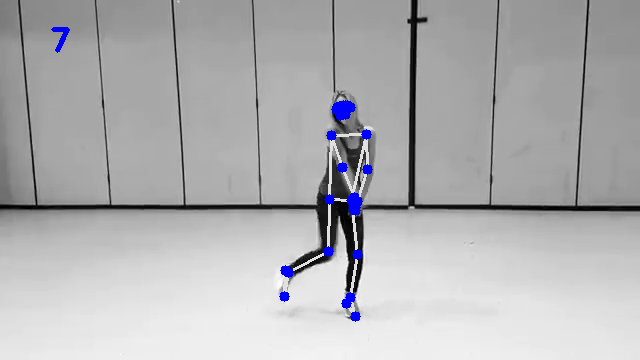

[[0, 345, 109], [1, 346, 105], [2, 348, 105], [3, 349, 105], [4, 343, 105], [5, 342, 105], [6, 341, 106], [7, 352, 108], [8, 340, 109], [9, 348, 113], [10, 344, 113], [11, 364, 133], [12, 334, 134], [13, 365, 168], [14, 335, 170], [15, 356, 199], [16, 341, 201], [17, 355, 208], [18, 343, 212], [19, 352, 207], [20, 344, 212], [21, 351, 204], [22, 344, 207], [23, 351, 202], [24, 331, 199], [25, 359, 254], [26, 307, 248], [27, 350, 297], [28, 281, 286], [29, 346, 301], [30, 278, 289], [31, 356, 314], [32, 285, 307]]


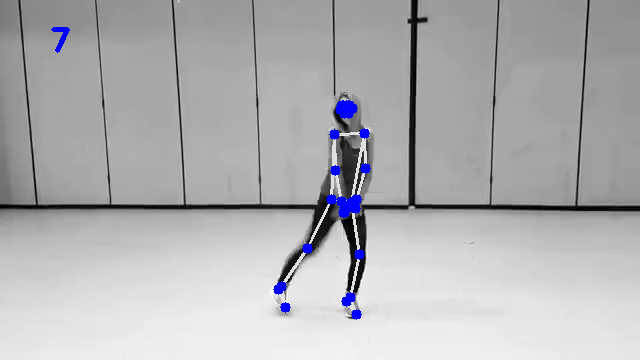

[[0, 351, 111], [1, 352, 107], [2, 354, 107], [3, 355, 108], [4, 349, 107], [5, 348, 107], [6, 346, 107], [7, 356, 111], [8, 344, 111], [9, 353, 116], [10, 349, 115], [11, 364, 137], [12, 335, 136], [13, 361, 173], [14, 327, 167], [15, 358, 202], [16, 322, 202], [17, 358, 212], [18, 319, 211], [19, 355, 211], [20, 321, 213], [21, 354, 208], [22, 323, 209], [23, 351, 205], [24, 330, 201], [25, 360, 254], [26, 298, 243], [27, 349, 296], [28, 277, 284], [29, 345, 301], [30, 275, 287], [31, 356, 314], [32, 280, 305]]


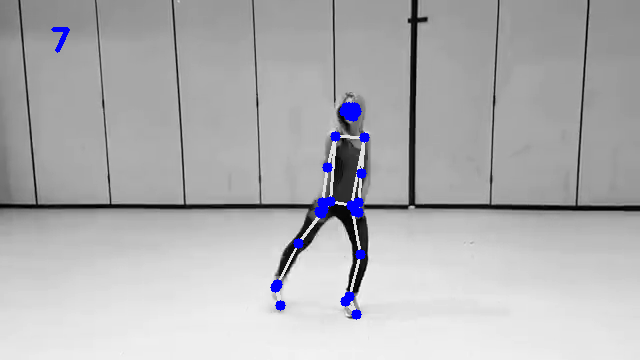

[[0, 353, 111], [1, 356, 107], [2, 357, 107], [3, 359, 107], [4, 351, 106], [5, 350, 106], [6, 348, 106], [7, 360, 110], [8, 346, 108], [9, 356, 115], [10, 350, 114], [11, 367, 138], [12, 333, 134], [13, 362, 171], [14, 318, 165], [15, 363, 200], [16, 305, 198], [17, 362, 209], [18, 301, 205], [19, 360, 209], [20, 304, 205], [21, 360, 206], [22, 306, 203], [23, 351, 205], [24, 326, 200], [25, 358, 255], [26, 302, 242], [27, 350, 297], [28, 274, 268], [29, 345, 302], [30, 271, 270], [31, 354, 315], [32, 265, 284]]


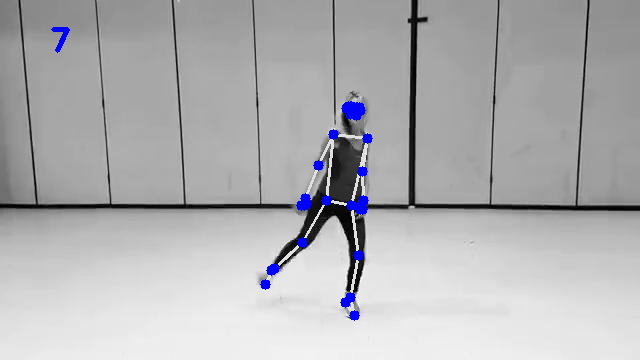

[[0, 354, 110], [1, 357, 106], [2, 358, 106], [3, 360, 106], [4, 353, 105], [5, 351, 105], [6, 350, 105], [7, 362, 109], [8, 347, 106], [9, 356, 115], [10, 352, 114], [11, 370, 139], [12, 329, 132], [13, 366, 171], [14, 309, 161], [15, 364, 198], [16, 293, 187], [17, 363, 206], [18, 289, 194], [19, 361, 205], [20, 291, 194], [21, 360, 202], [22, 293, 192], [23, 350, 201], [24, 326, 198], [25, 353, 253], [26, 301, 239], [27, 349, 297], [28, 274, 255], [29, 346, 301], [30, 272, 255], [31, 352, 314], [32, 260, 268]]


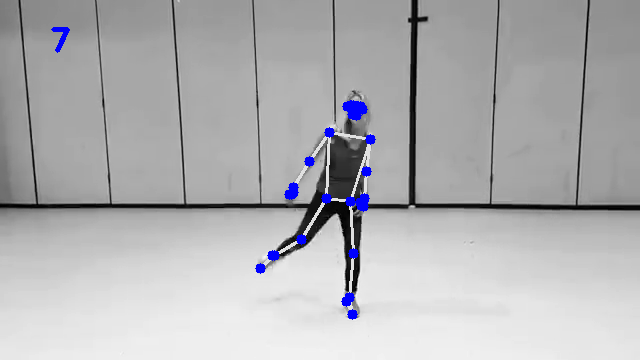

[[0, 352, 110], [1, 355, 106], [2, 357, 106], [3, 359, 107], [4, 350, 105], [5, 349, 105], [6, 347, 105], [7, 361, 109], [8, 345, 106], [9, 355, 115], [10, 349, 113], [11, 368, 140], [12, 327, 130], [13, 364, 170], [14, 305, 155], [15, 363, 193], [16, 289, 179], [17, 362, 202], [18, 285, 187], [19, 359, 200], [20, 287, 188], [21, 359, 198], [22, 288, 186], [23, 347, 199], [24, 322, 195], [25, 350, 251], [26, 296, 231], [27, 350, 297], [28, 282, 246], [29, 348, 301], [30, 281, 251], [31, 350, 313], [32, 268, 260]]


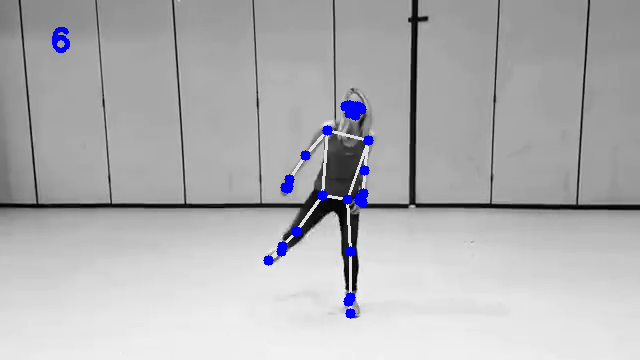

[[0, 347, 106], [1, 350, 102], [2, 352, 102], [3, 354, 102], [4, 345, 101], [5, 344, 101], [6, 342, 101], [7, 357, 104], [8, 341, 102], [9, 350, 112], [10, 343, 110], [11, 366, 135], [12, 324, 125], [13, 365, 164], [14, 304, 151], [15, 357, 191], [16, 289, 173], [17, 355, 200], [18, 285, 180], [19, 353, 198], [20, 287, 181], [21, 353, 196], [22, 290, 179], [23, 343, 196], [24, 320, 191], [25, 347, 249], [26, 290, 225], [27, 351, 294], [28, 294, 236], [29, 351, 299], [30, 298, 238], [31, 349, 312], [32, 285, 251]]


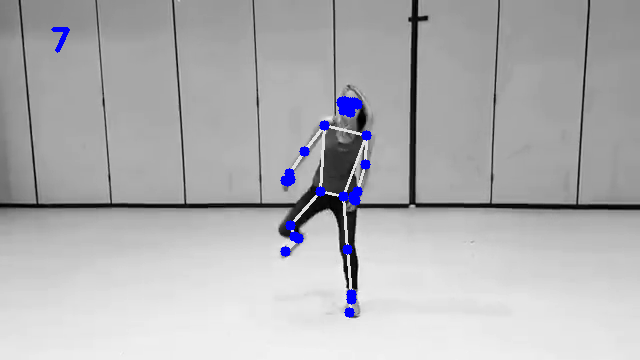

[[0, 341, 102], [1, 345, 99], [2, 347, 99], [3, 349, 99], [4, 341, 98], [5, 340, 98], [6, 339, 97], [7, 353, 102], [8, 339, 99], [9, 344, 108], [10, 339, 106], [11, 365, 134], [12, 323, 120], [13, 367, 168], [14, 306, 148], [15, 352, 190], [16, 291, 172], [17, 349, 199], [18, 288, 179], [19, 346, 196], [20, 291, 180], [21, 346, 193], [22, 292, 177], [23, 341, 193], [24, 316, 188], [25, 345, 247], [26, 283, 220], [27, 352, 294], [28, 307, 234], [29, 353, 300], [30, 312, 237], [31, 343, 311], [32, 299, 253]]


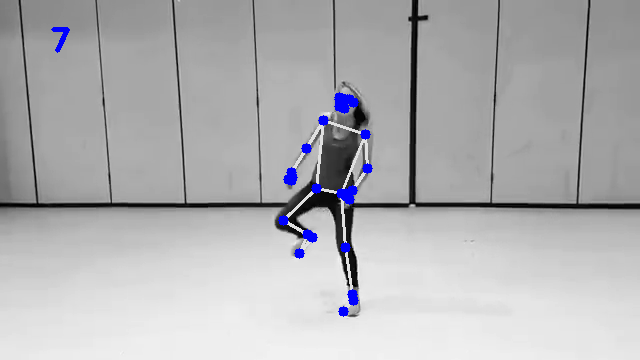

[[0, 338, 102], [1, 342, 98], [2, 343, 98], [3, 345, 98], [4, 338, 97], [5, 337, 97], [6, 336, 97], [7, 349, 100], [8, 336, 99], [9, 341, 107], [10, 336, 106], [11, 361, 128], [12, 323, 119], [13, 367, 161], [14, 310, 145], [15, 351, 186], [16, 296, 170], [17, 346, 195], [18, 293, 177], [19, 344, 192], [20, 296, 178], [21, 344, 190], [22, 297, 176], [23, 338, 191], [24, 316, 186], [25, 338, 243], [26, 279, 217], [27, 353, 287], [28, 309, 237], [29, 354, 291], [30, 316, 239], [31, 345, 306], [32, 301, 258]]


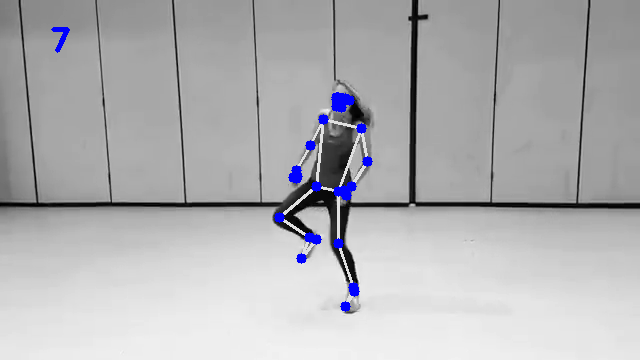

[[0, 332, 100], [1, 335, 96], [2, 336, 95], [3, 338, 95], [4, 332, 96], [5, 331, 96], [6, 330, 96], [7, 343, 97], [8, 332, 98], [9, 335, 105], [10, 332, 104], [11, 357, 125], [12, 325, 118], [13, 366, 159], [14, 319, 147], [15, 348, 184], [16, 304, 171], [17, 343, 192], [18, 301, 177], [19, 340, 191], [20, 302, 177], [21, 341, 187], [22, 304, 175], [23, 333, 189], [24, 314, 185], [25, 330, 242], [26, 281, 218], [27, 349, 281], [28, 312, 248], [29, 350, 289], [30, 317, 251], [31, 344, 302], [32, 304, 269]]


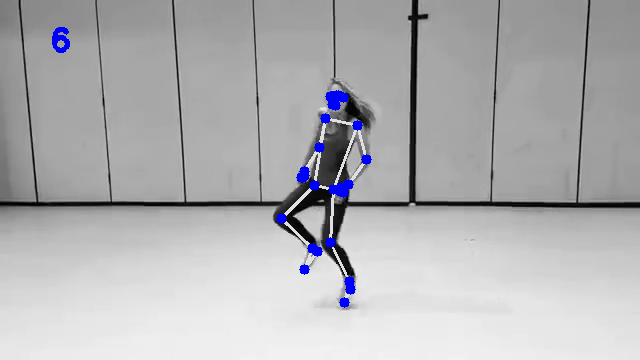

[[0, 331, 100], [1, 334, 96], [2, 336, 96], [3, 338, 96], [4, 330, 96], [5, 330, 96], [6, 329, 96], [7, 343, 98], [8, 330, 98], [9, 334, 105], [10, 331, 105], [11, 354, 125], [12, 326, 118], [13, 364, 158], [14, 326, 145], [15, 344, 184], [16, 313, 174], [17, 340, 192], [18, 308, 181], [19, 337, 190], [20, 309, 181], [21, 337, 187], [22, 311, 178], [23, 333, 191], [24, 314, 188], [25, 323, 241], [26, 285, 220], [27, 343, 277], [28, 313, 255], [29, 347, 280], [30, 318, 258], [31, 332, 297], [32, 304, 279]]


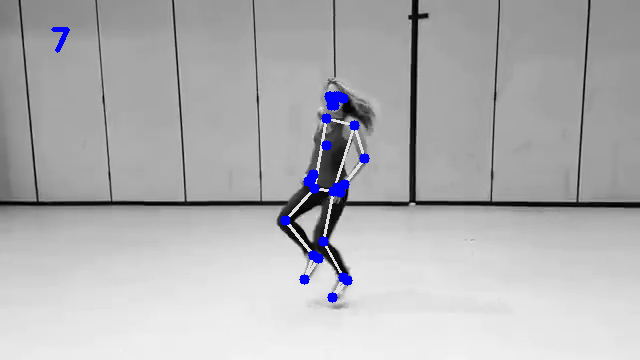

[[0, 328, 102], [1, 332, 97], [2, 333, 97], [3, 335, 97], [4, 328, 97], [5, 327, 97], [6, 326, 97], [7, 339, 99], [8, 327, 98], [9, 331, 107], [10, 327, 106], [11, 351, 126], [12, 323, 119], [13, 359, 160], [14, 321, 148], [15, 341, 187], [16, 316, 170], [17, 339, 195], [18, 314, 176], [19, 336, 193], [20, 313, 176], [21, 335, 191], [22, 315, 173], [23, 333, 191], [24, 316, 187], [25, 312, 238], [26, 291, 228], [27, 325, 282], [28, 316, 272], [29, 332, 289], [30, 323, 284], [31, 309, 299], [32, 305, 294]]


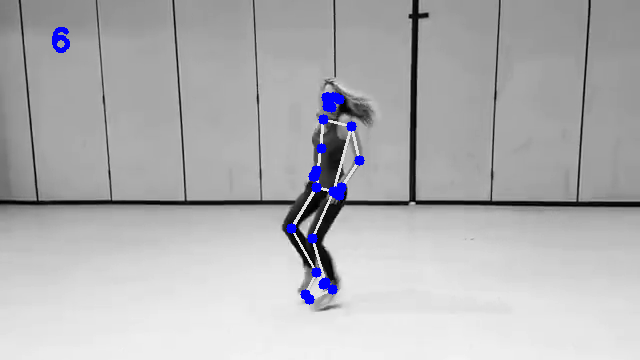

[[0, 326, 104], [1, 328, 100], [2, 330, 100], [3, 331, 100], [4, 325, 99], [5, 325, 99], [6, 325, 99], [7, 336, 102], [8, 328, 101], [9, 329, 109], [10, 326, 108], [11, 348, 124], [12, 331, 121], [13, 348, 157], [14, 336, 138], [15, 341, 185], [16, 334, 153], [17, 340, 188], [18, 333, 157], [19, 338, 192], [20, 332, 157], [21, 337, 184], [22, 333, 156], [23, 330, 193], [24, 317, 189], [25, 307, 241], [26, 299, 235], [27, 320, 288], [28, 313, 282], [29, 328, 296], [30, 319, 289], [31, 305, 304], [32, 300, 300]]


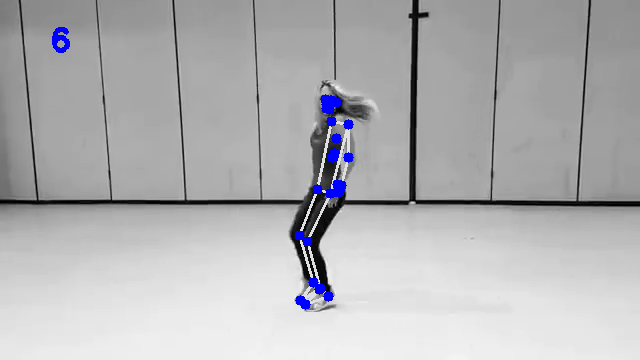

[[0, 321, 103], [1, 325, 100], [2, 327, 100], [3, 328, 100], [4, 323, 99], [5, 322, 99], [6, 322, 99], [7, 334, 103], [8, 324, 100], [9, 324, 108], [10, 321, 107], [11, 339, 124], [12, 332, 118], [13, 345, 161], [14, 339, 139], [15, 336, 193], [16, 331, 157], [17, 334, 202], [18, 329, 162], [19, 332, 200], [20, 327, 162], [21, 333, 198], [22, 328, 161], [23, 327, 192], [24, 320, 187], [25, 306, 241], [26, 306, 238], [27, 324, 289], [28, 320, 284], [29, 331, 297], [30, 326, 292], [31, 306, 303], [32, 303, 298]]


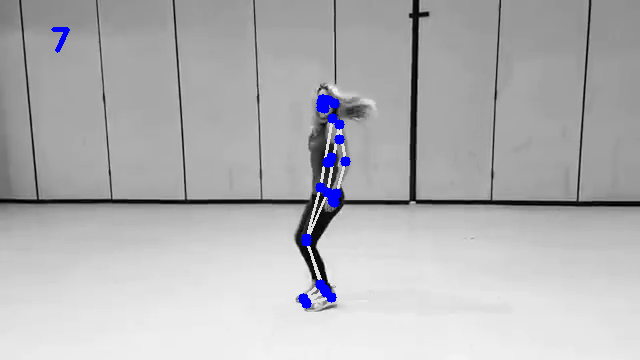

[[0, 317, 108], [1, 321, 104], [2, 322, 104], [3, 324, 105], [4, 317, 104], [5, 317, 104], [6, 316, 104], [7, 328, 107], [8, 317, 106], [9, 320, 113], [10, 316, 112], [11, 332, 132], [12, 321, 130], [13, 338, 168], [14, 327, 164], [15, 332, 196], [16, 322, 189], [17, 331, 204], [18, 320, 195], [19, 329, 203], [20, 319, 195], [21, 329, 199], [22, 320, 193], [23, 326, 200], [24, 319, 198], [25, 306, 245], [26, 307, 243], [27, 323, 289], [28, 320, 285], [29, 330, 297], [30, 328, 293], [31, 304, 302], [32, 303, 296]]


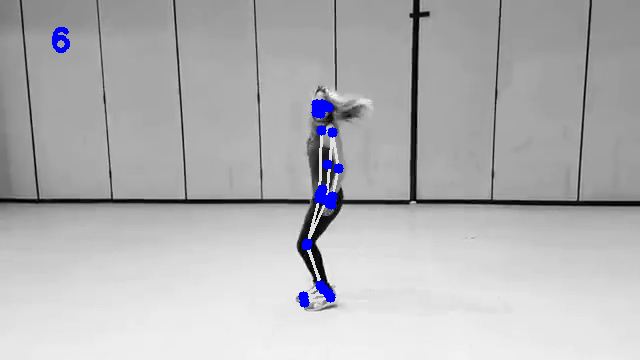

[[0, 312, 109], [1, 316, 105], [2, 317, 105], [3, 318, 106], [4, 313, 104], [5, 313, 104], [6, 312, 104], [7, 322, 108], [8, 315, 106], [9, 314, 114], [10, 311, 113], [11, 328, 132], [12, 319, 131], [13, 340, 168], [14, 324, 166], [15, 327, 197], [16, 318, 191], [17, 324, 205], [18, 314, 200], [19, 320, 204], [20, 314, 199], [21, 321, 201], [22, 315, 196], [23, 327, 200], [24, 321, 197], [25, 305, 246], [26, 307, 243], [27, 323, 290], [28, 320, 285], [29, 329, 296], [30, 328, 293], [31, 306, 302], [32, 304, 297]]


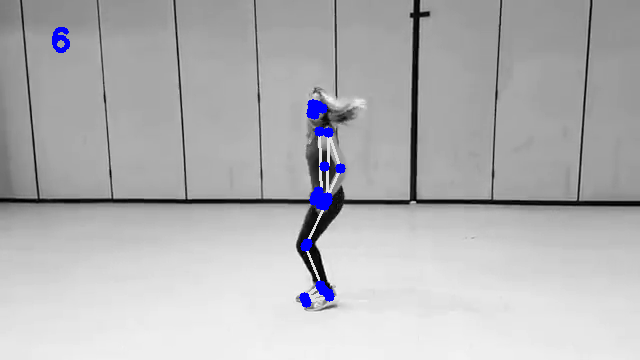

[[0, 308, 108], [1, 311, 104], [2, 312, 104], [3, 313, 104], [4, 308, 104], [5, 307, 104], [6, 306, 104], [7, 317, 107], [8, 308, 106], [9, 311, 112], [10, 307, 112], [11, 327, 130], [12, 310, 132], [13, 342, 161], [14, 322, 158], [15, 324, 185], [16, 320, 181], [17, 321, 191], [18, 316, 182], [19, 318, 189], [20, 314, 181], [21, 319, 187], [22, 315, 179], [23, 330, 196], [24, 322, 196], [25, 305, 244], [26, 306, 243], [27, 324, 288], [28, 320, 286], [29, 331, 295], [30, 327, 293], [31, 306, 302], [32, 302, 299]]


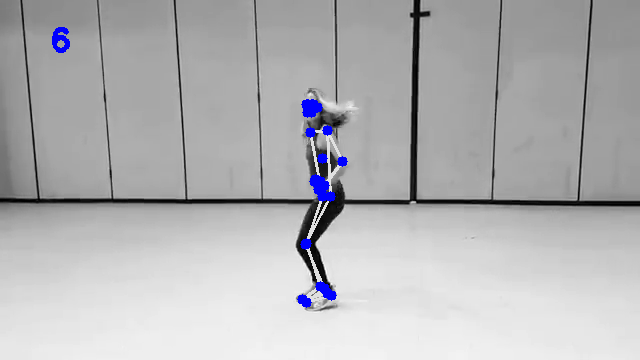

[[0, 308, 109], [1, 309, 104], [2, 311, 104], [3, 312, 104], [4, 306, 105], [5, 305, 105], [6, 305, 105], [7, 316, 105], [8, 305, 106], [9, 311, 113], [10, 307, 113], [11, 327, 128], [12, 316, 129], [13, 348, 153], [14, 324, 152], [15, 323, 171], [16, 311, 159], [17, 321, 176], [18, 308, 161], [19, 318, 173], [20, 304, 160], [21, 319, 171], [22, 306, 160], [23, 329, 198], [24, 323, 197], [25, 305, 244], [26, 306, 241], [27, 324, 288], [28, 320, 284], [29, 331, 296], [30, 328, 293], [31, 305, 302], [32, 303, 298]]


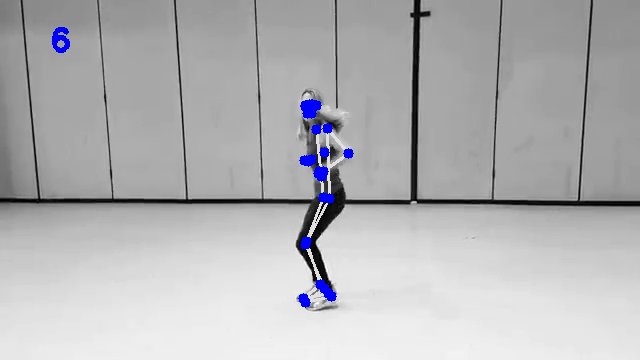

[[0, 309, 106], [1, 311, 102], [2, 313, 102], [3, 314, 102], [4, 307, 103], [5, 306, 103], [6, 305, 103], [7, 318, 104], [8, 304, 105], [9, 313, 111], [10, 308, 112], [11, 331, 127], [12, 309, 131], [13, 341, 143], [14, 313, 149], [15, 319, 145], [16, 304, 144], [17, 313, 148], [18, 301, 143], [19, 309, 145], [20, 299, 142], [21, 314, 141], [22, 301, 143], [23, 332, 197], [24, 321, 199], [25, 306, 242], [26, 304, 241], [27, 327, 285], [28, 322, 285], [29, 334, 292], [30, 330, 292], [31, 309, 300], [32, 306, 298]]


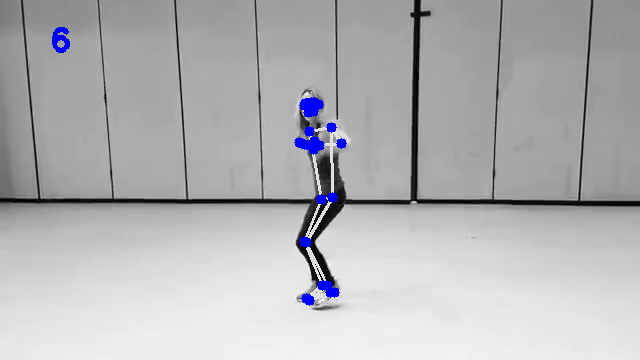

[[0, 310, 106], [1, 312, 102], [2, 314, 102], [3, 315, 102], [4, 309, 102], [5, 308, 101], [6, 307, 101], [7, 319, 103], [8, 308, 103], [9, 313, 111], [10, 309, 110], [11, 329, 126], [12, 317, 127], [13, 321, 142], [14, 317, 139], [15, 311, 122], [16, 305, 128], [17, 310, 117], [18, 302, 122], [19, 312, 115], [20, 301, 125], [21, 312, 118], [22, 302, 126], [23, 330, 198], [24, 322, 196], [25, 306, 238], [26, 301, 236], [27, 331, 280], [28, 317, 280], [29, 339, 284], [30, 323, 290], [31, 318, 298], [32, 301, 296]]


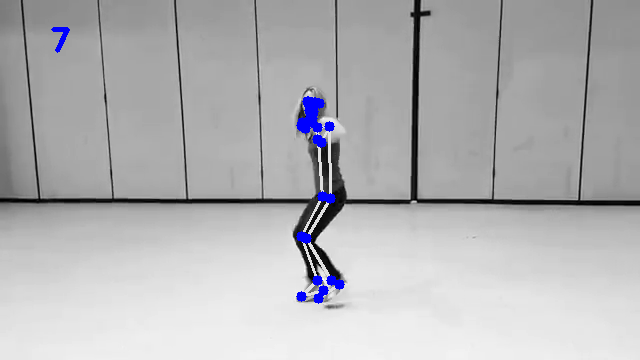

[[0, 312, 104], [1, 314, 100], [2, 316, 100], [3, 317, 100], [4, 312, 100], [5, 311, 100], [6, 310, 100], [7, 321, 103], [8, 311, 102], [9, 314, 108], [10, 311, 108], [11, 329, 123], [12, 317, 125], [13, 312, 142], [14, 305, 133], [15, 309, 120], [16, 303, 109], [17, 310, 114], [18, 303, 105], [19, 312, 113], [20, 303, 107], [21, 311, 115], [22, 304, 110], [23, 331, 195], [24, 321, 194], [25, 306, 238], [26, 298, 233], [27, 343, 277], [28, 308, 277], [29, 349, 278], [30, 314, 281], [31, 336, 297], [32, 298, 294]]


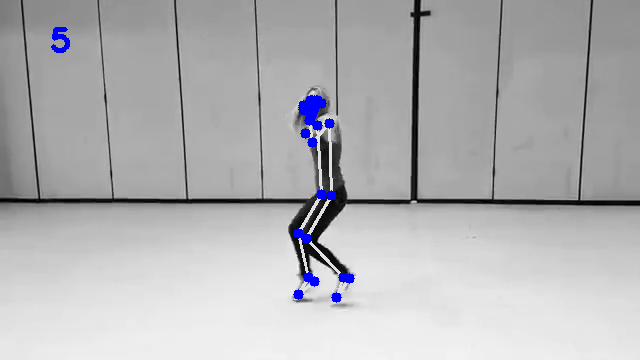

[[0, 315, 104], [1, 318, 100], [2, 319, 100], [3, 320, 100], [4, 315, 101], [5, 315, 101], [6, 314, 101], [7, 324, 102], [8, 315, 103], [9, 318, 109], [10, 315, 109], [11, 334, 124], [12, 316, 125], [13, 324, 137], [14, 298, 121], [15, 317, 115], [16, 308, 103], [17, 317, 109], [18, 312, 97], [19, 318, 108], [20, 314, 98], [21, 317, 111], [22, 313, 102], [23, 333, 196], [24, 319, 196], [25, 315, 241], [26, 296, 230], [27, 351, 278], [28, 294, 279], [29, 358, 280], [30, 297, 286], [31, 339, 298], [32, 277, 293]]


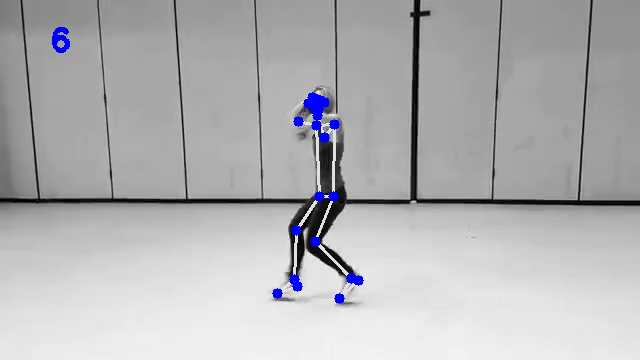

[[0, 321, 103], [1, 324, 99], [2, 325, 99], [3, 326, 99], [4, 321, 99], [5, 321, 99], [6, 320, 98], [7, 330, 100], [8, 321, 100], [9, 322, 107], [10, 320, 107], [11, 337, 122], [12, 320, 123], [13, 316, 133], [14, 299, 127], [15, 304, 116], [16, 298, 117], [17, 303, 114], [18, 296, 115], [19, 303, 109], [20, 300, 114], [21, 303, 112], [22, 301, 115], [23, 331, 194], [24, 320, 193], [25, 320, 243], [26, 301, 234], [27, 352, 287], [28, 278, 277], [29, 358, 292], [30, 279, 287], [31, 339, 302], [32, 256, 278]]


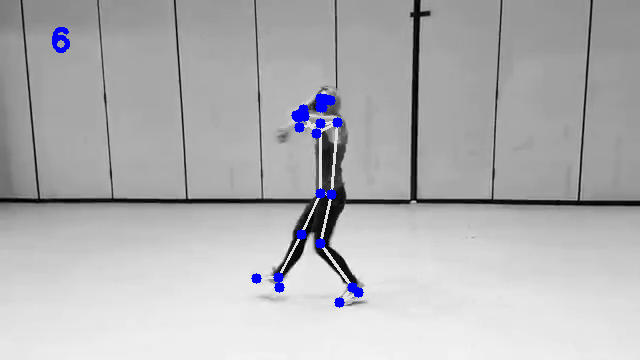

[[0, 324, 108], [1, 327, 104], [2, 328, 104], [3, 329, 104], [4, 325, 104], [5, 325, 104], [6, 325, 104], [7, 334, 106], [8, 328, 106], [9, 326, 112], [10, 325, 112], [11, 337, 127], [12, 329, 129], [13, 305, 124], [14, 303, 129], [15, 273, 129], [16, 272, 133], [17, 266, 129], [18, 264, 133], [19, 266, 128], [20, 264, 132], [21, 268, 129], [22, 267, 133], [23, 331, 198], [24, 323, 195], [25, 327, 245], [26, 301, 236], [27, 356, 288], [28, 270, 272], [29, 364, 296], [30, 269, 280], [31, 342, 302], [32, 253, 266]]


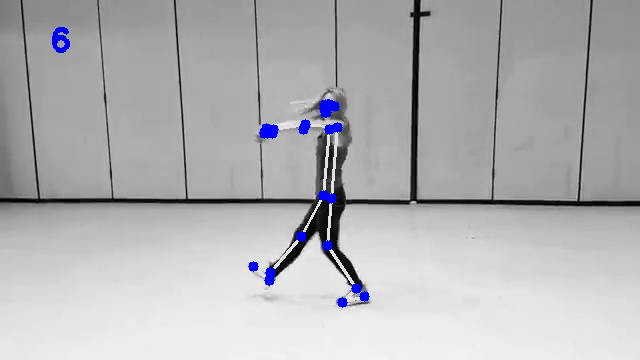

[[0, 326, 110], [1, 328, 106], [2, 328, 107], [3, 329, 107], [4, 327, 106], [5, 327, 106], [6, 328, 106], [7, 335, 108], [8, 331, 107], [9, 327, 114], [10, 326, 114], [11, 339, 130], [12, 332, 130], [13, 301, 130], [14, 301, 131], [15, 263, 131], [16, 265, 131], [17, 257, 130], [18, 257, 131], [19, 256, 129], [20, 257, 130], [21, 259, 130], [22, 260, 130], [23, 331, 203], [24, 323, 200], [25, 332, 246], [26, 297, 233], [27, 357, 289], [28, 275, 276], [29, 366, 296], [30, 275, 288], [31, 343, 301], [32, 254, 274]]


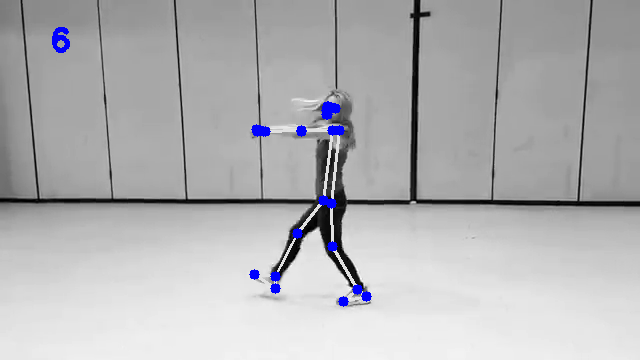

[[0, 328, 112], [1, 331, 108], [2, 332, 109], [3, 334, 109], [4, 329, 108], [5, 329, 107], [6, 328, 107], [7, 338, 111], [8, 331, 109], [9, 329, 117], [10, 327, 116], [11, 338, 133], [12, 332, 131], [13, 304, 132], [14, 303, 127], [15, 268, 132], [16, 273, 130], [17, 263, 132], [18, 264, 130], [19, 263, 132], [20, 266, 130], [21, 266, 132], [22, 266, 131], [23, 332, 206], [24, 325, 202], [25, 332, 249], [26, 293, 230], [27, 357, 290], [28, 289, 278], [29, 365, 296], [30, 293, 288], [31, 341, 302], [32, 268, 285]]


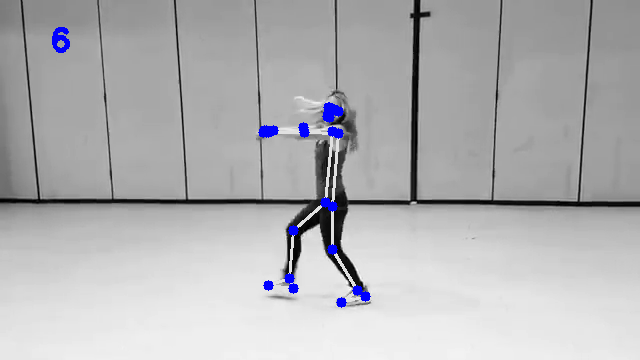

[[0, 326, 110], [1, 329, 107], [2, 330, 107], [3, 331, 107], [4, 326, 106], [5, 326, 106], [6, 325, 106], [7, 336, 109], [8, 329, 108], [9, 328, 115], [10, 325, 115], [11, 341, 130], [12, 328, 132], [13, 314, 134], [14, 306, 136], [15, 283, 136], [16, 280, 137], [17, 276, 137], [18, 273, 137], [19, 276, 136], [20, 274, 137], [21, 278, 136], [22, 276, 137], [23, 333, 202], [24, 323, 200], [25, 326, 247], [26, 295, 232], [27, 354, 286], [28, 304, 279], [29, 361, 292], [30, 308, 287], [31, 339, 301], [32, 285, 291]]


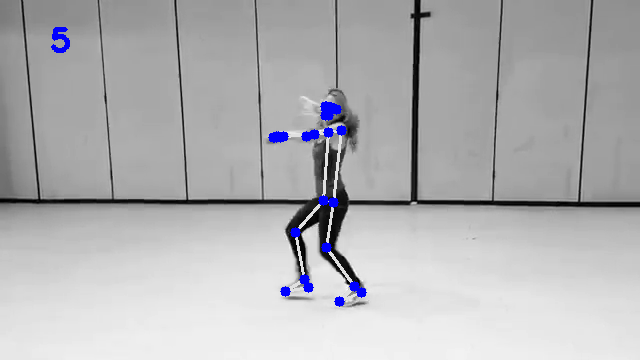

[[0, 324, 106], [1, 327, 103], [2, 328, 102], [3, 330, 102], [4, 324, 103], [5, 324, 103], [6, 323, 102], [7, 334, 104], [8, 326, 104], [9, 326, 111], [10, 323, 111], [11, 337, 127], [12, 327, 128], [13, 315, 149], [14, 317, 146], [15, 296, 142], [16, 296, 142], [17, 290, 142], [18, 286, 144], [19, 289, 140], [20, 288, 140], [21, 291, 140], [22, 292, 140], [23, 333, 197], [24, 321, 195], [25, 319, 243], [26, 296, 234], [27, 346, 283], [28, 316, 278], [29, 351, 286], [30, 322, 283], [31, 337, 302], [32, 301, 291]]


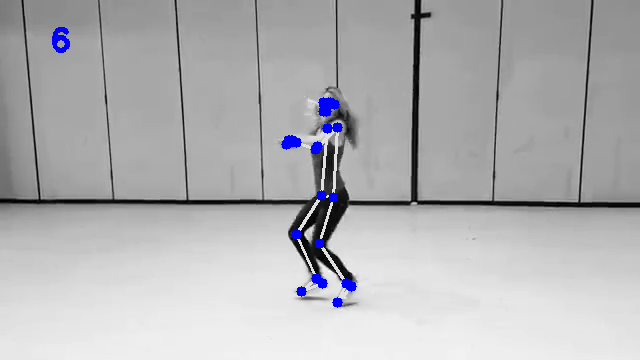

[[0, 320, 106], [1, 323, 102], [2, 325, 102], [3, 326, 102], [4, 320, 102], [5, 320, 102], [6, 319, 101], [7, 331, 105], [8, 321, 104], [9, 322, 111], [10, 318, 111], [11, 336, 128], [12, 320, 130], [13, 327, 150], [14, 312, 158], [15, 304, 147], [16, 305, 154], [17, 300, 146], [18, 303, 153], [19, 299, 144], [20, 302, 151], [21, 301, 144], [22, 302, 145], [23, 331, 200], [24, 319, 199], [25, 309, 243], [26, 303, 240], [27, 333, 279], [28, 327, 277], [29, 343, 282], [30, 333, 289], [31, 319, 296], [32, 312, 295]]


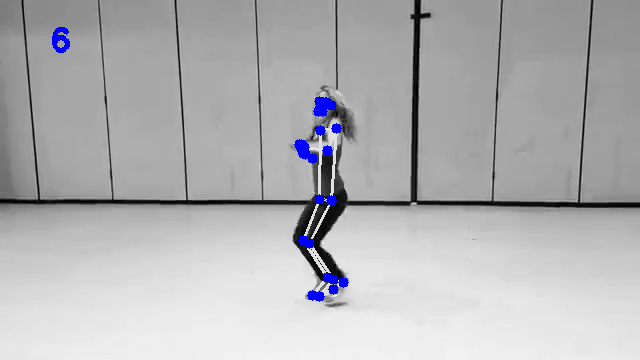

[[0, 317, 109], [1, 320, 105], [2, 322, 104], [3, 323, 104], [4, 317, 105], [5, 316, 105], [6, 315, 105], [7, 328, 107], [8, 318, 108], [9, 320, 113], [10, 316, 113], [11, 337, 130], [12, 317, 131], [13, 334, 154], [14, 319, 141], [15, 308, 158], [16, 319, 138], [17, 303, 158], [18, 318, 138], [19, 302, 155], [20, 317, 137], [21, 304, 154], [22, 318, 137], [23, 332, 201], [24, 318, 200], [25, 311, 245], [26, 307, 243], [27, 330, 284], [28, 326, 280], [29, 337, 291], [30, 332, 287], [31, 315, 300], [32, 311, 296]]


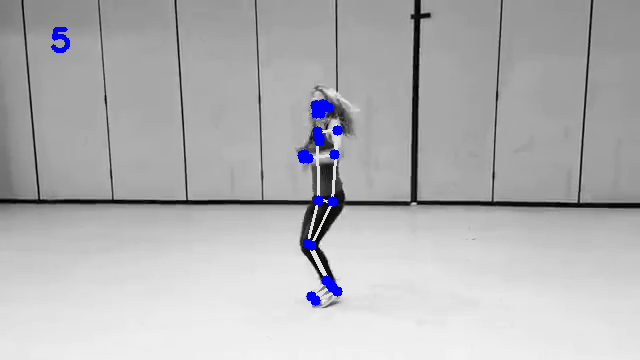

[[0, 315, 109], [1, 317, 104], [2, 318, 104], [3, 320, 104], [4, 314, 105], [5, 313, 106], [6, 312, 106], [7, 325, 107], [8, 314, 108], [9, 317, 113], [10, 314, 113], [11, 333, 130], [12, 315, 133], [13, 329, 161], [14, 304, 160], [15, 308, 172], [16, 301, 154], [17, 304, 174], [18, 298, 154], [19, 303, 172], [20, 299, 149], [21, 304, 171], [22, 301, 150], [23, 329, 200], [24, 320, 200], [25, 309, 245], [26, 309, 244], [27, 331, 286], [28, 328, 283], [29, 337, 293], [30, 335, 291], [31, 315, 301], [32, 313, 298]]


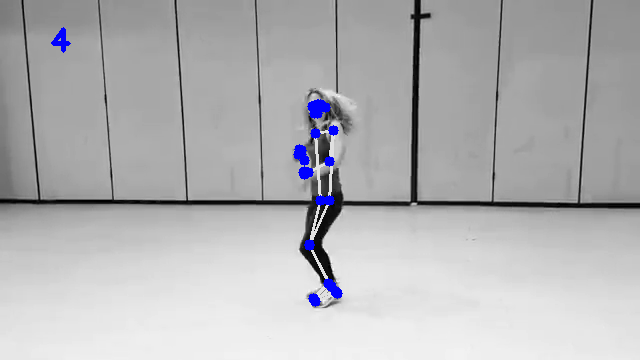

[[0, 314, 113], [1, 317, 109], [2, 319, 108], [3, 320, 108], [4, 313, 109], [5, 312, 109], [6, 311, 109], [7, 325, 110], [8, 311, 111], [9, 317, 117], [10, 313, 117], [11, 332, 132], [12, 309, 135], [13, 328, 165], [14, 293, 153], [15, 309, 188], [16, 297, 150], [17, 305, 195], [18, 295, 153], [19, 303, 194], [20, 296, 150], [21, 304, 191], [22, 296, 150], [23, 329, 200], [24, 319, 201], [25, 308, 245], [26, 308, 246], [27, 329, 284], [28, 326, 282], [29, 336, 290], [30, 333, 289], [31, 315, 300], [32, 313, 299]]


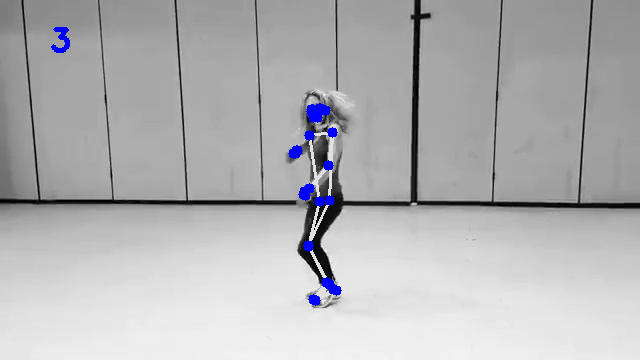

[[0, 312, 112], [1, 314, 108], [2, 316, 108], [3, 317, 108], [4, 310, 108], [5, 309, 108], [6, 308, 108], [7, 322, 109], [8, 308, 110], [9, 315, 116], [10, 310, 117], [11, 332, 131], [12, 311, 132], [13, 325, 166], [14, 293, 153], [15, 309, 189], [16, 292, 144], [17, 305, 197], [18, 292, 143], [19, 303, 194], [20, 292, 139], [21, 304, 191], [22, 293, 140], [23, 328, 198], [24, 320, 199], [25, 309, 244], [26, 309, 243], [27, 328, 284], [28, 325, 283], [29, 336, 289], [30, 332, 288], [31, 315, 301], [32, 312, 299]]


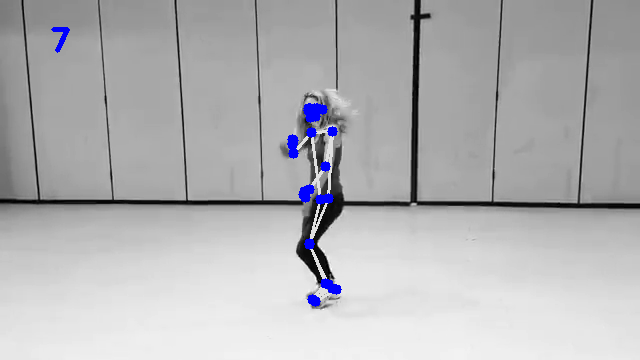

[[0, 310, 112], [1, 313, 108], [2, 314, 108], [3, 316, 108], [4, 309, 109], [5, 308, 109], [6, 307, 109], [7, 320, 110], [8, 307, 110], [9, 313, 117], [10, 309, 117], [11, 329, 132], [12, 308, 132], [13, 327, 171], [14, 290, 134], [15, 317, 202], [16, 293, 120], [17, 315, 213], [18, 292, 115], [19, 310, 212], [20, 291, 114], [21, 311, 208], [22, 291, 116], [23, 329, 201], [24, 317, 200], [25, 307, 248], [26, 306, 246], [27, 327, 283], [28, 324, 281], [29, 335, 288], [30, 331, 286], [31, 315, 302], [32, 312, 299]]


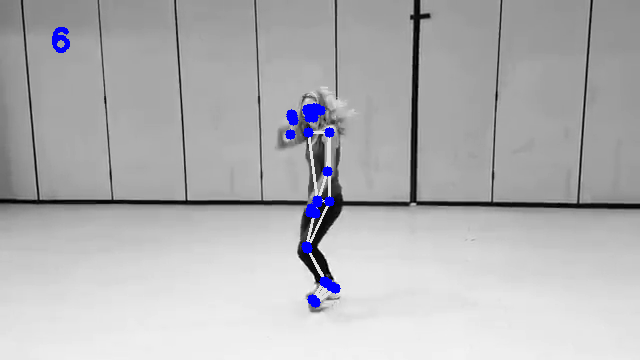

[[0, 309, 115], [1, 311, 111], [2, 313, 110], [3, 315, 110], [4, 307, 111], [5, 305, 111], [6, 304, 112], [7, 318, 112], [8, 304, 114], [9, 313, 119], [10, 308, 119], [11, 328, 135], [12, 307, 138], [13, 330, 172], [14, 314, 150], [15, 315, 200], [16, 315, 149], [17, 313, 207], [18, 316, 149], [19, 310, 206], [20, 314, 148], [21, 310, 204], [22, 314, 148], [23, 327, 202], [24, 314, 202], [25, 310, 251], [26, 305, 250], [27, 326, 290], [28, 323, 288], [29, 333, 293], [30, 329, 291], [31, 316, 310], [32, 313, 307]]


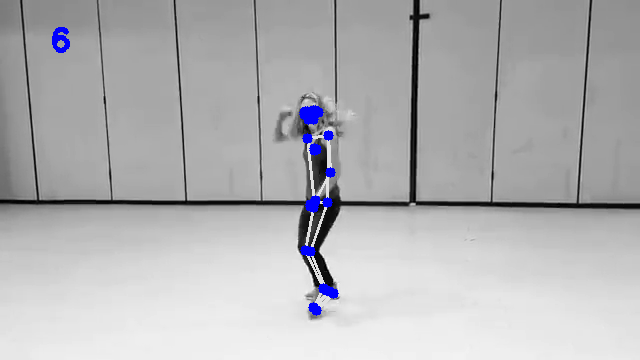

[[0, 309, 115], [1, 311, 110], [2, 313, 110], [3, 315, 110], [4, 307, 111], [5, 305, 112], [6, 303, 112], [7, 318, 112], [8, 302, 114], [9, 313, 119], [10, 307, 119], [11, 330, 138], [12, 302, 138], [13, 341, 172], [14, 283, 124], [15, 320, 196], [16, 287, 110], [17, 317, 203], [18, 289, 105], [19, 314, 200], [20, 292, 106], [21, 314, 198], [22, 291, 107], [23, 326, 205], [24, 310, 205], [25, 312, 257], [26, 307, 254], [27, 315, 302], [28, 331, 286], [29, 315, 308], [30, 339, 289], [31, 311, 324], [32, 324, 300]]


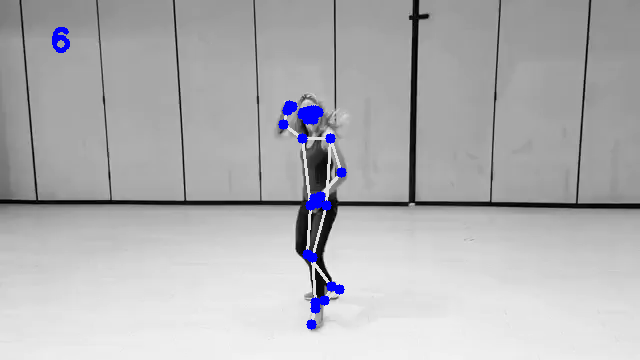

[[0, 309, 118], [1, 312, 113], [2, 314, 113], [3, 316, 113], [4, 307, 114], [5, 305, 114], [6, 304, 114], [7, 319, 115], [8, 303, 116], [9, 314, 122], [10, 307, 122], [11, 330, 139], [12, 299, 137], [13, 341, 171], [14, 288, 118], [15, 324, 195], [16, 295, 107], [17, 321, 202], [18, 296, 101], [19, 318, 199], [20, 296, 101], [21, 318, 198], [22, 295, 103], [23, 325, 207], [24, 305, 206], [25, 316, 258], [26, 302, 251], [27, 318, 305], [28, 325, 280], [29, 319, 313], [30, 331, 282], [31, 314, 327], [32, 324, 295]]


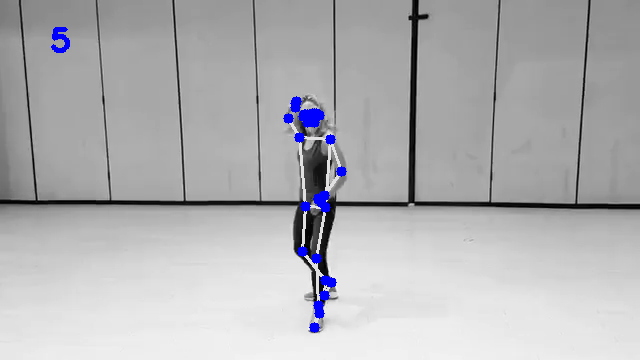

[[0, 310, 122], [1, 313, 117], [2, 315, 117], [3, 316, 117], [4, 307, 117], [5, 305, 117], [6, 303, 117], [7, 319, 119], [8, 302, 119], [9, 314, 126], [10, 307, 126], [11, 330, 144], [12, 299, 144], [13, 336, 176], [14, 304, 178], [15, 321, 200], [16, 305, 205], [17, 317, 208], [18, 305, 215], [19, 315, 204], [20, 303, 213], [21, 315, 203], [22, 304, 208], [23, 323, 210], [24, 304, 210], [25, 317, 263], [26, 301, 252], [27, 317, 309], [28, 327, 280], [29, 318, 317], [30, 331, 282], [31, 312, 329], [32, 326, 295]]


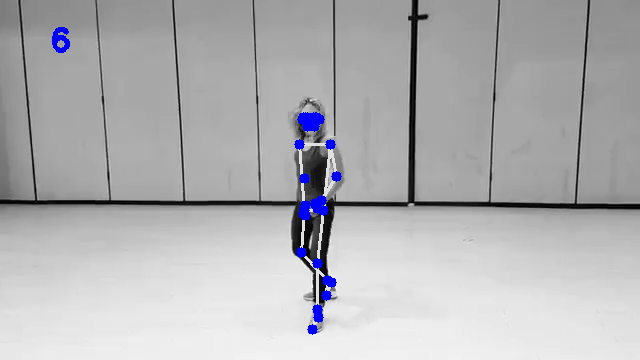

[[0, 310, 122], [1, 313, 118], [2, 316, 118], [3, 317, 118], [4, 307, 118], [5, 305, 118], [6, 304, 118], [7, 319, 121], [8, 303, 120], [9, 315, 127], [10, 307, 127], [11, 327, 145], [12, 300, 142], [13, 334, 179], [14, 295, 161], [15, 319, 200], [16, 293, 182], [17, 316, 207], [18, 292, 189], [19, 313, 204], [20, 293, 189], [21, 313, 202], [22, 294, 187], [23, 323, 209], [24, 305, 208], [25, 318, 263], [26, 300, 250], [27, 319, 305], [28, 322, 281], [29, 318, 313], [30, 328, 281], [31, 314, 326], [32, 317, 293]]


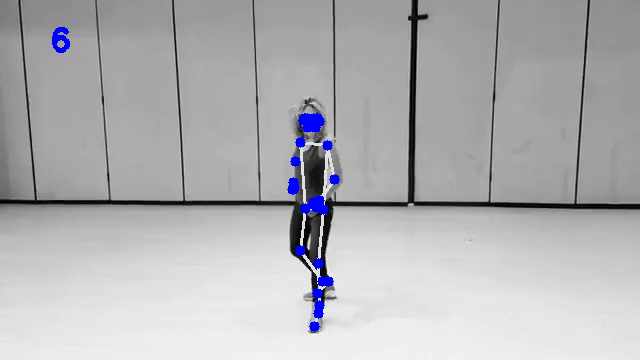

[[0, 309, 123], [1, 312, 119], [2, 313, 119], [3, 315, 118], [4, 306, 119], [5, 304, 119], [6, 303, 119], [7, 318, 120], [8, 302, 121], [9, 313, 128], [10, 306, 128], [11, 328, 145], [12, 299, 144], [13, 331, 179], [14, 292, 128], [15, 315, 202], [16, 301, 114], [17, 312, 208], [18, 304, 112], [19, 309, 207], [20, 305, 112], [21, 309, 205], [22, 304, 113], [23, 322, 208], [24, 303, 207], [25, 315, 260], [26, 295, 248], [27, 315, 306], [28, 321, 278], [29, 315, 314], [30, 328, 277], [31, 313, 327], [32, 320, 294]]


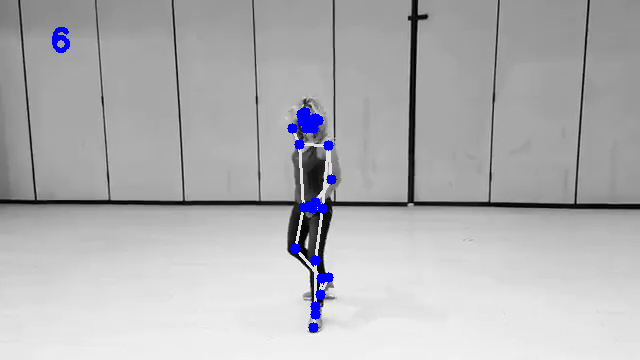

[[0, 302, 123], [1, 304, 119], [2, 305, 119], [3, 306, 119], [4, 300, 120], [5, 300, 120], [6, 299, 121], [7, 308, 122], [8, 298, 123], [9, 305, 127], [10, 301, 128], [11, 320, 142], [12, 287, 143], [13, 327, 170], [14, 290, 141], [15, 321, 174], [16, 299, 113], [17, 319, 176], [18, 300, 105], [19, 317, 174], [20, 299, 105], [21, 317, 174], [22, 299, 107], [23, 324, 208], [24, 306, 209], [25, 312, 257], [26, 293, 248], [27, 316, 306], [28, 327, 268], [29, 314, 317], [30, 329, 272], [31, 312, 328], [32, 327, 289]]


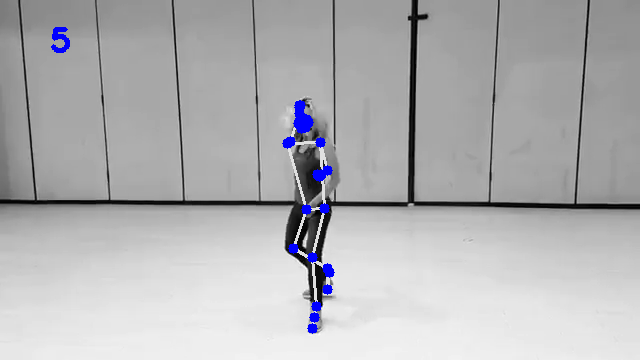

[[0, 303, 129], [1, 306, 126], [2, 305, 125], [3, 306, 126], [4, 301, 125], [5, 300, 125], [6, 300, 125], [7, 308, 129], [8, 301, 127], [9, 305, 133], [10, 302, 133], [11, 319, 148], [12, 298, 144], [13, 321, 174], [14, 289, 136], [15, 317, 175], [16, 294, 112], [17, 317, 175], [18, 296, 107], [19, 317, 174], [20, 297, 105], [21, 316, 174], [22, 297, 107], [23, 321, 209], [24, 304, 208], [25, 312, 261], [26, 293, 244], [27, 315, 306], [28, 322, 269], [29, 315, 313], [30, 328, 272], [31, 313, 326], [32, 321, 287]]


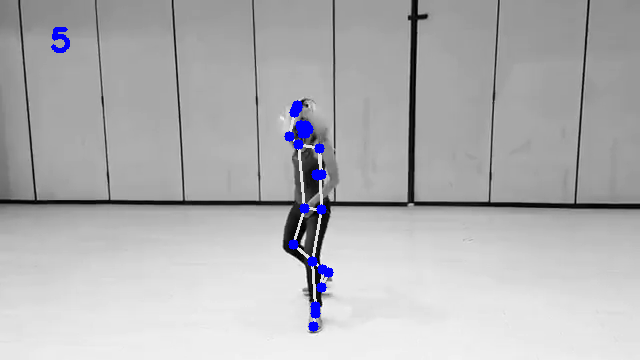

[[0, 304, 116], [1, 307, 113], [2, 308, 113], [3, 309, 114], [4, 304, 112], [5, 302, 113], [6, 301, 113], [7, 309, 118], [8, 299, 116], [9, 306, 123], [10, 301, 121], [11, 318, 145], [12, 294, 140], [13, 325, 175], [14, 287, 132], [15, 318, 189], [16, 295, 111], [17, 317, 194], [18, 298, 106], [19, 315, 192], [20, 298, 104], [21, 315, 190], [22, 298, 106], [23, 319, 207], [24, 301, 208], [25, 311, 258], [26, 293, 245], [27, 313, 306], [28, 328, 271], [29, 314, 312], [30, 331, 269], [31, 312, 325], [32, 325, 290]]


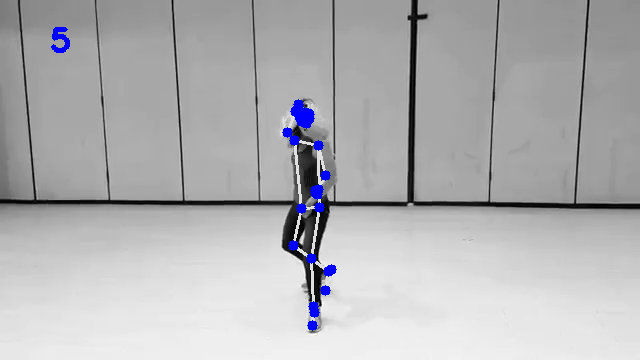

[[0, 305, 117], [1, 308, 116], [2, 309, 116], [3, 310, 116], [4, 304, 115], [5, 303, 115], [6, 302, 115], [7, 311, 121], [8, 300, 119], [9, 307, 123], [10, 302, 122], [11, 319, 145], [12, 290, 138], [13, 321, 176], [14, 281, 127], [15, 312, 195], [16, 300, 106], [17, 311, 203], [18, 302, 103], [19, 309, 202], [20, 303, 103], [21, 309, 200], [22, 302, 104], [23, 320, 204], [24, 301, 205], [25, 311, 259], [26, 289, 243], [27, 315, 306], [28, 317, 266], [29, 317, 312], [30, 325, 267], [31, 312, 326], [32, 318, 287]]


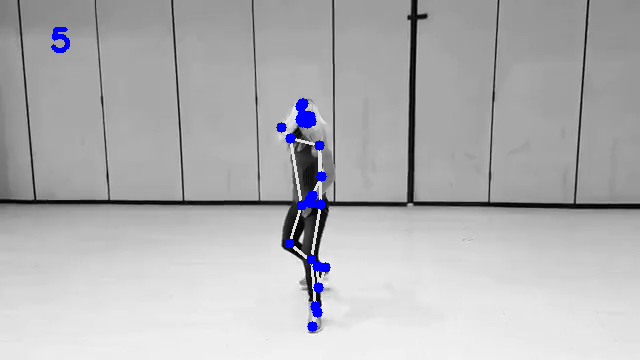

[[0, 307, 121], [1, 309, 119], [2, 311, 119], [3, 312, 120], [4, 306, 117], [5, 304, 117], [6, 303, 117], [7, 313, 123], [8, 301, 121], [9, 309, 126], [10, 304, 125], [11, 321, 145], [12, 293, 140], [13, 321, 179], [14, 284, 128], [15, 311, 198], [16, 299, 107], [17, 312, 204], [18, 301, 105], [19, 311, 203], [20, 301, 105], [21, 310, 201], [22, 301, 106], [23, 318, 204], [24, 299, 204], [25, 311, 259], [26, 292, 245], [27, 314, 306], [28, 313, 264], [29, 315, 312], [30, 321, 266], [31, 311, 325], [32, 314, 286]]


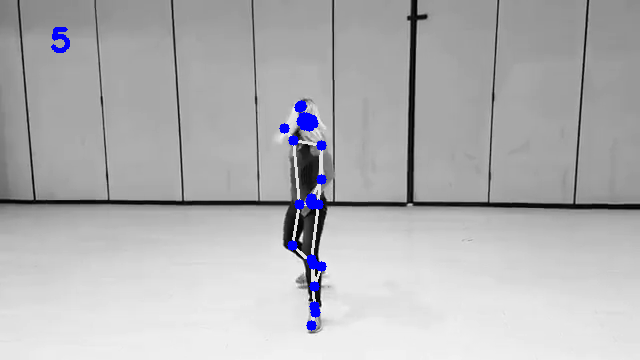

[[0, 305, 115], [1, 307, 111], [2, 308, 112], [3, 309, 112], [4, 304, 111], [5, 302, 111], [6, 301, 111], [7, 309, 114], [8, 300, 113], [9, 307, 120], [10, 302, 119], [11, 318, 142], [12, 291, 135], [13, 321, 173], [14, 282, 131], [15, 310, 195], [16, 299, 108], [17, 307, 203], [18, 298, 101], [19, 309, 200], [20, 298, 101], [21, 305, 199], [22, 298, 104], [23, 317, 201], [24, 298, 203], [25, 311, 257], [26, 299, 249], [27, 314, 306], [28, 309, 270], [29, 315, 313], [30, 320, 275], [31, 311, 327], [32, 304, 285]]


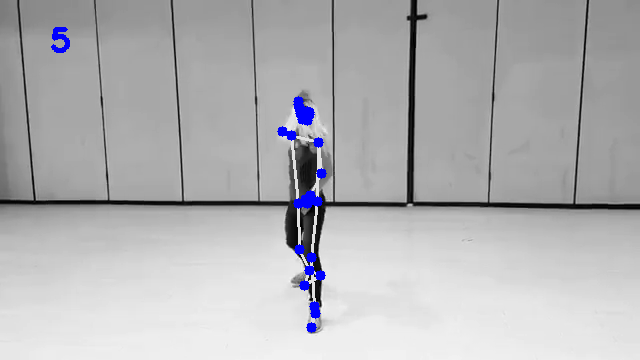

[[0, 307, 115], [1, 308, 111], [2, 309, 111], [3, 310, 111], [4, 305, 110], [5, 303, 110], [6, 302, 110], [7, 309, 114], [8, 300, 112], [9, 309, 120], [10, 304, 119], [11, 317, 141], [12, 290, 134], [13, 323, 167], [14, 288, 121], [15, 310, 189], [16, 302, 101], [17, 308, 194], [18, 305, 96], [19, 306, 191], [20, 305, 96], [21, 306, 190], [22, 304, 99], [23, 316, 201], [24, 296, 203], [25, 313, 256], [26, 293, 249], [27, 316, 307], [28, 305, 271], [29, 316, 313], [30, 306, 273], [31, 313, 324], [32, 297, 287]]


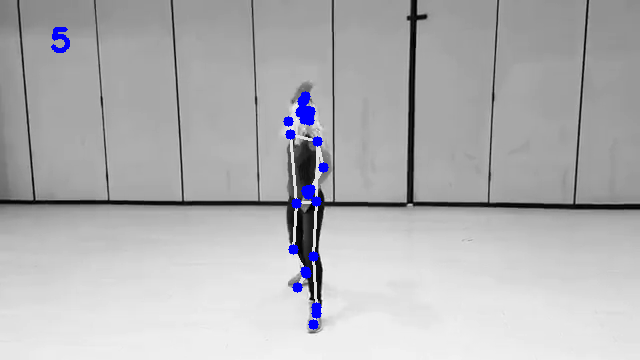

[[0, 302, 112], [1, 305, 108], [2, 306, 108], [3, 308, 109], [4, 301, 108], [5, 300, 108], [6, 299, 108], [7, 309, 113], [8, 298, 110], [9, 304, 117], [10, 300, 116], [11, 315, 140], [12, 289, 133], [13, 320, 168], [14, 288, 107], [15, 308, 191], [16, 300, 86], [17, 306, 198], [18, 303, 82], [19, 304, 195], [20, 303, 82], [21, 304, 194], [22, 303, 84], [23, 312, 201], [24, 293, 201], [25, 311, 253], [26, 297, 242], [27, 314, 304], [28, 306, 270], [29, 315, 310], [30, 309, 273], [31, 310, 324], [32, 296, 285]]


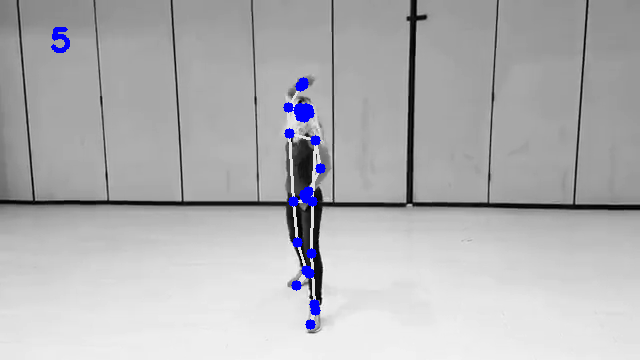

[[0, 301, 113], [1, 303, 109], [2, 305, 109], [3, 306, 110], [4, 300, 109], [5, 298, 109], [6, 297, 109], [7, 308, 115], [8, 296, 112], [9, 306, 119], [10, 299, 118], [11, 317, 143], [12, 288, 136], [13, 322, 169], [14, 288, 120], [15, 306, 193], [16, 301, 99], [17, 304, 199], [18, 305, 95], [19, 302, 198], [20, 304, 95], [21, 302, 196], [22, 304, 97], [23, 311, 201], [24, 292, 201], [25, 311, 251], [26, 298, 240], [27, 314, 303], [28, 305, 274], [29, 314, 310], [30, 307, 277], [31, 311, 323], [32, 294, 286]]


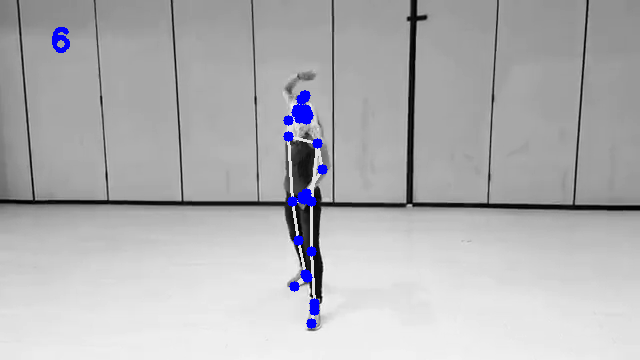

[[0, 302, 118], [1, 305, 119], [2, 306, 119], [3, 308, 120], [4, 301, 115], [5, 301, 115], [6, 300, 115], [7, 309, 121], [8, 297, 119], [9, 305, 127], [10, 300, 119], [11, 317, 143], [12, 290, 135], [13, 322, 160], [14, 289, 98], [15, 313, 177], [16, 300, 81], [17, 313, 182], [18, 308, 80], [19, 311, 182], [20, 304, 81], [21, 311, 180], [22, 309, 84], [23, 308, 198], [24, 293, 199], [25, 311, 250], [26, 293, 242], [27, 314, 300], [28, 305, 270], [29, 314, 304], [30, 307, 272], [31, 313, 318], [32, 295, 285]]


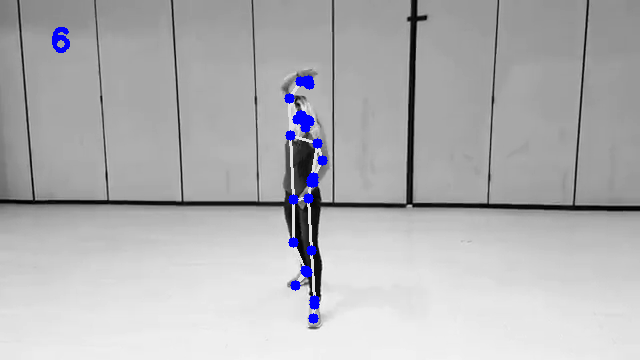

[[0, 296, 114], [1, 298, 110], [2, 299, 110], [3, 301, 110], [4, 295, 110], [5, 294, 110], [6, 293, 110], [7, 304, 114], [8, 295, 112], [9, 299, 119], [10, 295, 119], [11, 314, 139], [12, 289, 136], [13, 321, 166], [14, 291, 136], [15, 307, 191], [16, 300, 125], [17, 304, 198], [18, 302, 123], [19, 302, 197], [20, 302, 121], [21, 302, 195], [22, 301, 122], [23, 310, 198], [24, 291, 199], [25, 310, 248], [26, 298, 239], [27, 312, 297], [28, 306, 274], [29, 313, 303], [30, 309, 281], [31, 310, 316], [32, 296, 286]]


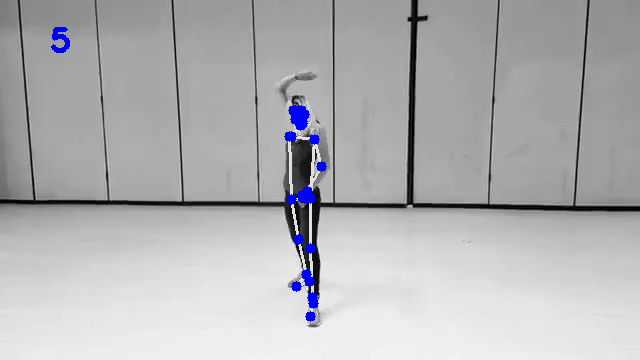

[[0, 297, 109], [1, 298, 105], [2, 299, 105], [3, 301, 104], [4, 294, 105], [5, 294, 105], [6, 293, 105], [7, 305, 107], [8, 294, 107], [9, 300, 113], [10, 295, 113], [11, 318, 131], [12, 289, 124], [13, 322, 161], [14, 278, 90], [15, 310, 187], [16, 303, 81], [17, 308, 193], [18, 309, 79], [19, 305, 192], [20, 310, 81], [21, 306, 190], [22, 309, 82], [23, 311, 194], [24, 292, 194], [25, 309, 247], [26, 293, 242], [27, 312, 296], [28, 302, 273], [29, 312, 302], [30, 306, 276], [31, 310, 315], [32, 298, 286]]


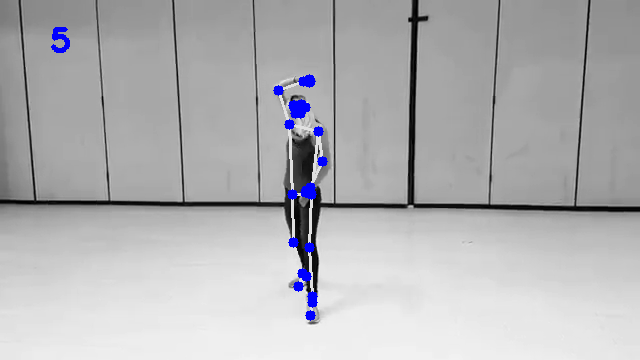

[[0, 295, 110], [1, 296, 104], [2, 298, 104], [3, 299, 103], [4, 293, 105], [5, 292, 105], [6, 291, 105], [7, 304, 106], [8, 292, 107], [9, 299, 113], [10, 294, 114], [11, 319, 130], [12, 288, 124], [13, 327, 160], [14, 277, 93], [15, 312, 186], [16, 303, 86], [17, 310, 192], [18, 309, 85], [19, 307, 191], [20, 309, 86], [21, 307, 189], [22, 307, 87], [23, 312, 191], [24, 293, 192], [25, 308, 243], [26, 297, 239], [27, 310, 292], [28, 306, 276], [29, 310, 297], [30, 306, 279], [31, 308, 312], [32, 296, 287]]


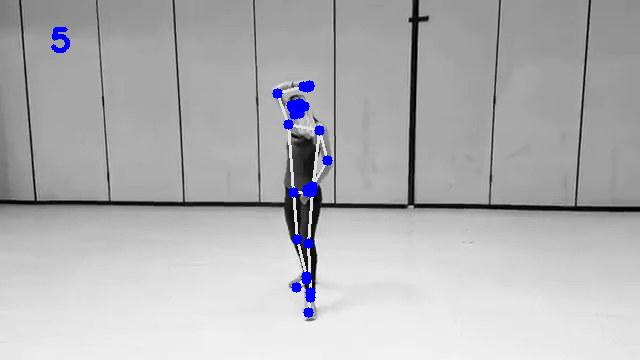

[[0, 294, 116], [1, 296, 112], [2, 298, 112], [3, 300, 109], [4, 292, 112], [5, 292, 111], [6, 291, 111], [7, 303, 112], [8, 293, 111], [9, 299, 119], [10, 294, 119], [11, 319, 130], [12, 288, 122], [13, 328, 162], [14, 275, 96], [15, 311, 185], [16, 294, 92], [17, 307, 190], [18, 299, 89], [19, 304, 189], [20, 301, 91], [21, 305, 186], [22, 299, 92], [23, 311, 192], [24, 292, 192], [25, 306, 240], [26, 297, 238], [27, 308, 289], [28, 304, 276], [29, 308, 294], [30, 307, 281], [31, 304, 308], [32, 299, 288]]


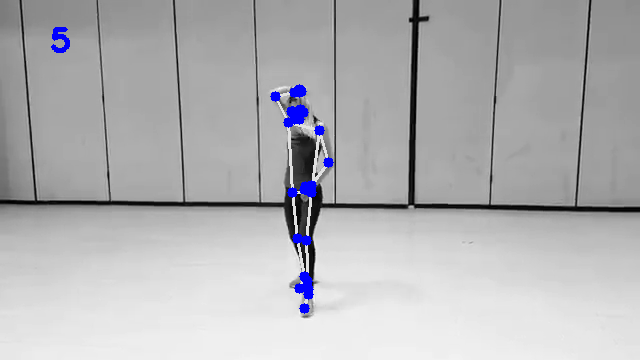

[[0, 300, 121], [1, 302, 117], [2, 304, 117], [3, 305, 117], [4, 298, 117], [5, 296, 116], [6, 295, 116], [7, 307, 117], [8, 296, 116], [9, 303, 123], [10, 298, 124], [11, 319, 133], [12, 290, 125], [13, 327, 162], [14, 273, 98], [15, 312, 182], [16, 296, 100], [17, 309, 188], [18, 300, 98], [19, 306, 187], [20, 302, 102], [21, 306, 185], [22, 300, 103], [23, 312, 191], [24, 293, 191], [25, 304, 238], [26, 296, 236], [27, 305, 285], [28, 306, 276], [29, 306, 290], [30, 309, 281], [31, 302, 306], [32, 302, 293]]


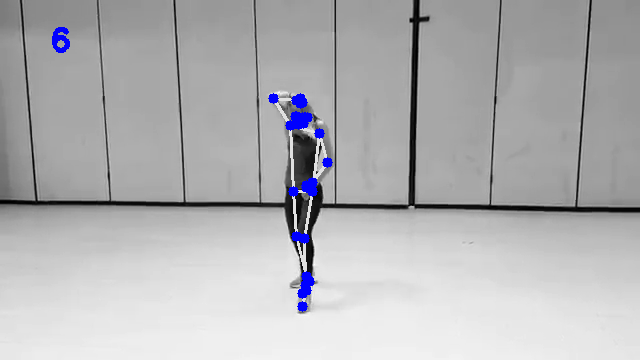

[[0, 296, 111], [1, 298, 106], [2, 300, 106], [3, 301, 106], [4, 292, 108], [5, 292, 108], [6, 291, 107], [7, 302, 110], [8, 293, 109], [9, 298, 115], [10, 294, 115], [11, 318, 129], [12, 289, 125], [13, 327, 158], [14, 273, 104], [15, 311, 180], [16, 290, 102], [17, 307, 186], [18, 297, 98], [19, 305, 183], [20, 299, 100], [21, 305, 182], [22, 298, 102], [23, 311, 190], [24, 293, 189], [25, 302, 233], [26, 297, 231], [27, 306, 277], [28, 309, 273], [29, 306, 282], [30, 312, 277], [31, 300, 296], [32, 303, 290]]


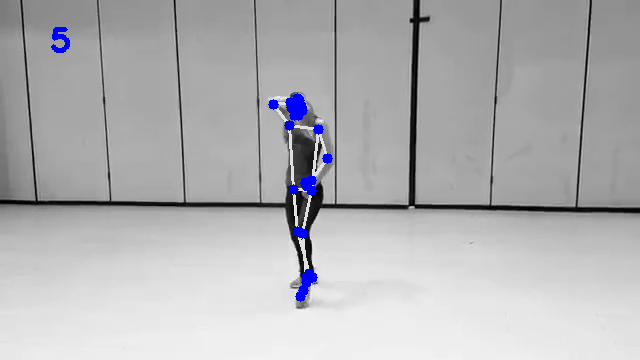

[[0, 297, 108], [1, 298, 107], [2, 300, 106], [3, 301, 106], [4, 295, 107], [5, 294, 107], [6, 293, 106], [7, 304, 108], [8, 294, 108], [9, 300, 113], [10, 295, 114], [11, 319, 128], [12, 289, 125], [13, 327, 155], [14, 270, 108], [15, 313, 180], [16, 299, 108], [17, 311, 187], [18, 308, 101], [19, 308, 186], [20, 305, 108], [21, 308, 184], [22, 303, 110], [23, 314, 188], [24, 296, 190], [25, 300, 231], [26, 297, 231], [27, 307, 278], [28, 309, 275], [29, 309, 283], [30, 313, 279], [31, 300, 296], [32, 301, 293]]


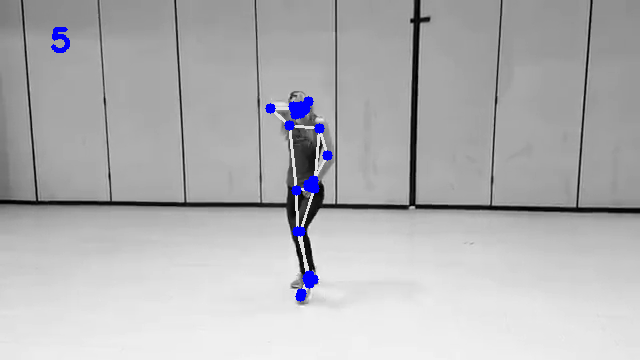

[[0, 294, 110], [1, 296, 106], [2, 298, 106], [3, 299, 106], [4, 294, 106], [5, 293, 106], [6, 293, 106], [7, 303, 107], [8, 295, 108], [9, 298, 113], [10, 295, 114], [11, 316, 126], [12, 293, 125], [13, 325, 152], [14, 275, 115], [15, 314, 178], [16, 297, 112], [17, 312, 185], [18, 303, 111], [19, 309, 184], [20, 306, 111], [21, 309, 183], [22, 303, 113], [23, 313, 187], [24, 299, 189], [25, 298, 230], [26, 296, 231], [27, 309, 273], [28, 308, 271], [29, 313, 277], [30, 313, 276], [31, 302, 292], [32, 300, 290]]


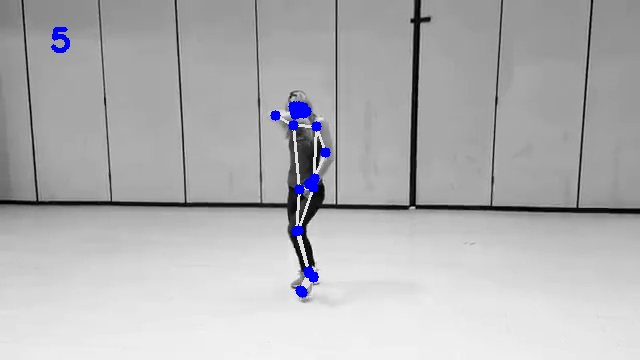

[[0, 293, 110], [1, 295, 105], [2, 296, 105], [3, 297, 105], [4, 292, 106], [5, 292, 106], [6, 291, 107], [7, 302, 107], [8, 293, 109], [9, 296, 114], [10, 293, 115], [11, 316, 127], [12, 293, 128], [13, 321, 157], [14, 273, 123], [15, 312, 181], [16, 297, 124], [17, 310, 187], [18, 303, 124], [19, 307, 186], [20, 306, 123], [21, 307, 184], [22, 303, 124], [23, 312, 189], [24, 299, 190], [25, 294, 229], [26, 293, 231], [27, 309, 268], [28, 308, 272], [29, 315, 272], [30, 313, 278], [31, 301, 287], [32, 300, 290]]


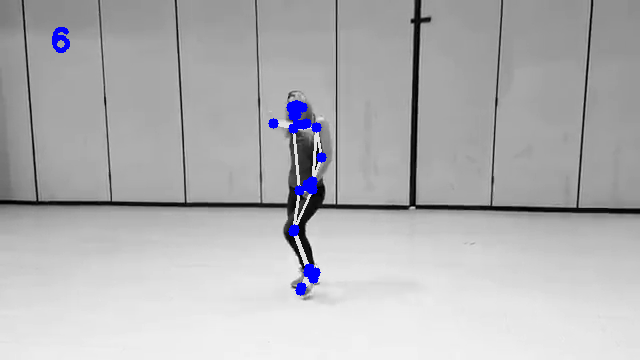

[[0, 293, 111], [1, 295, 108], [2, 295, 108], [3, 297, 108], [4, 292, 108], [5, 292, 108], [6, 292, 108], [7, 300, 112], [8, 294, 112], [9, 296, 116], [10, 294, 116], [11, 313, 128], [12, 292, 129], [13, 315, 147], [14, 286, 142], [15, 311, 151], [16, 294, 129], [17, 310, 152], [18, 296, 127], [19, 310, 151], [20, 297, 125], [21, 310, 151], [22, 296, 126], [23, 312, 189], [24, 302, 190], [25, 290, 229], [26, 292, 232], [27, 310, 269], [28, 309, 271], [29, 316, 273], [30, 314, 277], [31, 302, 286], [32, 300, 287]]


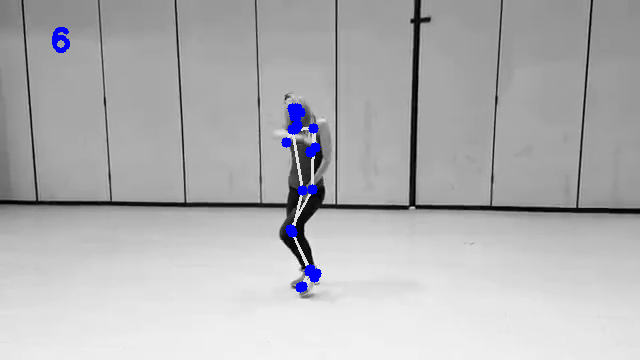

[[0, 287, 112], [1, 288, 108], [2, 289, 108], [3, 290, 108], [4, 287, 108], [5, 287, 108], [6, 287, 109], [7, 297, 110], [8, 290, 110], [9, 290, 116], [10, 288, 116], [11, 312, 127], [12, 294, 131], [13, 318, 153], [14, 295, 153], [15, 307, 168], [16, 308, 145], [17, 302, 168], [18, 311, 147], [19, 301, 167], [20, 311, 144], [21, 302, 166], [22, 310, 144], [23, 310, 192], [24, 299, 194], [25, 288, 228], [26, 290, 233], [27, 308, 268], [28, 308, 271], [29, 316, 273], [30, 314, 277], [31, 298, 285], [32, 297, 287]]


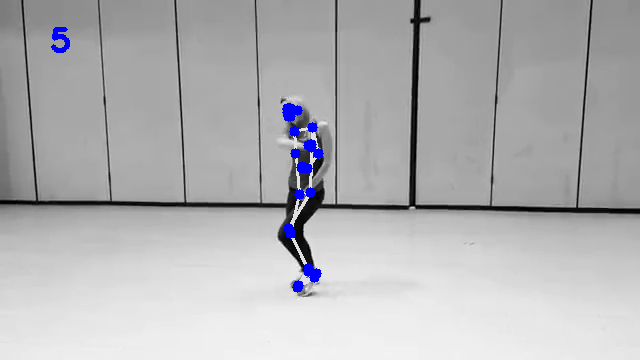

[[0, 285, 116], [1, 287, 112], [2, 288, 112], [3, 289, 112], [4, 285, 112], [5, 285, 112], [6, 285, 112], [7, 295, 113], [8, 289, 113], [9, 288, 120], [10, 286, 120], [11, 310, 130], [12, 293, 134], [13, 317, 156], [14, 306, 158], [15, 306, 160], [16, 312, 160], [17, 305, 161], [18, 313, 161], [19, 304, 160], [20, 312, 159], [21, 304, 160], [22, 312, 159], [23, 310, 193], [24, 299, 194], [25, 289, 228], [26, 290, 232], [27, 310, 269], [28, 308, 269], [29, 317, 275], [30, 315, 276], [31, 298, 284], [32, 297, 286]]


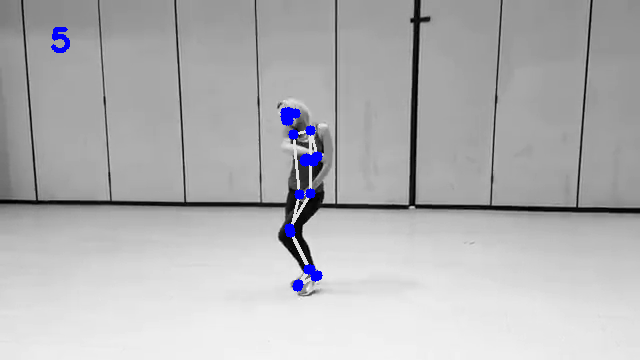

[[0, 285, 119], [1, 287, 116], [2, 288, 116], [3, 289, 116], [4, 285, 116], [5, 285, 116], [6, 285, 116], [7, 294, 117], [8, 289, 117], [9, 289, 122], [10, 287, 123], [11, 311, 130], [12, 294, 131], [13, 321, 153], [14, 293, 148], [15, 314, 166], [16, 309, 149], [17, 313, 170], [18, 312, 153], [19, 312, 169], [20, 315, 150], [21, 312, 168], [22, 312, 150], [23, 310, 192], [24, 299, 192], [25, 290, 230], [26, 289, 231], [27, 311, 268], [28, 309, 267], [29, 318, 274], [30, 316, 274], [31, 300, 284], [32, 298, 284]]


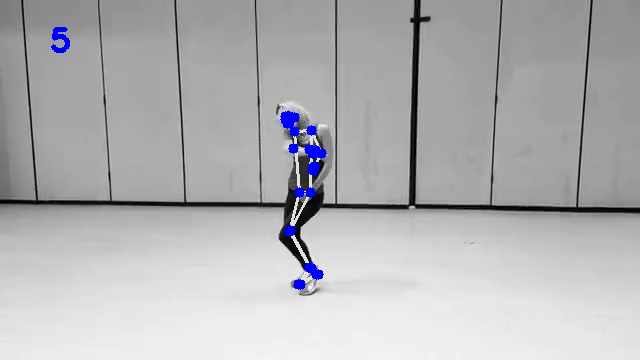

[[0, 286, 121], [1, 287, 117], [2, 289, 116], [3, 290, 116], [4, 284, 118], [5, 283, 118], [6, 283, 119], [7, 295, 116], [8, 285, 120], [9, 291, 124], [10, 288, 126], [11, 314, 129], [12, 291, 139], [13, 328, 150], [14, 298, 154], [15, 312, 174], [16, 313, 150], [17, 312, 181], [18, 317, 151], [19, 308, 181], [20, 316, 149], [21, 309, 180], [22, 315, 149], [23, 311, 193], [24, 297, 194], [25, 289, 233], [26, 287, 233], [27, 309, 268], [28, 308, 267], [29, 316, 273], [30, 314, 273], [31, 299, 285], [32, 297, 285]]


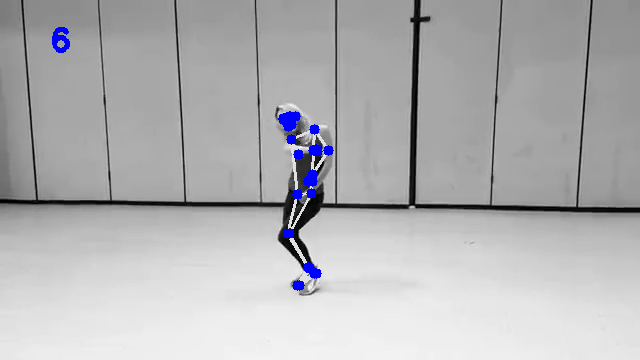

[[0, 288, 121], [1, 289, 117], [2, 290, 117], [3, 292, 116], [4, 286, 118], [5, 285, 118], [6, 284, 119], [7, 297, 117], [8, 286, 120], [9, 292, 124], [10, 289, 125], [11, 316, 131], [12, 289, 139], [13, 325, 152], [14, 292, 152], [15, 312, 176], [16, 311, 145], [17, 309, 182], [18, 317, 144], [19, 308, 186], [20, 316, 141], [21, 308, 182], [22, 315, 142], [23, 313, 192], [24, 297, 194], [25, 289, 232], [26, 286, 235], [27, 310, 268], [28, 308, 269], [29, 317, 272], [30, 315, 274], [31, 302, 283], [32, 298, 285]]


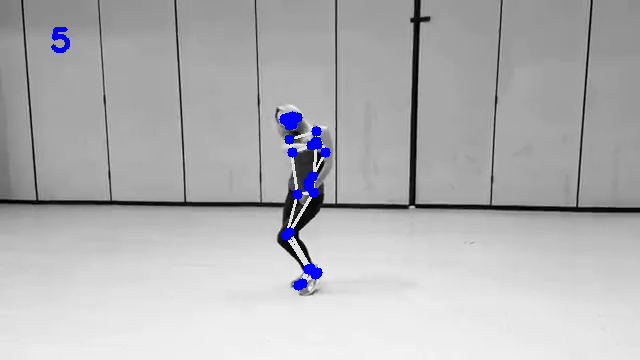

[[0, 289, 123], [1, 290, 119], [2, 291, 118], [3, 292, 118], [4, 287, 120], [5, 286, 121], [6, 286, 121], [7, 297, 118], [8, 288, 123], [9, 294, 125], [10, 290, 127], [11, 315, 134], [12, 293, 140], [13, 318, 159], [14, 292, 149], [15, 313, 181], [16, 303, 132], [17, 311, 184], [18, 307, 128], [19, 309, 186], [20, 306, 126], [21, 309, 186], [22, 305, 128], [23, 309, 196], [24, 297, 196], [25, 288, 234], [26, 287, 235], [27, 310, 269], [28, 307, 268], [29, 317, 273], [30, 314, 273], [31, 300, 285], [32, 297, 285]]


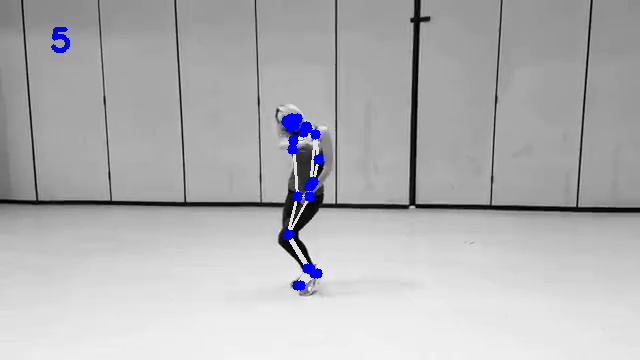

[[0, 289, 122], [1, 289, 118], [2, 290, 117], [3, 292, 117], [4, 287, 119], [5, 287, 119], [6, 286, 119], [7, 297, 117], [8, 289, 120], [9, 293, 125], [10, 290, 126], [11, 318, 135], [12, 290, 137], [13, 326, 165], [14, 277, 137], [15, 314, 188], [16, 291, 126], [17, 311, 195], [18, 295, 123], [19, 307, 194], [20, 296, 122], [21, 308, 192], [22, 295, 124], [23, 311, 195], [24, 295, 195], [25, 293, 237], [26, 289, 237], [27, 311, 271], [28, 308, 269], [29, 317, 275], [30, 314, 274], [31, 301, 287], [32, 298, 286]]


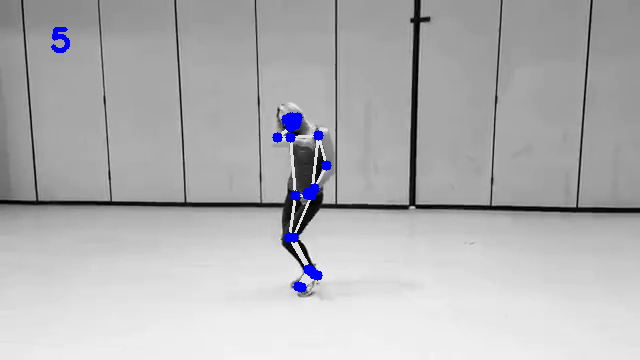

[[0, 290, 120], [1, 291, 115], [2, 292, 115], [3, 294, 114], [4, 288, 116], [5, 288, 116], [6, 287, 117], [7, 299, 115], [8, 289, 118], [9, 294, 122], [10, 291, 124], [11, 322, 136], [12, 289, 136], [13, 329, 166], [14, 276, 125], [15, 315, 188], [16, 286, 118], [17, 312, 194], [18, 290, 116], [19, 308, 193], [20, 291, 116], [21, 309, 191], [22, 291, 117], [23, 311, 195], [24, 294, 195], [25, 296, 239], [26, 290, 239], [27, 310, 271], [28, 307, 270], [29, 315, 275], [30, 312, 274], [31, 303, 288], [32, 299, 288]]


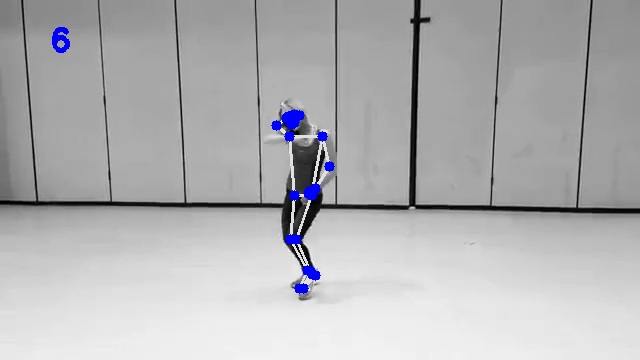

[[0, 294, 118], [1, 295, 113], [2, 296, 113], [3, 298, 112], [4, 292, 115], [5, 291, 115], [6, 291, 115], [7, 303, 114], [8, 293, 116], [9, 299, 121], [10, 294, 122], [11, 322, 137], [12, 289, 134], [13, 327, 165], [14, 278, 140], [15, 313, 188], [16, 294, 137], [17, 310, 194], [18, 298, 137], [19, 308, 193], [20, 300, 133], [21, 309, 191], [22, 299, 134], [23, 311, 196], [24, 293, 195], [25, 302, 242], [26, 293, 240], [27, 308, 279], [28, 308, 272], [29, 309, 284], [30, 312, 275], [31, 304, 296], [32, 305, 289]]


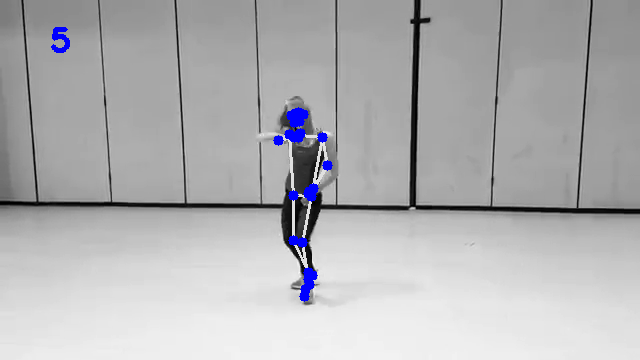

[[0, 301, 114], [1, 302, 111], [2, 304, 111], [3, 305, 111], [4, 299, 111], [5, 299, 111], [6, 298, 111], [7, 309, 114], [8, 299, 114], [9, 304, 118], [10, 300, 118], [11, 323, 139], [12, 289, 132], [13, 327, 169], [14, 267, 136], [15, 313, 190], [16, 266, 134], [17, 308, 196], [18, 263, 135], [19, 306, 195], [20, 265, 134], [21, 306, 193], [22, 267, 134], [23, 312, 196], [24, 293, 197], [25, 308, 245], [26, 293, 241], [27, 306, 283], [28, 308, 267], [29, 304, 289], [30, 311, 269], [31, 306, 302], [32, 308, 282]]


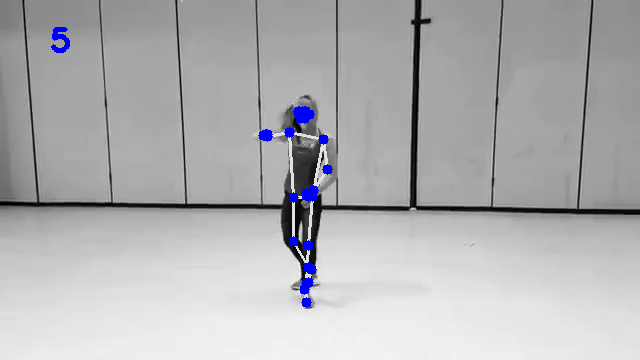

[[0, 313, 111], [1, 314, 109], [2, 315, 110], [3, 316, 110], [4, 311, 108], [5, 310, 109], [6, 309, 109], [7, 316, 114], [8, 306, 111], [9, 314, 117], [10, 311, 116], [11, 326, 140], [12, 290, 130], [13, 329, 171], [14, 269, 135], [15, 317, 193], [16, 267, 136], [17, 314, 201], [18, 263, 136], [19, 312, 199], [20, 266, 136], [21, 311, 197], [22, 267, 136], [23, 313, 197], [24, 293, 197], [25, 314, 244], [26, 294, 241], [27, 305, 285], [28, 310, 274], [29, 300, 290], [30, 314, 278], [31, 306, 304], [32, 311, 292]]


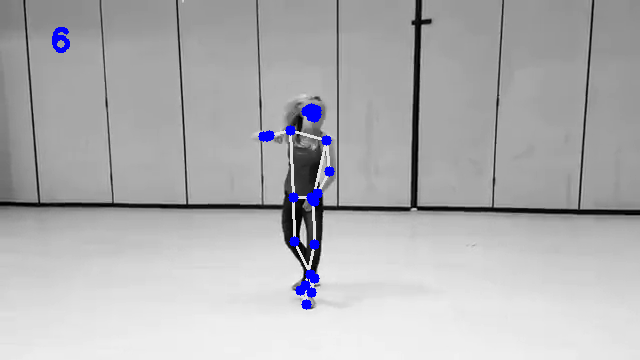

[[0, 319, 121], [1, 320, 117], [2, 321, 117], [3, 322, 118], [4, 317, 116], [5, 316, 116], [6, 314, 115], [7, 320, 120], [8, 309, 116], [9, 319, 126], [10, 315, 125], [11, 324, 140], [12, 290, 129], [13, 327, 171], [14, 265, 128], [15, 318, 190], [16, 263, 138], [17, 314, 196], [18, 261, 140], [19, 313, 195], [20, 262, 140], [21, 313, 192], [22, 266, 140], [23, 313, 198], [24, 292, 199], [25, 312, 246], [26, 293, 242], [27, 305, 286], [28, 311, 271], [29, 302, 290], [30, 313, 271], [31, 307, 303], [32, 308, 289]]


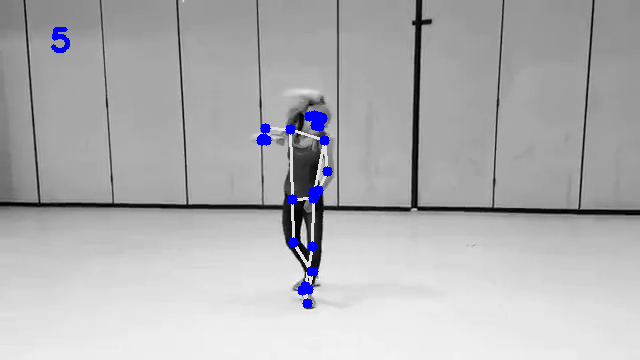

[[0, 318, 117], [1, 319, 113], [2, 320, 113], [3, 320, 113], [4, 315, 113], [5, 313, 113], [6, 311, 113], [7, 318, 115], [8, 308, 114], [9, 319, 121], [10, 315, 121], [11, 325, 135], [12, 294, 129], [13, 324, 167], [14, 270, 136], [15, 315, 192], [16, 265, 135], [17, 312, 200], [18, 266, 128], [19, 309, 200], [20, 267, 127], [21, 310, 196], [22, 268, 128], [23, 313, 194], [24, 294, 194], [25, 312, 244], [26, 295, 239], [27, 305, 286], [28, 308, 274], [29, 301, 292], [30, 311, 277], [31, 306, 304], [32, 309, 290]]


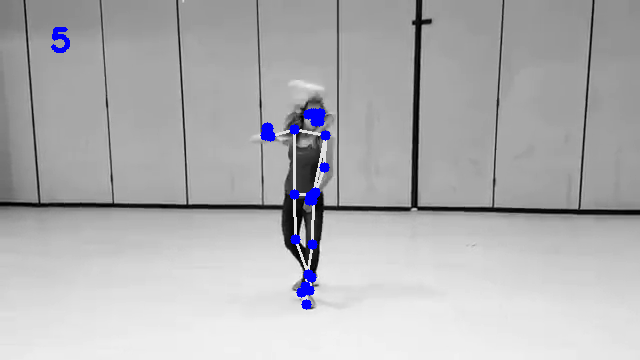

[[0, 310, 116], [1, 314, 111], [2, 315, 112], [3, 317, 112], [4, 309, 111], [5, 307, 110], [6, 306, 110], [7, 319, 114], [8, 304, 111], [9, 312, 121], [10, 307, 120], [11, 325, 136], [12, 291, 129], [13, 327, 169], [14, 265, 136], [15, 312, 196], [16, 260, 137], [17, 309, 203], [18, 255, 137], [19, 306, 200], [20, 259, 136], [21, 307, 199], [22, 260, 137], [23, 313, 196], [24, 294, 196], [25, 308, 246], [26, 290, 241], [27, 305, 286], [28, 308, 275], [29, 298, 296], [30, 313, 279], [31, 304, 305], [32, 308, 291]]


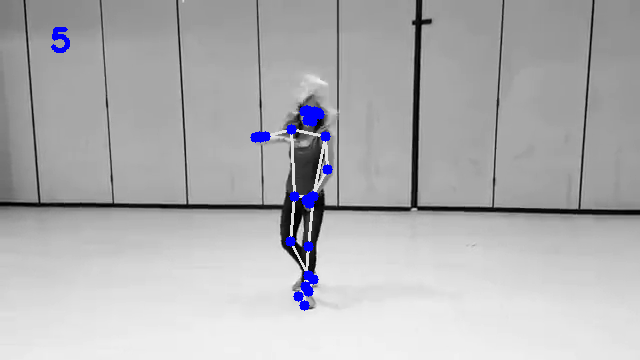

[[0, 303, 114], [1, 306, 110], [2, 308, 110], [3, 310, 110], [4, 302, 110], [5, 301, 110], [6, 300, 110], [7, 313, 113], [8, 300, 112], [9, 306, 118], [10, 301, 118], [11, 322, 135], [12, 295, 136], [13, 324, 166], [14, 285, 123], [15, 314, 192], [16, 293, 111], [17, 312, 200], [18, 296, 108], [19, 309, 198], [20, 296, 109], [21, 309, 196], [22, 295, 110], [23, 313, 199], [24, 295, 199], [25, 306, 248], [26, 289, 243], [27, 306, 289], [28, 307, 278], [29, 306, 299], [30, 310, 281], [31, 302, 304], [32, 304, 297]]


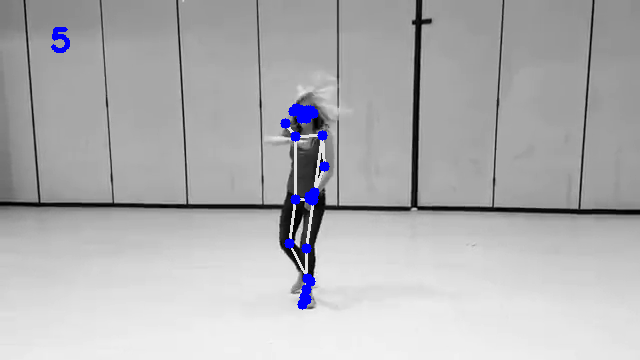

[[0, 300, 113], [1, 303, 110], [2, 305, 110], [3, 306, 110], [4, 300, 109], [5, 299, 109], [6, 299, 109], [7, 311, 113], [8, 300, 112], [9, 303, 118], [10, 298, 118], [11, 323, 136], [12, 293, 136], [13, 327, 167], [14, 289, 126], [15, 317, 194], [16, 303, 117], [17, 314, 202], [18, 306, 115], [19, 311, 200], [20, 307, 115], [21, 312, 197], [22, 306, 116], [23, 313, 200], [24, 294, 200], [25, 306, 249], [26, 289, 246], [27, 307, 290], [28, 304, 278], [29, 307, 295], [30, 308, 280], [31, 301, 304], [32, 300, 295]]


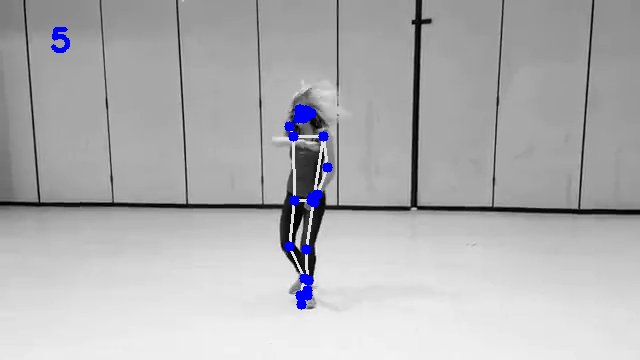

[[0, 297, 114], [1, 299, 109], [2, 301, 109], [3, 303, 108], [4, 295, 110], [5, 294, 110], [6, 293, 110], [7, 308, 111], [8, 293, 112], [9, 300, 118], [10, 295, 119], [11, 323, 131], [12, 286, 134], [13, 325, 160], [14, 288, 153], [15, 317, 188], [16, 309, 143], [17, 312, 196], [18, 313, 142], [19, 311, 196], [20, 313, 140], [21, 312, 192], [22, 313, 139], [23, 315, 196], [24, 293, 197], [25, 309, 247], [26, 289, 245], [27, 306, 286], [28, 305, 275], [29, 305, 291], [30, 308, 279], [31, 303, 303], [32, 303, 295]]


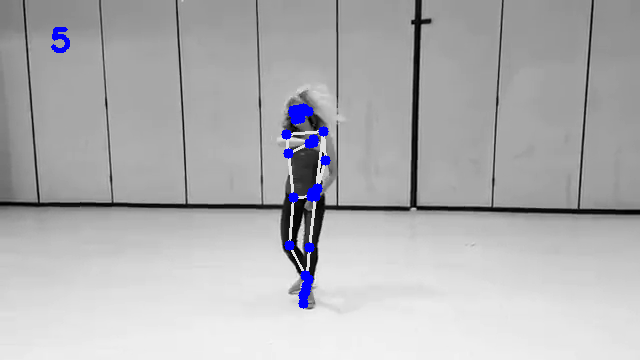

[[0, 295, 115], [1, 296, 111], [2, 298, 110], [3, 300, 110], [4, 293, 112], [5, 291, 112], [6, 290, 112], [7, 305, 111], [8, 290, 115], [9, 299, 118], [10, 294, 120], [11, 322, 133], [12, 286, 134], [13, 327, 161], [14, 283, 140], [15, 319, 191], [16, 306, 143], [17, 315, 200], [18, 311, 142], [19, 313, 199], [20, 312, 141], [21, 314, 196], [22, 311, 141], [23, 313, 199], [24, 291, 201], [25, 313, 249], [26, 291, 248], [27, 305, 286], [28, 307, 278], [29, 303, 291], [30, 309, 280], [31, 305, 304], [32, 303, 296]]


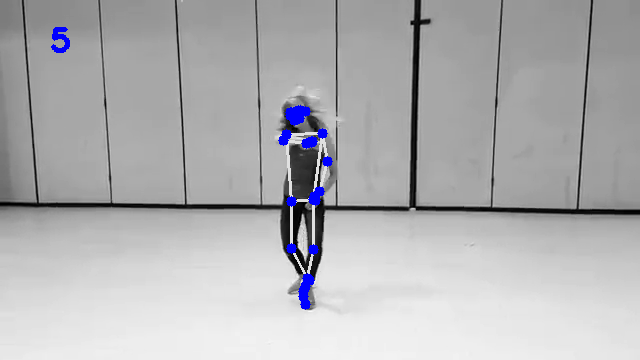

[[0, 300, 117], [1, 301, 112], [2, 303, 112], [3, 305, 111], [4, 297, 114], [5, 296, 114], [6, 294, 115], [7, 308, 113], [8, 293, 118], [9, 305, 120], [10, 299, 121], [11, 324, 133], [12, 289, 137], [13, 326, 160], [14, 281, 131], [15, 325, 187], [16, 291, 115], [17, 323, 195], [18, 293, 111], [19, 320, 194], [20, 292, 112], [21, 320, 191], [22, 293, 114], [23, 313, 200], [24, 291, 202], [25, 319, 247], [26, 288, 248], [27, 309, 285], [28, 303, 277], [29, 308, 288], [30, 306, 280], [31, 311, 305], [32, 300, 297]]


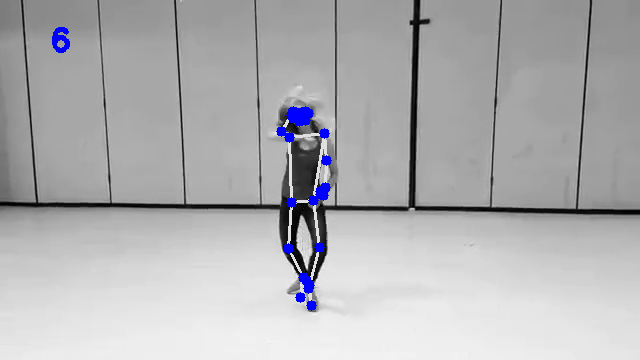

[[0, 306, 117], [1, 307, 112], [2, 309, 112], [3, 311, 112], [4, 303, 113], [5, 301, 114], [6, 300, 114], [7, 313, 114], [8, 298, 117], [9, 310, 121], [10, 304, 122], [11, 325, 139], [12, 289, 135], [13, 330, 166], [14, 275, 131], [15, 327, 191], [16, 286, 126], [17, 324, 198], [18, 288, 123], [19, 321, 197], [20, 290, 123], [21, 321, 195], [22, 290, 125], [23, 312, 202], [24, 289, 204], [25, 322, 248], [26, 288, 249], [27, 312, 287], [28, 301, 276], [29, 311, 291], [30, 304, 279], [31, 318, 309], [32, 297, 295]]


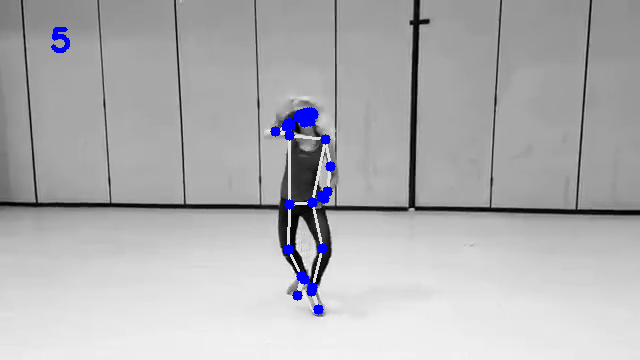

[[0, 311, 119], [1, 313, 115], [2, 314, 115], [3, 316, 115], [4, 309, 115], [5, 307, 115], [6, 306, 115], [7, 317, 117], [8, 302, 117], [9, 314, 123], [10, 309, 123], [11, 327, 143], [12, 289, 136], [13, 332, 171], [14, 260, 134], [15, 327, 193], [16, 282, 131], [17, 324, 199], [18, 286, 130], [19, 321, 198], [20, 289, 130], [21, 322, 196], [22, 289, 132], [23, 312, 205], [24, 287, 206], [25, 324, 250], [26, 287, 250], [27, 319, 299], [28, 298, 272], [29, 316, 302], [30, 301, 275], [31, 325, 316], [32, 291, 291]]


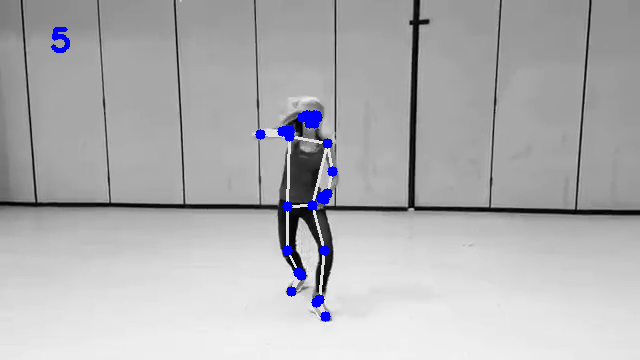

[[0, 320, 124], [1, 322, 120], [2, 323, 121], [3, 324, 121], [4, 319, 119], [5, 317, 119], [6, 316, 118], [7, 323, 123], [8, 311, 119], [9, 320, 128], [10, 317, 127], [11, 327, 144], [12, 290, 132], [13, 332, 172], [14, 256, 137], [15, 327, 196], [16, 261, 137], [17, 325, 202], [18, 258, 138], [19, 323, 201], [20, 263, 138], [21, 322, 199], [22, 264, 138], [23, 312, 205], [24, 288, 206], [25, 326, 254], [26, 287, 250], [27, 320, 298], [28, 297, 273], [29, 317, 301], [30, 300, 275], [31, 324, 315], [32, 291, 291]]


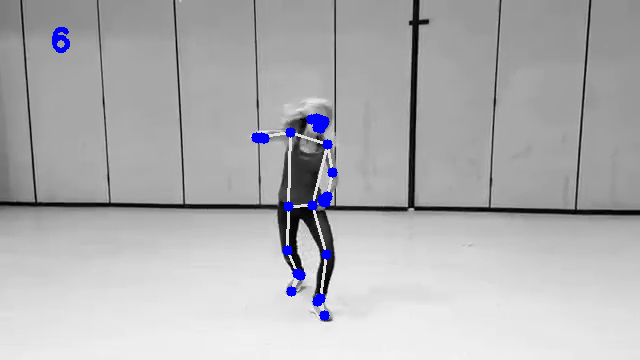

[[0, 322, 125], [1, 325, 124], [2, 327, 125], [3, 328, 126], [4, 322, 121], [5, 320, 119], [6, 319, 118], [7, 327, 128], [8, 314, 119], [9, 321, 130], [10, 316, 126], [11, 328, 147], [12, 292, 132], [13, 333, 176], [14, 286, 126], [15, 327, 195], [16, 300, 120], [17, 325, 202], [18, 302, 117], [19, 323, 201], [20, 303, 118], [21, 323, 199], [22, 303, 120], [23, 313, 207], [24, 288, 208], [25, 328, 253], [26, 288, 252], [27, 319, 298], [28, 296, 269], [29, 315, 302], [30, 298, 270], [31, 325, 316], [32, 291, 290]]


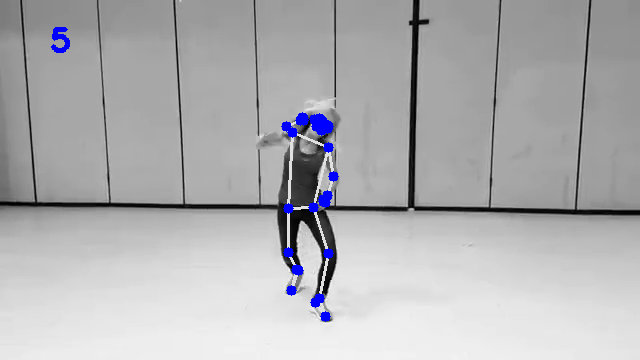

[[0, 321, 124], [1, 325, 124], [2, 326, 125], [3, 327, 126], [4, 321, 120], [5, 320, 119], [6, 319, 119], [7, 326, 129], [8, 315, 120], [9, 320, 129], [10, 316, 125], [11, 327, 150], [12, 291, 138], [13, 335, 178], [14, 273, 145], [15, 325, 197], [16, 295, 132], [17, 323, 203], [18, 299, 130], [19, 320, 202], [20, 301, 130], [21, 320, 200], [22, 300, 132], [23, 312, 209], [24, 288, 209], [25, 326, 256], [26, 284, 253], [27, 319, 299], [28, 294, 270], [29, 315, 304], [30, 298, 270], [31, 325, 317], [32, 291, 290]]


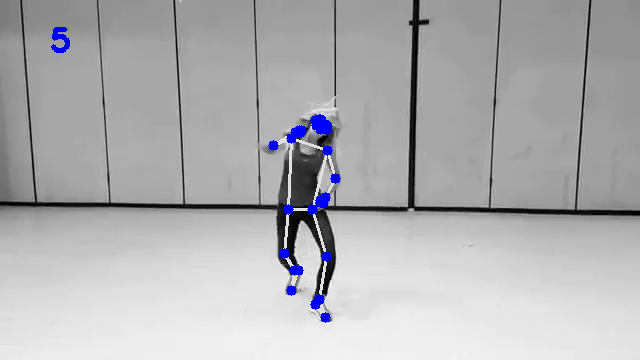

[[0, 318, 121], [1, 323, 122], [2, 324, 124], [3, 325, 125], [4, 320, 120], [5, 319, 119], [6, 318, 119], [7, 324, 128], [8, 315, 121], [9, 317, 126], [10, 314, 124], [11, 327, 150], [12, 290, 138], [13, 335, 178], [14, 272, 155], [15, 323, 198], [16, 268, 150], [17, 320, 205], [18, 266, 150], [19, 318, 203], [20, 268, 147], [21, 318, 201], [22, 270, 148], [23, 310, 209], [24, 287, 208], [25, 324, 256], [26, 278, 254], [27, 317, 300], [28, 291, 269], [29, 313, 306], [30, 294, 268], [31, 324, 318], [32, 290, 290]]


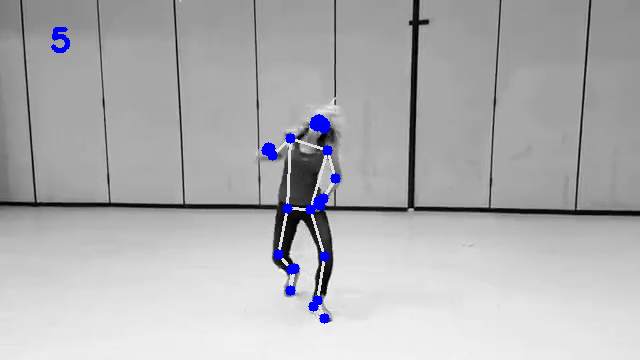

[[0, 314, 119], [1, 318, 117], [2, 320, 118], [3, 322, 120], [4, 315, 115], [5, 314, 115], [6, 313, 114], [7, 325, 123], [8, 312, 115], [9, 315, 125], [10, 311, 122], [11, 329, 146], [12, 294, 135], [13, 337, 175], [14, 284, 160], [15, 323, 198], [16, 264, 168], [17, 320, 205], [18, 259, 168], [19, 317, 204], [20, 259, 168], [21, 318, 201], [22, 261, 168], [23, 312, 205], [24, 289, 205], [25, 324, 257], [26, 273, 251], [27, 317, 300], [28, 289, 273], [29, 313, 305], [30, 294, 274], [31, 323, 318], [32, 284, 295]]


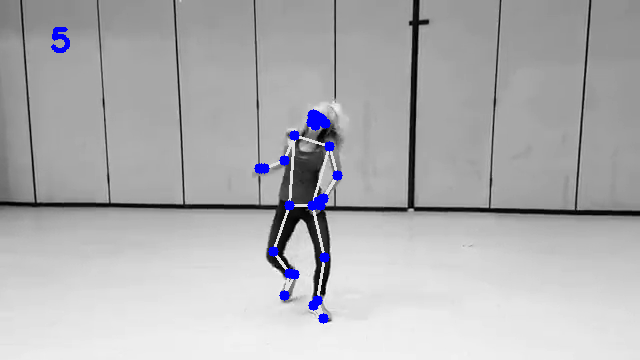

[[0, 312, 116], [1, 316, 114], [2, 318, 114], [3, 320, 115], [4, 313, 113], [5, 312, 112], [6, 311, 112], [7, 324, 118], [8, 312, 113], [9, 314, 121], [10, 309, 120], [11, 331, 144], [12, 296, 136], [13, 329, 177], [14, 287, 167], [15, 323, 201], [16, 267, 180], [17, 327, 210], [18, 261, 183], [19, 319, 207], [20, 261, 183], [21, 318, 205], [22, 264, 181], [23, 310, 207], [24, 289, 205], [25, 322, 257], [26, 267, 249], [27, 316, 300], [28, 284, 285], [29, 311, 304], [30, 290, 290], [31, 323, 318], [32, 275, 304]]


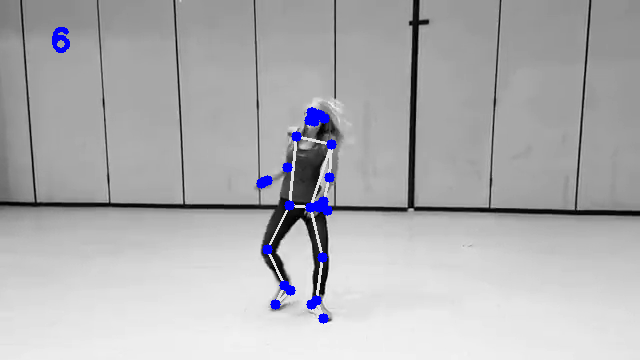

[[0, 308, 114], [1, 311, 111], [2, 313, 111], [3, 315, 112], [4, 308, 111], [5, 307, 111], [6, 306, 110], [7, 319, 114], [8, 307, 112], [9, 309, 119], [10, 305, 119], [11, 328, 140], [12, 293, 136], [13, 324, 175], [14, 286, 169], [15, 317, 204], [16, 276, 193], [17, 315, 213], [18, 271, 199], [19, 312, 212], [20, 273, 199], [21, 312, 210], [22, 274, 197], [23, 310, 206], [24, 287, 204], [25, 321, 255], [26, 265, 247], [27, 317, 302], [28, 273, 292], [29, 311, 306], [30, 279, 299], [31, 323, 318], [32, 256, 308]]


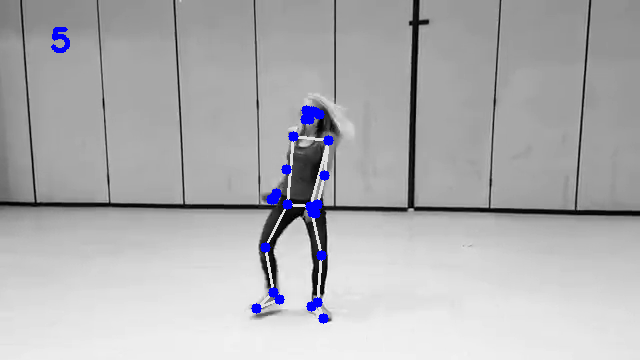

[[0, 304, 113], [1, 307, 109], [2, 309, 109], [3, 310, 108], [4, 303, 109], [5, 302, 110], [6, 301, 110], [7, 315, 110], [8, 303, 111], [9, 307, 117], [10, 303, 118], [11, 326, 137], [12, 295, 136], [13, 322, 162], [14, 292, 163], [15, 310, 176], [16, 295, 192], [17, 307, 183], [18, 294, 202], [19, 305, 184], [20, 296, 202], [21, 306, 182], [22, 297, 198], [23, 310, 206], [24, 286, 204], [25, 320, 253], [26, 266, 248], [27, 315, 301], [28, 256, 297], [29, 311, 307], [30, 259, 306], [31, 325, 317], [32, 236, 309]]


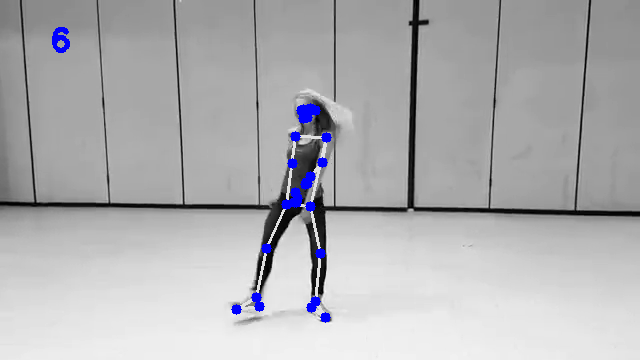

[[0, 298, 111], [1, 301, 107], [2, 303, 107], [3, 304, 107], [4, 298, 108], [5, 297, 108], [6, 296, 108], [7, 311, 109], [8, 300, 110], [9, 302, 116], [10, 298, 116], [11, 324, 135], [12, 295, 134], [13, 314, 173], [14, 288, 167], [15, 301, 206], [16, 288, 197], [17, 297, 213], [18, 287, 208], [19, 293, 213], [20, 288, 208], [21, 295, 210], [22, 290, 204], [23, 310, 204], [24, 288, 201], [25, 319, 254], [26, 265, 249], [27, 316, 302], [28, 245, 296], [29, 311, 308], [30, 247, 305], [31, 325, 317], [32, 223, 302]]


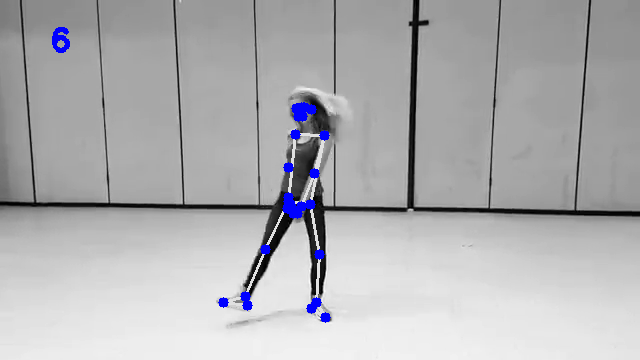

[[0, 298, 112], [1, 300, 107], [2, 301, 106], [3, 303, 106], [4, 295, 109], [5, 294, 109], [6, 293, 109], [7, 308, 106], [8, 294, 111], [9, 302, 116], [10, 297, 117], [11, 323, 130], [12, 292, 134], [13, 310, 171], [14, 290, 168], [15, 293, 205], [16, 287, 198], [17, 290, 213], [18, 286, 206], [19, 287, 213], [20, 284, 209], [21, 288, 211], [22, 285, 204], [23, 310, 204], [24, 288, 200], [25, 320, 255], [26, 262, 247], [27, 316, 300], [28, 244, 296], [29, 312, 306], [30, 247, 305], [31, 325, 317], [32, 222, 304]]


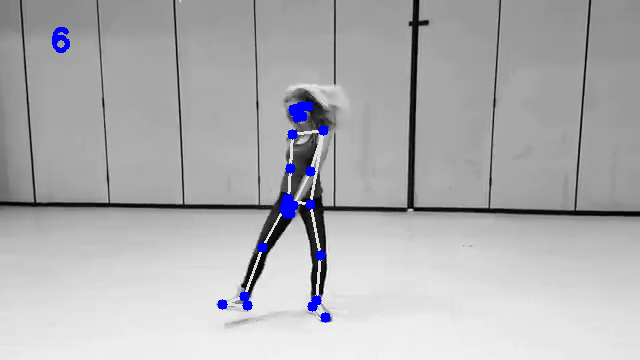

[[0, 296, 117], [1, 297, 111], [2, 299, 111], [3, 301, 110], [4, 293, 113], [5, 292, 113], [6, 291, 113], [7, 306, 109], [8, 293, 114], [9, 300, 121], [10, 295, 122], [11, 321, 131], [12, 291, 134], [13, 307, 163], [14, 291, 161], [15, 288, 197], [16, 289, 184], [17, 286, 205], [18, 288, 193], [19, 283, 204], [20, 290, 193], [21, 284, 201], [22, 291, 190], [23, 309, 203], [24, 287, 201], [25, 319, 254], [26, 257, 246], [27, 316, 302], [28, 247, 299], [29, 312, 307], [30, 252, 306], [31, 324, 317], [32, 227, 311]]


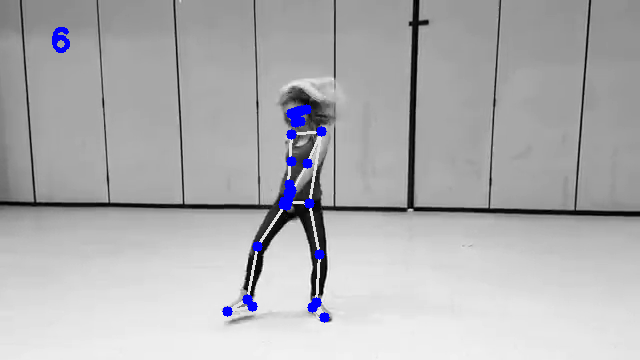

[[0, 293, 120], [1, 294, 115], [2, 296, 114], [3, 299, 112], [4, 290, 117], [5, 289, 117], [6, 288, 118], [7, 304, 112], [8, 288, 119], [9, 299, 123], [10, 293, 126], [11, 321, 130], [12, 289, 138], [13, 322, 101], [14, 296, 147], [15, 292, 98], [16, 315, 141], [17, 287, 98], [18, 324, 143], [19, 286, 101], [20, 321, 143], [21, 281, 111], [22, 320, 144], [23, 309, 208], [24, 285, 206], [25, 320, 257], [26, 256, 249], [27, 317, 304], [28, 252, 298], [29, 312, 309], [30, 257, 305], [31, 326, 319], [32, 238, 315]]


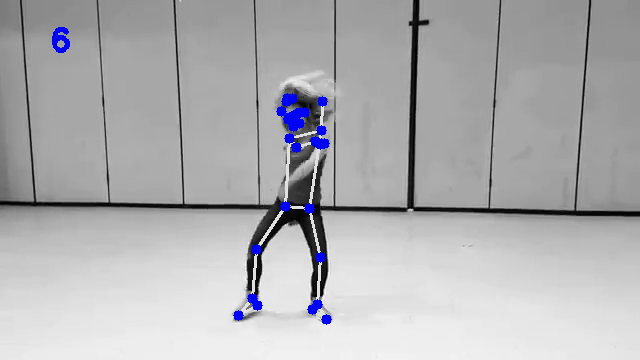

[[0, 291, 125], [1, 293, 121], [2, 295, 120], [3, 297, 119], [4, 289, 122], [5, 288, 122], [6, 287, 123], [7, 303, 119], [8, 287, 125], [9, 296, 129], [10, 291, 131], [11, 320, 139], [12, 288, 144], [13, 312, 126], [14, 294, 137], [15, 290, 114], [16, 316, 125], [17, 286, 111], [18, 322, 122], [19, 287, 114], [20, 319, 124], [21, 288, 115], [22, 318, 126], [23, 308, 215], [24, 283, 212], [25, 322, 263], [26, 253, 253], [27, 317, 303], [28, 257, 296], [29, 313, 308], [30, 262, 302], [31, 327, 319], [32, 245, 314]]


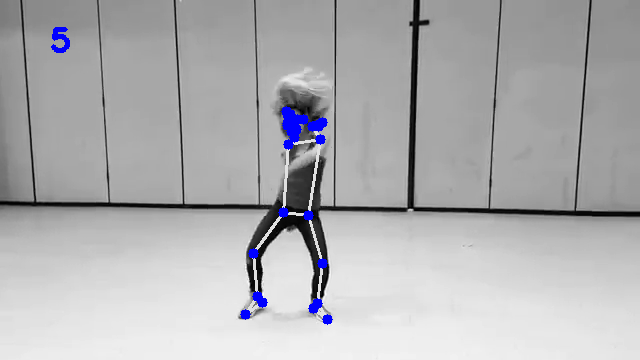

[[0, 291, 129], [1, 292, 124], [2, 294, 124], [3, 297, 123], [4, 288, 125], [5, 287, 126], [6, 285, 126], [7, 302, 124], [8, 285, 128], [9, 296, 133], [10, 290, 134], [11, 317, 146], [12, 284, 151], [13, 315, 147], [14, 288, 175], [15, 297, 155], [16, 287, 202], [17, 293, 157], [18, 286, 210], [19, 291, 157], [20, 287, 210], [21, 293, 156], [22, 289, 208], [23, 306, 220], [24, 281, 217], [25, 322, 265], [26, 255, 258], [27, 316, 304], [28, 256, 297], [29, 311, 308], [30, 260, 302], [31, 325, 320], [32, 245, 314]]


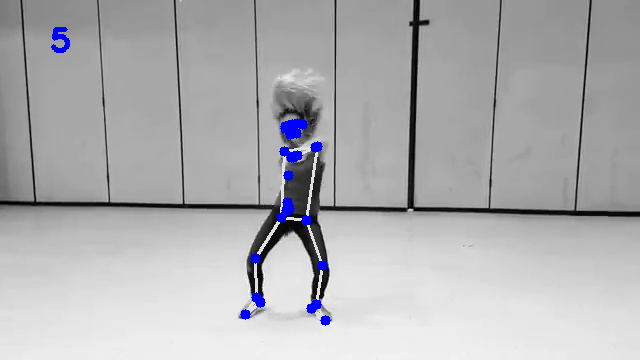

[[0, 291, 132], [1, 293, 127], [2, 295, 127], [3, 297, 127], [4, 288, 128], [5, 287, 128], [6, 286, 128], [7, 300, 128], [8, 285, 131], [9, 295, 136], [10, 289, 137], [11, 314, 150], [12, 281, 155], [13, 315, 139], [14, 285, 148], [15, 301, 140], [16, 312, 138], [17, 297, 139], [18, 318, 137], [19, 294, 141], [20, 316, 136], [21, 295, 142], [22, 313, 139], [23, 307, 225], [24, 281, 222], [25, 321, 269], [26, 253, 262], [27, 316, 304], [28, 257, 300], [29, 311, 308], [30, 261, 305], [31, 326, 320], [32, 243, 315]]


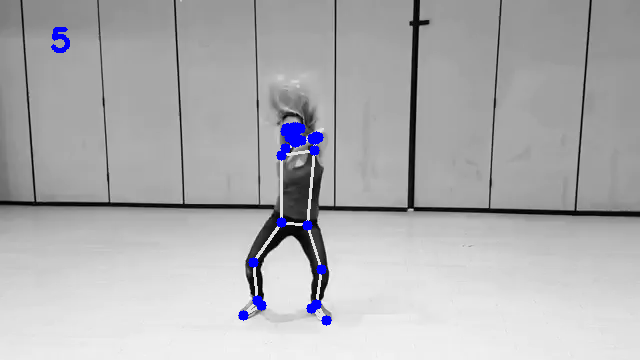

[[0, 291, 132], [1, 293, 128], [2, 295, 128], [3, 297, 128], [4, 289, 128], [5, 288, 128], [6, 286, 129], [7, 301, 130], [8, 285, 131], [9, 295, 136], [10, 290, 137], [11, 314, 153], [12, 280, 159], [13, 322, 130], [14, 281, 152], [15, 304, 137], [16, 297, 143], [17, 303, 137], [18, 302, 141], [19, 302, 141], [20, 299, 142], [21, 302, 142], [22, 298, 144], [23, 307, 225], [24, 281, 223], [25, 321, 270], [26, 253, 263], [27, 315, 304], [28, 257, 299], [29, 309, 308], [30, 261, 305], [31, 325, 319], [32, 244, 316]]


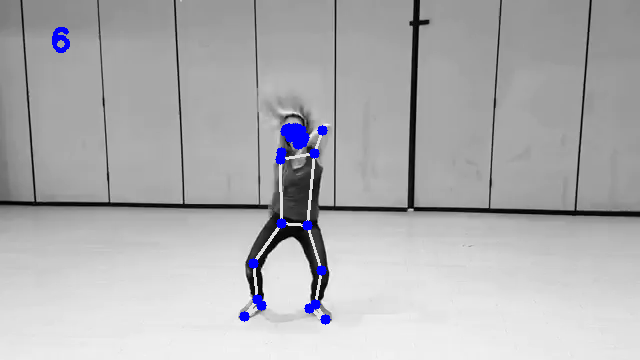

[[0, 294, 131], [1, 296, 128], [2, 298, 128], [3, 300, 128], [4, 291, 128], [5, 290, 128], [6, 288, 129], [7, 303, 129], [8, 287, 132], [9, 298, 136], [10, 291, 137], [11, 315, 151], [12, 279, 159], [13, 328, 133], [14, 273, 190], [15, 317, 135], [16, 267, 218], [17, 315, 134], [18, 265, 225], [19, 313, 133], [20, 267, 226], [21, 313, 134], [22, 268, 223], [23, 307, 224], [24, 281, 221], [25, 322, 269], [26, 254, 265], [27, 315, 303], [28, 257, 300], [29, 310, 307], [30, 261, 305], [31, 326, 318], [32, 243, 315]]


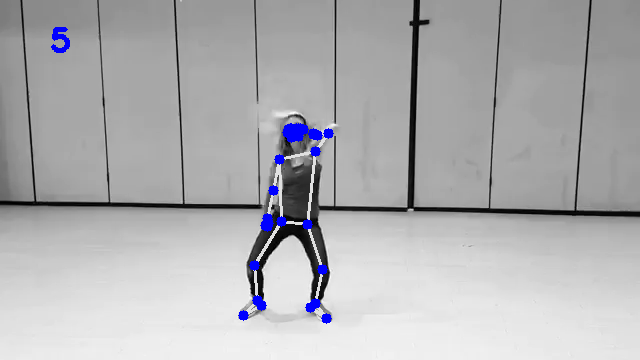

[[0, 298, 127], [1, 300, 124], [2, 301, 124], [3, 302, 124], [4, 295, 124], [5, 293, 124], [6, 292, 124], [7, 304, 127], [8, 290, 127], [9, 300, 131], [10, 295, 131], [11, 313, 148], [12, 278, 155], [13, 326, 137], [14, 268, 185], [15, 323, 138], [16, 262, 214], [17, 322, 137], [18, 260, 222], [19, 318, 138], [20, 262, 222], [21, 317, 139], [22, 264, 220], [23, 306, 218], [24, 281, 218], [25, 322, 266], [26, 257, 262], [27, 317, 302], [28, 256, 301], [29, 311, 307], [30, 261, 306], [31, 327, 319], [32, 244, 316]]


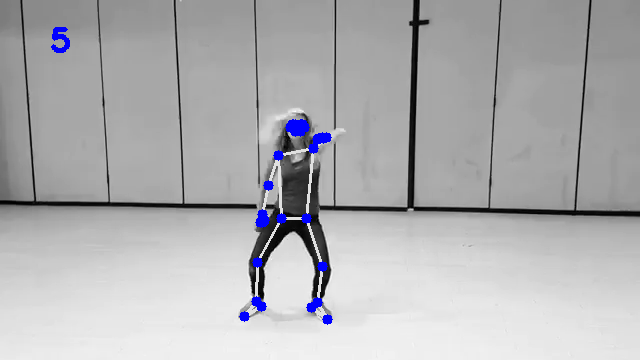

[[0, 297, 124], [1, 300, 120], [2, 302, 120], [3, 304, 121], [4, 295, 120], [5, 293, 120], [6, 292, 120], [7, 306, 123], [8, 291, 122], [9, 301, 129], [10, 294, 128], [11, 318, 145], [12, 278, 149], [13, 341, 142], [14, 265, 176], [15, 324, 144], [16, 261, 205], [17, 320, 149], [18, 258, 214], [19, 317, 144], [20, 261, 215], [21, 318, 147], [22, 263, 212], [23, 309, 215], [24, 283, 214], [25, 326, 262], [26, 259, 259], [27, 319, 299], [28, 257, 299], [29, 314, 303], [30, 261, 304], [31, 327, 318], [32, 244, 315]]


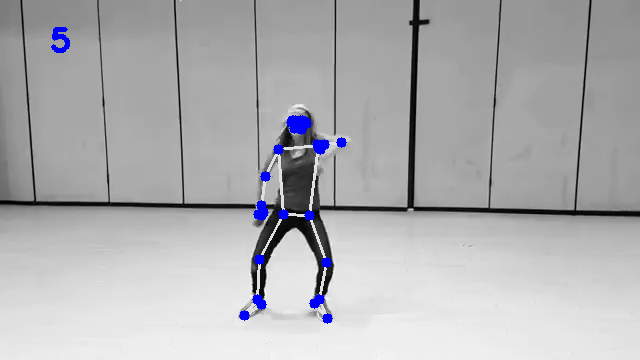

[[0, 298, 121], [1, 302, 117], [2, 303, 117], [3, 305, 118], [4, 297, 117], [5, 295, 117], [6, 294, 117], [7, 307, 121], [8, 292, 119], [9, 302, 125], [10, 295, 125], [11, 320, 145], [12, 279, 146], [13, 344, 152], [14, 261, 170], [15, 330, 162], [16, 262, 201], [17, 324, 170], [18, 262, 208], [19, 322, 169], [20, 264, 208], [21, 323, 165], [22, 265, 205], [23, 311, 212], [24, 283, 212], [25, 330, 260], [26, 259, 258], [27, 322, 298], [28, 257, 298], [29, 318, 301], [30, 261, 303], [31, 328, 317], [32, 244, 314]]


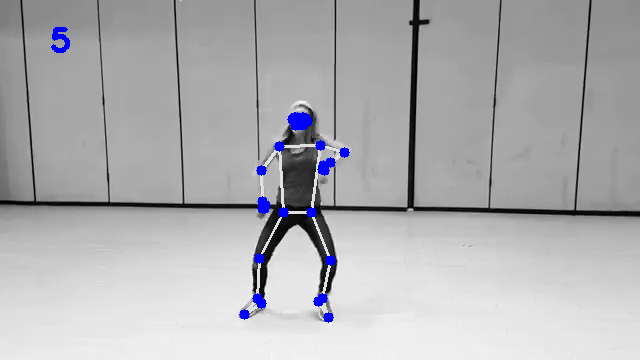

[[0, 298, 119], [1, 302, 115], [2, 304, 116], [3, 306, 116], [4, 297, 115], [5, 295, 115], [6, 294, 114], [7, 309, 119], [8, 292, 116], [9, 302, 125], [10, 295, 124], [11, 320, 145], [12, 278, 143], [13, 332, 168], [14, 260, 166], [15, 332, 174], [16, 263, 157], [17, 331, 176], [18, 263, 159], [19, 329, 175], [20, 266, 156], [21, 328, 174], [22, 266, 157], [23, 312, 211], [24, 283, 211], [25, 332, 257], [26, 260, 256], [27, 325, 295], [28, 257, 296], [29, 322, 299], [30, 260, 301], [31, 332, 316], [32, 245, 314]]


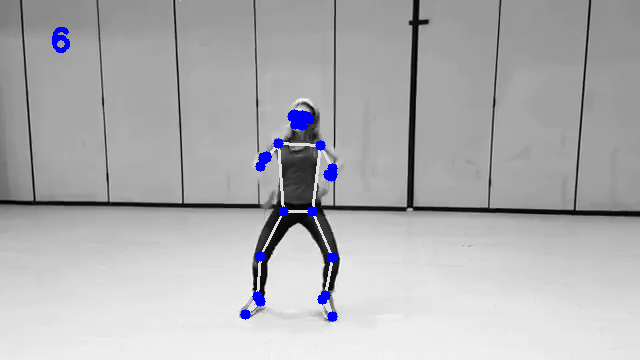

[[0, 298, 120], [1, 302, 116], [2, 304, 116], [3, 306, 117], [4, 297, 115], [5, 295, 114], [6, 294, 114], [7, 309, 120], [8, 293, 116], [9, 301, 125], [10, 294, 124], [11, 318, 145], [12, 281, 141], [13, 326, 166], [14, 264, 153], [15, 329, 180], [16, 270, 144], [17, 331, 187], [18, 269, 144], [19, 327, 185], [20, 272, 142], [21, 326, 182], [22, 274, 141], [23, 312, 210], [24, 286, 211], [25, 333, 255], [26, 260, 256], [27, 330, 295], [28, 259, 296], [29, 327, 298], [30, 263, 300], [31, 337, 314], [32, 247, 312]]


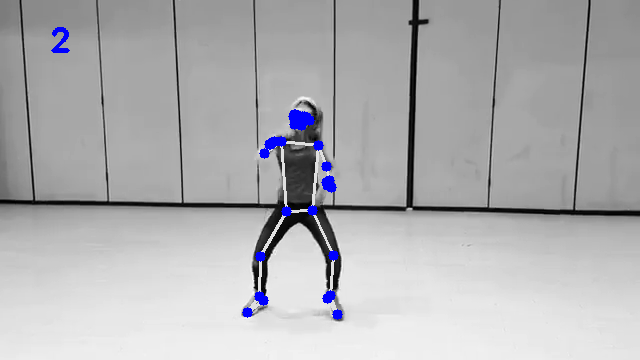

[[0, 300, 119], [1, 305, 115], [2, 307, 116], [3, 309, 116], [4, 299, 114], [5, 298, 114], [6, 297, 114], [7, 311, 119], [8, 296, 115], [9, 303, 124], [10, 297, 123], [11, 319, 145], [12, 281, 140], [13, 324, 172], [14, 271, 147], [15, 318, 196], [16, 289, 165], [17, 315, 204], [18, 291, 169], [19, 313, 202], [20, 294, 169], [21, 314, 199], [22, 293, 167], [23, 312, 210], [24, 286, 212], [25, 333, 256], [26, 260, 256], [27, 338, 297], [28, 261, 295], [29, 335, 300], [30, 266, 299], [31, 344, 314], [32, 250, 312]]


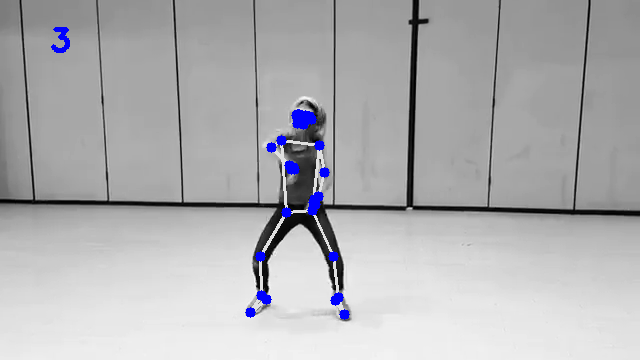

[[0, 300, 122], [1, 305, 118], [2, 307, 119], [3, 309, 120], [4, 299, 117], [5, 298, 116], [6, 297, 116], [7, 311, 123], [8, 296, 117], [9, 303, 128], [10, 297, 126], [11, 319, 149], [12, 279, 141], [13, 320, 178], [14, 280, 144], [15, 312, 203], [16, 302, 148], [17, 310, 211], [18, 310, 145], [19, 307, 209], [20, 311, 144], [21, 307, 206], [22, 308, 146], [23, 313, 212], [24, 287, 214], [25, 334, 259], [26, 260, 260], [27, 344, 298], [28, 264, 295], [29, 343, 302], [30, 269, 299], [31, 349, 316], [32, 250, 311]]


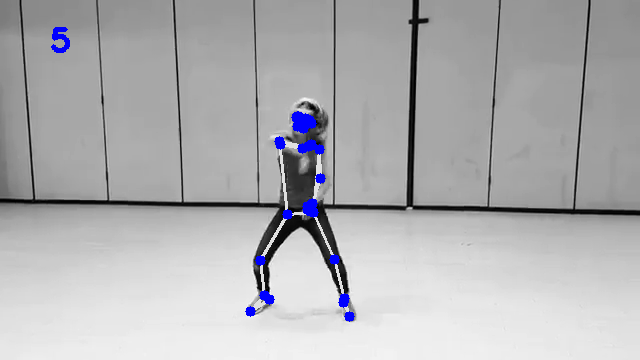

[[0, 299, 123], [1, 303, 119], [2, 305, 120], [3, 307, 120], [4, 299, 119], [5, 298, 119], [6, 296, 119], [7, 312, 124], [8, 296, 121], [9, 302, 129], [10, 297, 128], [11, 321, 151], [12, 284, 143], [13, 323, 182], [14, 285, 140], [15, 312, 206], [16, 302, 131], [17, 309, 214], [18, 306, 128], [19, 306, 213], [20, 306, 127], [21, 307, 210], [22, 307, 136], [23, 315, 216], [24, 289, 217], [25, 333, 263], [26, 262, 263], [27, 349, 299], [28, 264, 296], [29, 350, 303], [30, 268, 300], [31, 348, 316], [32, 250, 311]]


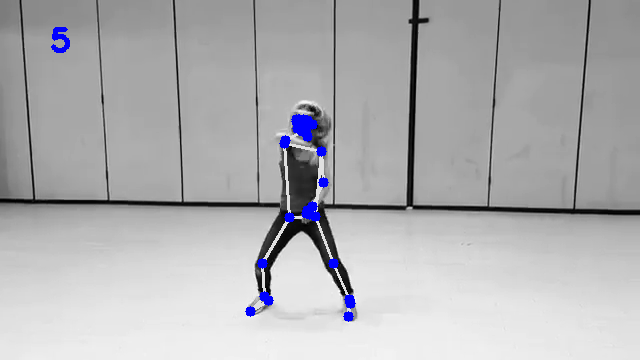

[[0, 300, 125], [1, 303, 121], [2, 305, 122], [3, 307, 122], [4, 299, 121], [5, 298, 121], [6, 296, 121], [7, 312, 125], [8, 295, 123], [9, 302, 131], [10, 297, 131], [11, 322, 150], [12, 284, 145], [13, 325, 174], [14, 282, 143], [15, 317, 203], [16, 306, 138], [17, 314, 212], [18, 314, 131], [19, 311, 210], [20, 314, 131], [21, 312, 207], [22, 313, 138], [23, 315, 217], [24, 289, 218], [25, 334, 264], [26, 265, 262], [27, 345, 298], [28, 263, 295], [29, 345, 302], [30, 267, 299], [31, 348, 316], [32, 251, 310]]


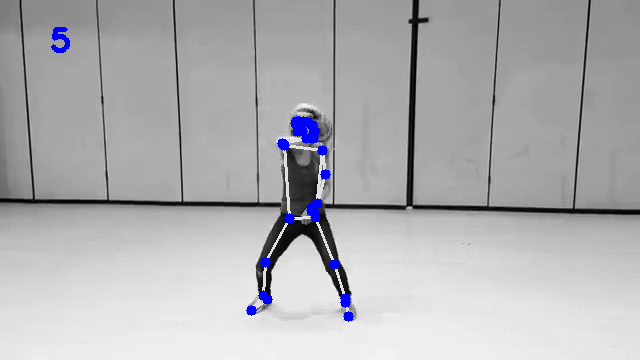

[[0, 301, 126], [1, 303, 122], [2, 305, 122], [3, 307, 123], [4, 299, 122], [5, 298, 122], [6, 296, 122], [7, 310, 126], [8, 294, 124], [9, 303, 131], [10, 299, 131], [11, 322, 151], [12, 285, 150], [13, 324, 179], [14, 285, 156], [15, 314, 208], [16, 307, 135], [17, 311, 216], [18, 313, 130], [19, 308, 213], [20, 312, 129], [21, 309, 211], [22, 311, 133], [23, 315, 219], [24, 290, 219], [25, 334, 265], [26, 265, 263], [27, 347, 303], [28, 262, 295], [29, 348, 307], [30, 266, 300], [31, 347, 317], [32, 250, 310]]


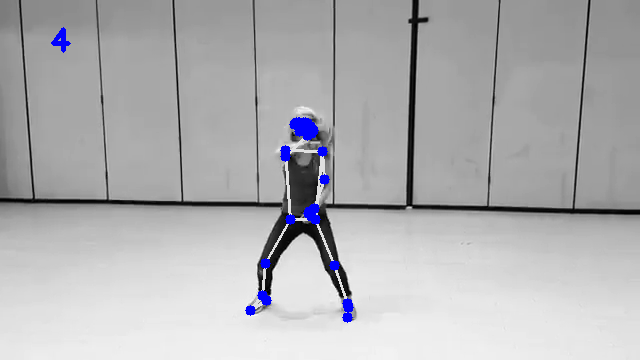

[[0, 301, 121], [1, 304, 118], [2, 305, 117], [3, 307, 117], [4, 299, 118], [5, 298, 118], [6, 296, 119], [7, 309, 120], [8, 295, 121], [9, 304, 125], [10, 299, 126], [11, 323, 144], [12, 287, 146], [13, 322, 171], [14, 276, 167], [15, 319, 200], [16, 299, 154], [17, 314, 208], [18, 303, 153], [19, 313, 207], [20, 304, 151], [21, 314, 204], [22, 303, 150], [23, 315, 215], [24, 290, 215], [25, 331, 263], [26, 266, 259], [27, 346, 300], [28, 262, 295], [29, 348, 304], [30, 266, 299], [31, 346, 316], [32, 249, 310]]


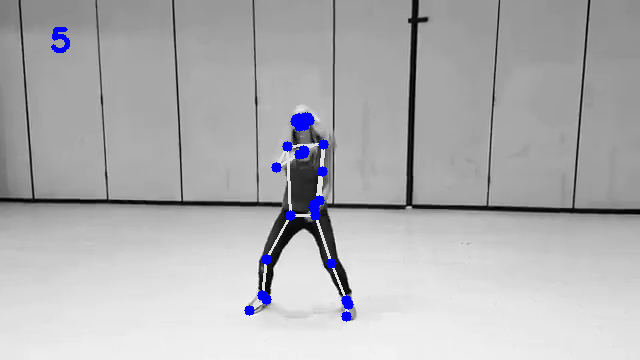

[[0, 301, 116], [1, 304, 113], [2, 305, 113], [3, 307, 113], [4, 300, 113], [5, 299, 113], [6, 298, 113], [7, 310, 116], [8, 297, 116], [9, 305, 121], [10, 300, 121], [11, 324, 140], [12, 285, 141], [13, 325, 170], [14, 277, 170], [15, 322, 204], [16, 296, 153], [17, 322, 213], [18, 300, 150], [19, 319, 213], [20, 300, 147], [21, 318, 209], [22, 299, 147], [23, 316, 209], [24, 290, 209], [25, 331, 260], [26, 268, 256], [27, 345, 299], [28, 263, 294], [29, 345, 303], [30, 266, 299], [31, 347, 316], [32, 250, 310]]


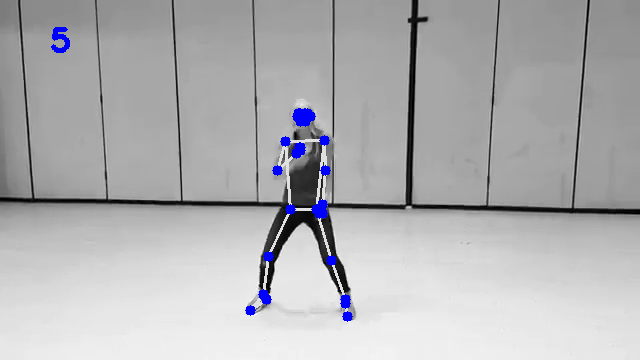

[[0, 301, 111], [1, 303, 108], [2, 305, 108], [3, 306, 108], [4, 299, 109], [5, 298, 110], [6, 297, 110], [7, 309, 111], [8, 296, 112], [9, 304, 115], [10, 300, 116], [11, 323, 134], [12, 285, 137], [13, 326, 162], [14, 282, 164], [15, 320, 143], [16, 284, 153], [17, 320, 138], [18, 285, 151], [19, 321, 135], [20, 284, 148], [21, 318, 130], [22, 285, 149], [23, 317, 203], [24, 291, 203], [25, 328, 255], [26, 269, 252], [27, 344, 296], [28, 265, 292], [29, 345, 301], [30, 270, 297], [31, 347, 316], [32, 251, 309]]


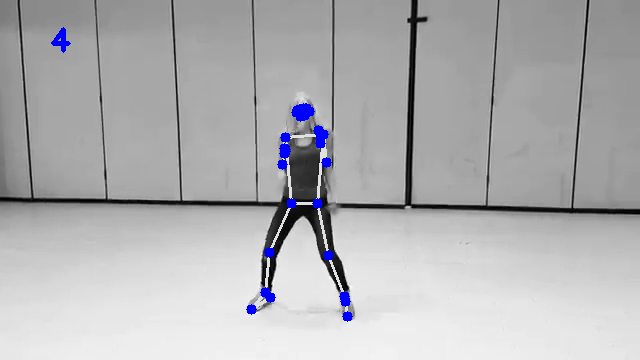

[[0, 301, 108], [1, 303, 104], [2, 304, 104], [3, 306, 104], [4, 299, 105], [5, 298, 105], [6, 297, 105], [7, 308, 107], [8, 296, 108], [9, 304, 112], [10, 300, 113], [11, 321, 132], [12, 285, 132], [13, 327, 162], [14, 285, 160], [15, 340, 190], [16, 276, 181], [17, 344, 197], [18, 273, 186], [19, 343, 197], [20, 274, 188], [21, 340, 195], [22, 276, 185], [23, 315, 198], [24, 291, 199], [25, 327, 253], [26, 270, 248], [27, 342, 295], [28, 273, 289], [29, 342, 299], [30, 277, 295], [31, 345, 317], [32, 259, 304]]


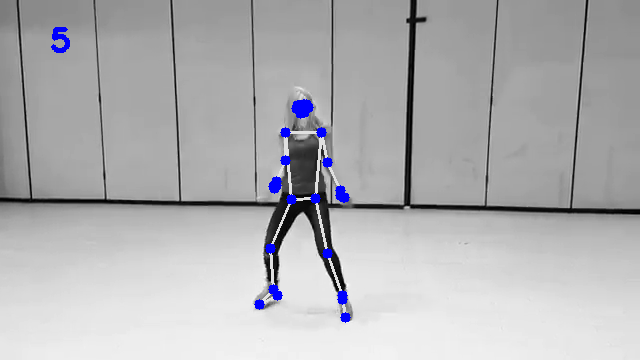

[[0, 296, 103], [1, 298, 99], [2, 299, 99], [3, 301, 99], [4, 295, 100], [5, 294, 100], [6, 293, 101], [7, 304, 102], [8, 294, 104], [9, 300, 107], [10, 296, 108], [11, 321, 128], [12, 286, 132], [13, 329, 159], [14, 282, 164], [15, 349, 179], [16, 265, 184], [17, 354, 184], [18, 259, 189], [19, 354, 185], [20, 260, 188], [21, 352, 183], [22, 262, 187], [23, 315, 194], [24, 291, 195], [25, 328, 249], [26, 272, 244], [27, 338, 296], [28, 284, 277], [29, 337, 299], [30, 290, 282], [31, 338, 317], [32, 272, 297]]


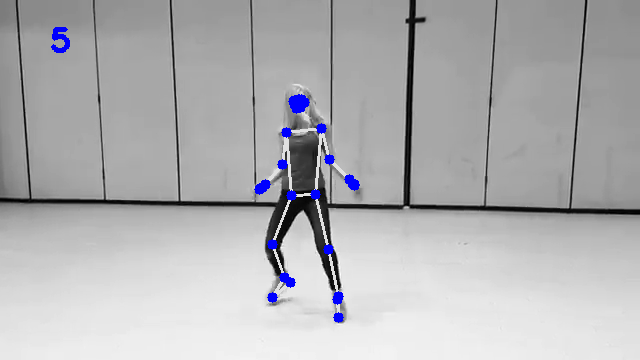

[[0, 295, 100], [1, 297, 97], [2, 299, 97], [3, 300, 97], [4, 294, 97], [5, 293, 97], [6, 293, 98], [7, 304, 100], [8, 293, 101], [9, 298, 104], [10, 293, 105], [11, 317, 125], [12, 285, 128], [13, 329, 152], [14, 281, 157], [15, 356, 173], [16, 264, 174], [17, 362, 177], [18, 257, 177], [19, 362, 177], [20, 257, 176], [21, 360, 176], [22, 261, 176], [23, 314, 191], [24, 291, 194], [25, 324, 244], [26, 274, 246], [27, 330, 300], [28, 293, 272], [29, 329, 304], [30, 298, 273], [31, 328, 324], [32, 287, 295]]


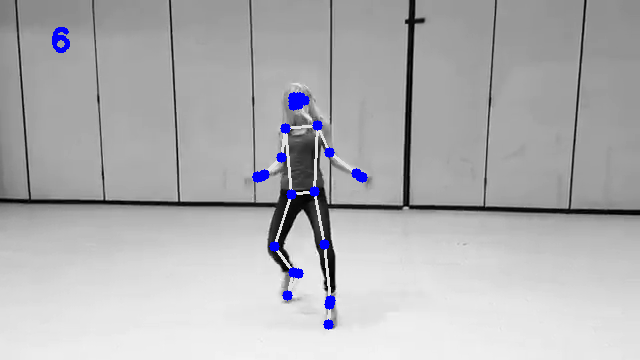

[[0, 298, 101], [1, 299, 98], [2, 300, 98], [3, 302, 98], [4, 296, 98], [5, 295, 99], [6, 294, 99], [7, 304, 101], [8, 293, 102], [9, 301, 105], [10, 296, 106], [11, 317, 125], [12, 285, 127], [13, 329, 152], [14, 281, 157], [15, 361, 162], [16, 260, 167], [17, 369, 162], [18, 259, 170], [19, 369, 161], [20, 249, 165], [21, 367, 162], [22, 253, 165], [23, 314, 193], [24, 290, 196], [25, 323, 248], [26, 278, 247], [27, 325, 304], [28, 295, 270], [29, 324, 310], [30, 300, 270], [31, 324, 328], [32, 294, 295]]


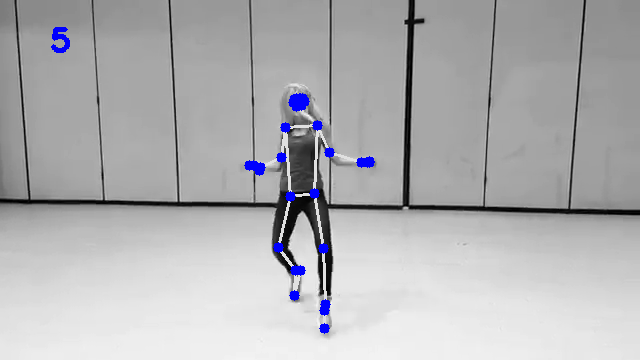

[[0, 295, 105], [1, 297, 101], [2, 299, 101], [3, 300, 100], [4, 294, 101], [5, 293, 102], [6, 292, 102], [7, 304, 103], [8, 292, 104], [9, 299, 110], [10, 295, 111], [11, 319, 128], [12, 283, 132], [13, 337, 156], [14, 275, 165], [15, 358, 151], [16, 251, 155], [17, 366, 148], [18, 246, 152], [19, 367, 145], [20, 246, 149], [21, 364, 147], [22, 248, 150], [23, 314, 199], [24, 290, 199], [25, 323, 251], [26, 285, 248], [27, 322, 303], [28, 299, 278], [29, 320, 308], [30, 303, 280], [31, 322, 325], [32, 295, 298]]


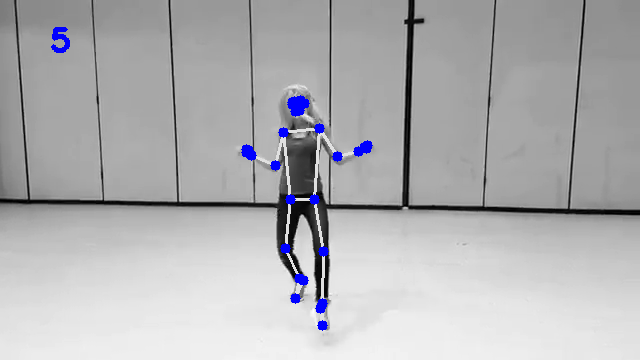

[[0, 295, 110], [1, 297, 105], [2, 298, 105], [3, 300, 105], [4, 293, 105], [5, 292, 106], [6, 291, 106], [7, 303, 108], [8, 290, 109], [9, 299, 114], [10, 294, 115], [11, 320, 131], [12, 282, 136], [13, 338, 159], [14, 275, 168], [15, 352, 143], [16, 254, 152], [17, 359, 138], [18, 248, 148], [19, 360, 135], [20, 249, 144], [21, 356, 137], [22, 251, 146], [23, 313, 200], [24, 290, 201], [25, 318, 250], [26, 289, 250], [27, 320, 297], [28, 304, 283], [29, 319, 302], [30, 308, 287], [31, 319, 318], [32, 299, 299]]


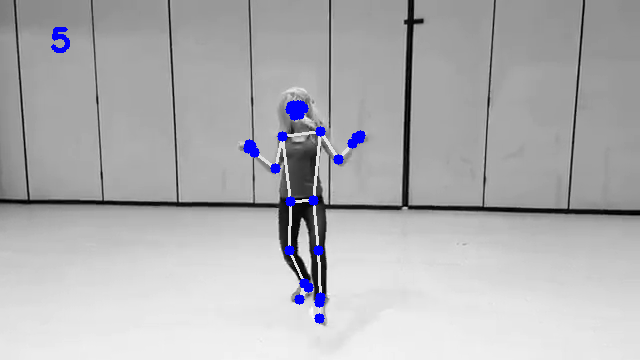

[[0, 294, 112], [1, 295, 108], [2, 296, 108], [3, 298, 108], [4, 293, 108], [5, 292, 108], [6, 291, 108], [7, 300, 110], [8, 290, 112], [9, 297, 116], [10, 293, 117], [11, 317, 135], [12, 281, 140], [13, 337, 162], [14, 276, 172], [15, 351, 148], [16, 257, 155], [17, 357, 143], [18, 251, 151], [19, 357, 140], [20, 250, 148], [21, 354, 143], [22, 253, 150], [23, 313, 203], [24, 290, 205], [25, 315, 252], [26, 290, 252], [27, 317, 293], [28, 307, 283], [29, 319, 298], [30, 311, 286], [31, 314, 313], [32, 298, 298]]


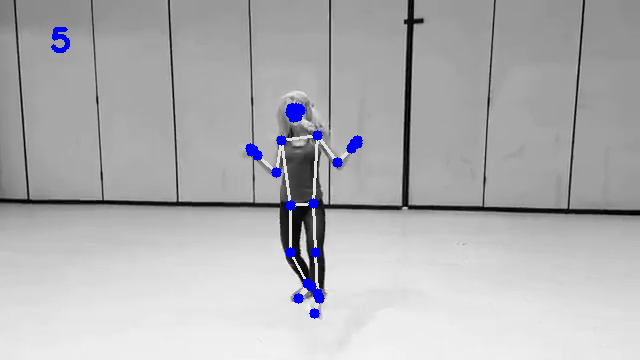

[]


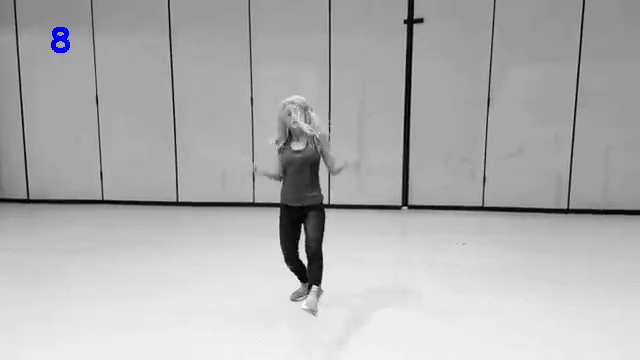

[[0, 293, 118], [1, 294, 114], [2, 296, 113], [3, 298, 113], [4, 290, 114], [5, 289, 115], [6, 287, 115], [7, 302, 115], [8, 286, 118], [9, 296, 122], [10, 292, 123], [11, 316, 142], [12, 283, 144], [13, 328, 170], [14, 280, 171], [15, 337, 166], [16, 258, 181], [17, 343, 170], [18, 253, 183], [19, 339, 161], [20, 254, 182], [21, 337, 162], [22, 256, 181], [23, 314, 205], [24, 292, 207], [25, 312, 251], [26, 286, 253], [27, 310, 290], [28, 306, 282], [29, 312, 295], [30, 310, 285], [31, 306, 309], [32, 299, 300]]


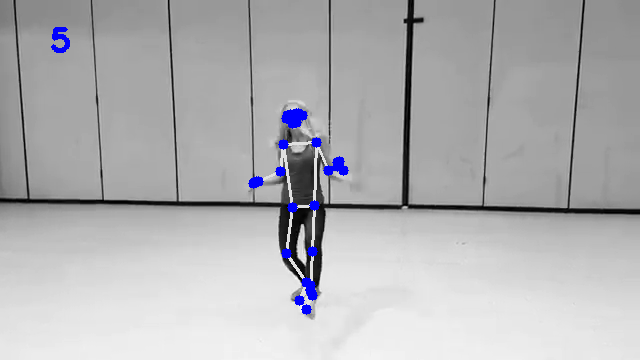

[[0, 293, 116], [1, 295, 113], [2, 296, 113], [3, 298, 113], [4, 290, 114], [5, 289, 114], [6, 288, 115], [7, 301, 115], [8, 287, 119], [9, 297, 122], [10, 292, 122], [11, 318, 142], [12, 283, 146], [13, 328, 173], [14, 282, 176], [15, 349, 187], [16, 258, 185], [17, 355, 192], [18, 253, 188], [19, 354, 192], [20, 253, 186], [21, 352, 191], [22, 255, 185], [23, 311, 205], [24, 290, 207], [25, 312, 249], [26, 288, 251], [27, 308, 293], [28, 306, 284], [29, 308, 300], [30, 309, 287], [31, 303, 314], [32, 296, 298]]


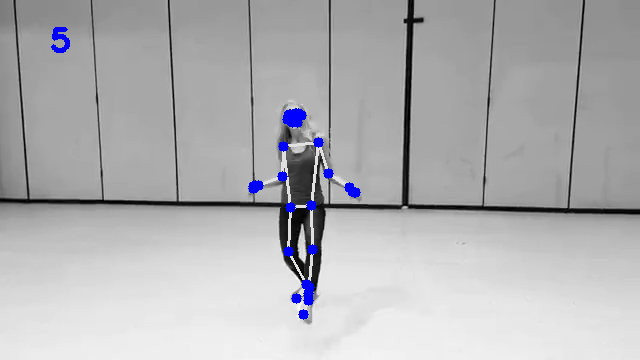

[[0, 294, 116], [1, 295, 111], [2, 297, 111], [3, 298, 111], [4, 291, 112], [5, 290, 113], [6, 289, 113], [7, 303, 114], [8, 287, 116], [9, 297, 121], [10, 292, 121], [11, 318, 140], [12, 280, 142], [13, 328, 171], [14, 282, 170], [15, 353, 181], [16, 255, 179], [17, 358, 184], [18, 251, 181], [19, 358, 184], [20, 250, 179], [21, 356, 183], [22, 252, 179], [23, 313, 203], [24, 291, 206], [25, 312, 252], [26, 291, 253], [27, 306, 296], [28, 307, 286], [29, 305, 301], [30, 310, 290], [31, 301, 319], [32, 301, 301]]


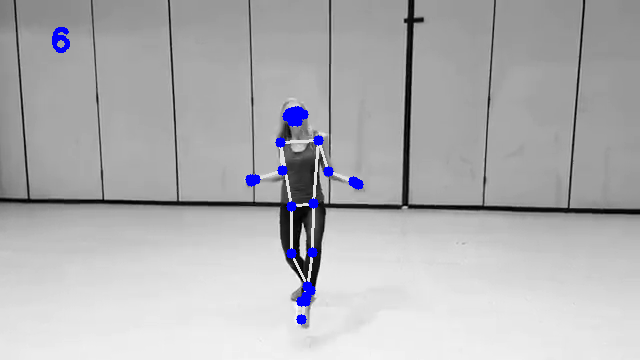

[[0, 294, 113], [1, 295, 108], [2, 297, 108], [3, 298, 108], [4, 291, 109], [5, 290, 109], [6, 289, 110], [7, 302, 110], [8, 287, 113], [9, 297, 117], [10, 292, 117], [11, 318, 135], [12, 280, 139], [13, 328, 165], [14, 280, 167], [15, 353, 172], [16, 252, 167], [17, 359, 174], [18, 248, 166], [19, 359, 173], [20, 248, 164], [21, 357, 173], [22, 249, 165], [23, 313, 200], [24, 290, 202], [25, 311, 251], [26, 292, 249], [27, 303, 299], [28, 306, 282], [29, 297, 310], [30, 308, 287], [31, 299, 320], [32, 299, 297]]


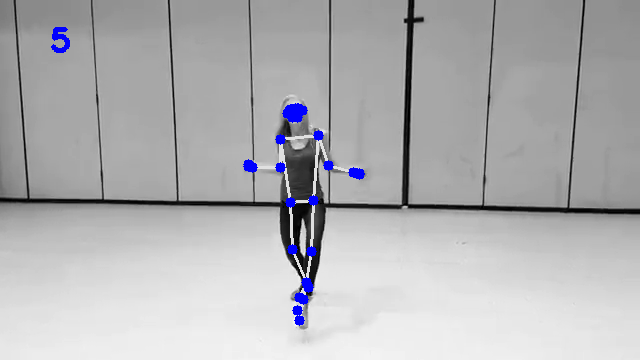

[[0, 295, 111], [1, 296, 107], [2, 298, 107], [3, 300, 107], [4, 292, 108], [5, 291, 108], [6, 289, 109], [7, 303, 109], [8, 287, 111], [9, 299, 116], [10, 293, 117], [11, 319, 135], [12, 280, 139], [13, 335, 158], [14, 277, 165], [15, 357, 156], [16, 252, 154], [17, 365, 155], [18, 248, 152], [19, 365, 153], [20, 248, 150], [21, 362, 154], [22, 250, 150], [23, 314, 200], [24, 291, 201], [25, 310, 250], [26, 292, 246], [27, 300, 299], [28, 309, 280], [29, 297, 305], [30, 314, 283], [31, 298, 319], [32, 309, 297]]


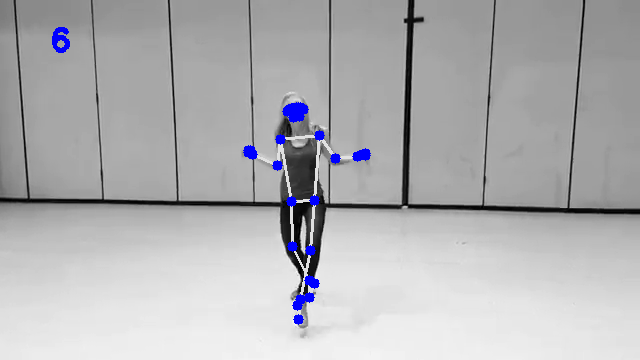

[[0, 296, 109], [1, 297, 105], [2, 299, 105], [3, 300, 105], [4, 293, 106], [5, 291, 106], [6, 289, 106], [7, 303, 106], [8, 287, 109], [9, 300, 113], [10, 294, 114], [11, 320, 131], [12, 280, 136], [13, 339, 154], [14, 272, 162], [15, 358, 145], [16, 253, 144], [17, 364, 142], [18, 248, 140], [19, 364, 139], [20, 248, 138], [21, 362, 140], [22, 250, 139], [23, 314, 198], [24, 291, 198], [25, 310, 252], [26, 293, 247], [27, 299, 303], [28, 307, 276], [29, 296, 307], [30, 309, 279], [31, 300, 322], [32, 307, 288]]


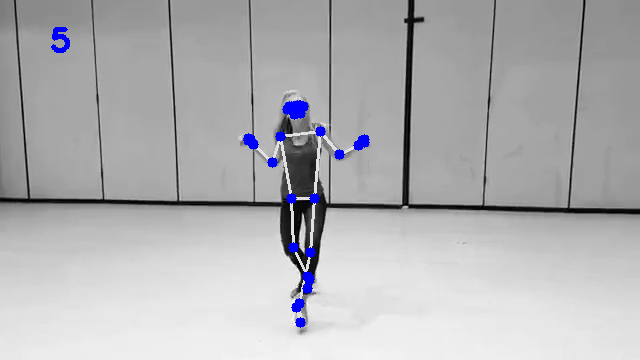

[[0, 295, 110], [1, 296, 105], [2, 298, 105], [3, 300, 105], [4, 292, 106], [5, 291, 107], [6, 290, 107], [7, 304, 107], [8, 287, 110], [9, 299, 114], [10, 293, 115], [11, 320, 131], [12, 281, 135], [13, 341, 153], [14, 272, 161], [15, 354, 139], [16, 253, 143], [17, 361, 133], [18, 248, 138], [19, 360, 131], [20, 248, 135], [21, 358, 133], [22, 250, 137], [23, 315, 199], [24, 292, 199], [25, 309, 253], [26, 288, 248], [27, 300, 303], [28, 309, 263], [29, 298, 309], [30, 314, 266], [31, 299, 324], [32, 311, 284]]


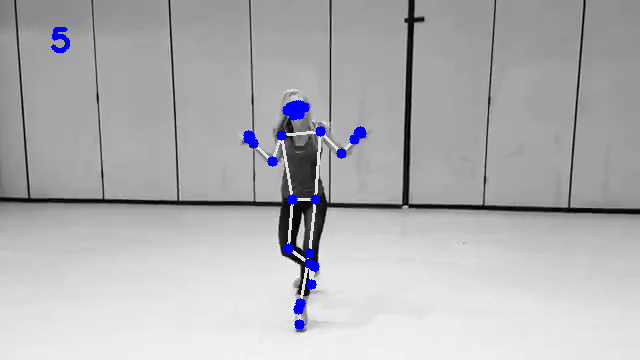

[[0, 295, 110], [1, 296, 105], [2, 298, 105], [3, 300, 105], [4, 292, 106], [5, 291, 107], [6, 290, 107], [7, 304, 107], [8, 288, 110], [9, 299, 114], [10, 293, 114], [11, 321, 132], [12, 282, 137], [13, 340, 154], [14, 275, 165], [15, 349, 143], [16, 253, 151], [17, 355, 137], [18, 248, 147], [19, 355, 135], [20, 248, 145], [21, 352, 137], [22, 250, 146], [23, 314, 201], [24, 291, 201], [25, 309, 254], [26, 285, 250], [27, 301, 306], [28, 308, 257], [29, 300, 313], [30, 311, 255], [31, 300, 325], [32, 307, 273]]


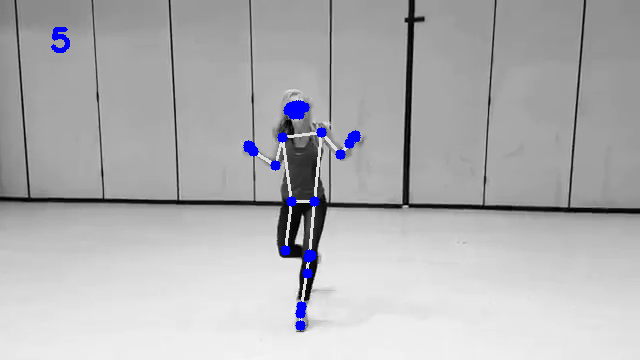

[[0, 294, 109], [1, 297, 105], [2, 299, 105], [3, 301, 105], [4, 292, 106], [5, 291, 106], [6, 289, 107], [7, 304, 107], [8, 288, 110], [9, 299, 113], [10, 293, 114], [11, 322, 135], [12, 282, 136], [13, 340, 163], [14, 281, 167], [15, 332, 142], [16, 259, 164], [17, 330, 135], [18, 252, 163], [19, 329, 132], [20, 252, 161], [21, 328, 134], [22, 254, 162], [23, 314, 202], [24, 291, 204], [25, 308, 258], [26, 285, 254], [27, 302, 306], [28, 302, 242], [29, 301, 312], [30, 303, 243], [31, 302, 326], [32, 304, 259]]


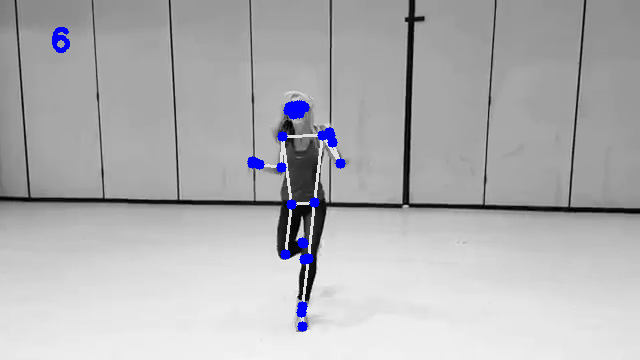

[[0, 299, 113], [1, 300, 109], [2, 302, 108], [3, 304, 108], [4, 296, 109], [5, 294, 110], [6, 293, 110], [7, 306, 111], [8, 291, 113], [9, 302, 117], [10, 296, 118], [11, 322, 138], [12, 282, 139], [13, 330, 166], [14, 282, 168], [15, 342, 169], [16, 261, 176], [17, 348, 171], [18, 255, 177], [19, 348, 172], [20, 256, 176], [21, 344, 170], [22, 257, 175], [23, 315, 205], [24, 291, 205], [25, 308, 259], [26, 284, 253], [27, 302, 309], [28, 296, 245], [29, 300, 314], [30, 299, 235], [31, 301, 325], [32, 299, 257]]


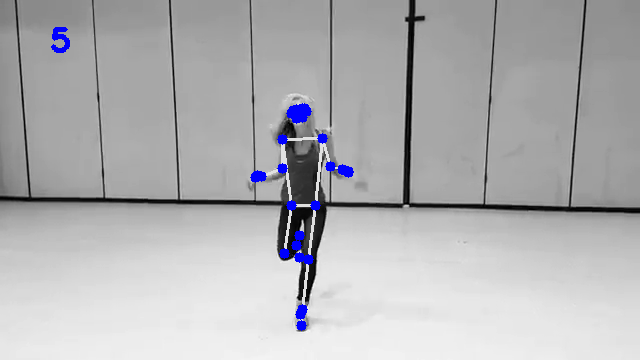

[[0, 299, 116], [1, 301, 113], [2, 302, 112], [3, 304, 112], [4, 296, 114], [5, 295, 114], [6, 294, 115], [7, 307, 115], [8, 292, 118], [9, 303, 120], [10, 298, 120], [11, 324, 142], [12, 284, 145], [13, 333, 174], [14, 280, 175], [15, 355, 192], [16, 257, 185], [17, 360, 196], [18, 252, 188], [19, 360, 196], [20, 252, 187], [21, 357, 195], [22, 253, 186], [23, 314, 207], [24, 293, 208], [25, 308, 259], [26, 285, 255], [27, 302, 309], [28, 302, 252], [29, 301, 312], [30, 306, 247], [31, 303, 322], [32, 307, 264]]


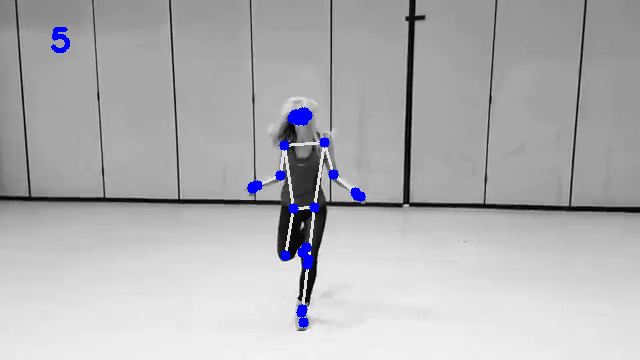

[[0, 302, 117], [1, 304, 114], [2, 305, 114], [3, 307, 114], [4, 300, 115], [5, 298, 115], [6, 297, 116], [7, 309, 117], [8, 294, 119], [9, 305, 122], [10, 301, 122], [11, 323, 144], [12, 283, 144], [13, 332, 172], [14, 282, 173], [15, 351, 185], [16, 255, 179], [17, 357, 189], [18, 250, 180], [19, 357, 189], [20, 251, 179], [21, 355, 188], [22, 252, 179], [23, 315, 207], [24, 292, 208], [25, 308, 259], [26, 284, 254], [27, 302, 309], [28, 298, 251], [29, 301, 315], [30, 302, 246], [31, 302, 325], [32, 302, 263]]


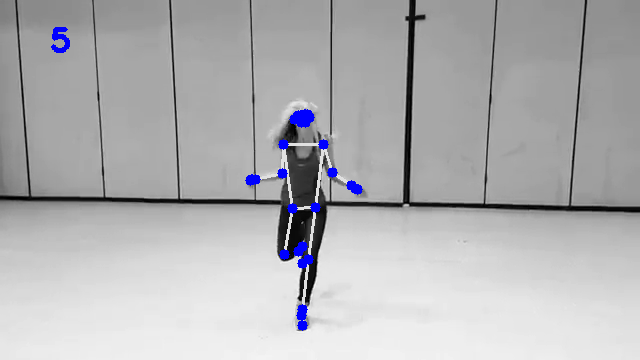

[[0, 306, 112], [1, 308, 110], [2, 309, 110], [3, 310, 110], [4, 304, 110], [5, 302, 110], [6, 301, 111], [7, 312, 114], [8, 298, 114], [9, 309, 117], [10, 303, 117], [11, 324, 140], [12, 285, 138], [13, 332, 167], [14, 285, 135], [15, 355, 175], [16, 298, 112], [17, 361, 177], [18, 301, 106], [19, 361, 177], [20, 302, 105], [21, 359, 176], [22, 302, 108], [23, 315, 205], [24, 291, 206], [25, 308, 260], [26, 284, 254], [27, 302, 308], [28, 297, 248], [29, 301, 314], [30, 300, 244], [31, 302, 325], [32, 301, 259]]


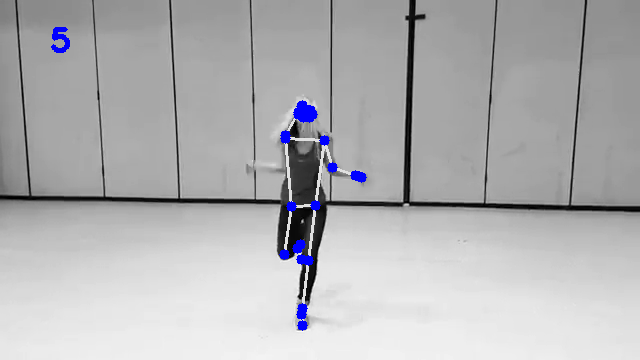

[[0, 305, 110], [1, 306, 107], [2, 308, 107], [3, 309, 107], [4, 303, 107], [5, 301, 107], [6, 300, 107], [7, 312, 110], [8, 298, 110], [9, 308, 114], [10, 302, 115], [11, 324, 134], [12, 286, 135], [13, 336, 158], [14, 278, 161], [15, 356, 161], [16, 254, 153], [17, 365, 160], [18, 249, 151], [19, 366, 159], [20, 250, 149], [21, 362, 160], [22, 251, 150], [23, 315, 201], [24, 291, 200], [25, 308, 256], [26, 284, 249], [27, 302, 305], [28, 298, 243], [29, 301, 310], [30, 303, 239], [31, 303, 318], [32, 302, 254]]


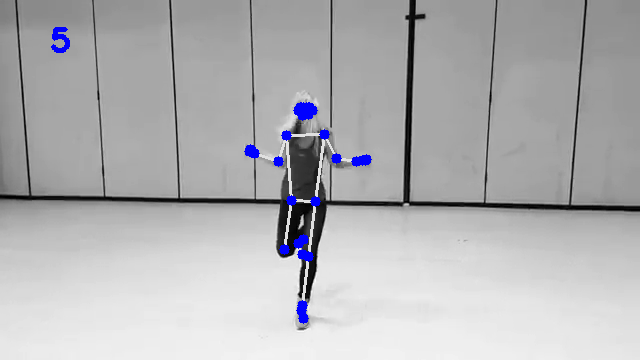

[[0, 305, 105], [1, 308, 101], [2, 309, 101], [3, 310, 101], [4, 303, 101], [5, 302, 101], [6, 300, 102], [7, 313, 103], [8, 298, 104], [9, 308, 109], [10, 303, 109], [11, 326, 129], [12, 286, 129], [13, 340, 154], [14, 275, 157], [15, 357, 147], [16, 254, 137], [17, 365, 143], [18, 249, 133], [19, 366, 140], [20, 250, 131], [21, 362, 142], [22, 251, 132], [23, 315, 195], [24, 292, 194], [25, 308, 251], [26, 284, 246], [27, 302, 308], [28, 298, 232], [29, 301, 314], [30, 301, 227], [31, 303, 324], [32, 303, 243]]


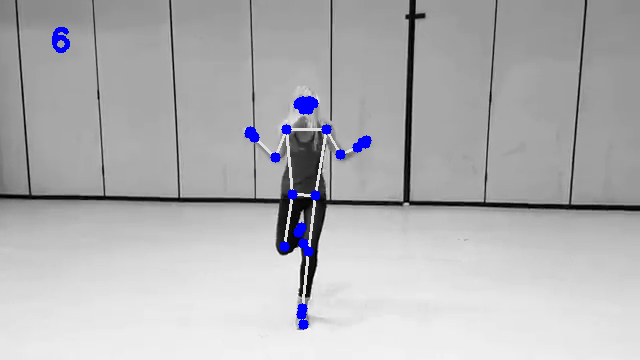

[[0, 304, 102], [1, 307, 98], [2, 309, 98], [3, 310, 98], [4, 302, 98], [5, 300, 98], [6, 298, 99], [7, 312, 99], [8, 297, 100], [9, 308, 107], [10, 301, 107], [11, 325, 122], [12, 286, 123], [13, 345, 145], [14, 272, 151], [15, 360, 128], [16, 257, 130], [17, 365, 122], [18, 252, 125], [19, 365, 118], [20, 253, 121], [21, 363, 121], [22, 254, 123], [23, 316, 191], [24, 292, 191], [25, 308, 246], [26, 285, 243], [27, 304, 299], [28, 309, 244], [29, 303, 305], [30, 313, 245], [31, 302, 320], [32, 313, 261]]


In [ ]:
if __name__ == "__main__":
    main()